# Dữ liệu

## Gọi bộ dữ liệu

In [95]:
import pandas as pd

In [96]:
# Gọi bộ dữ liệu đã lưu, trong folder /content, đã chia Train/Valid 
path = "../data/preprocessed_data"
train_valid_processed_comments = pd.read_csv(f"{path}/preprocessed_hus_fb.csv")
test_processed_comments = pd.read_csv(f"{path}/preprocessed_test.csv")

In [97]:
train_valid_processed_comments.shape, test_processed_comments.shape

((4521, 3), (688, 3))

In [98]:
test_processed_comments.head(3)

,Sentence,Emotion,Tokenized_Sentence
0,người ta có bạn bè nhìn vui thật,Sadness,"['người', 'ta', 'bạn bè', 'nhìn', 'vui']"
1,cho nghỉ viêc mói đúng sao goi là kỷ luật,Surprise,"['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', ..."
2,kinh vãi phẫn_nộ,Disgust,"['kinh vãi', 'phẫn_nộ']"


## Chuyển đổi cột *Tokenized_Sentence* về danh sách từ

In [99]:
texts = test_processed_comments['Tokenized_Sentence']

# Kiểm tra kiểu phần tử
print("Kiểu phần tử:", type(texts.iloc[0]))
print("5 phần tử đầu tiên:", texts.iloc[:5].tolist())

Kiểu phần tử: <class 'str'>
5 phần tử đầu tiên: ["['người', 'ta', 'bạn bè', 'nhìn', 'vui']", "['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật']", "['kinh vãi', 'phẫn_nộ']", "['nhà', 'không', 'xa', 'lắm', 'nhưng', 'chưa', 'bao giờ', 'sợ', 'đè bẹp', 'luôn', 'người', 'cười']", "['bố', 'không', 'thích', 'nộp', 'đấy', 'mày', 'thích', 'ý kiến', 'không']"]


**Do dữ liệu đã được tiền xử lý và lưu dưới dạng chuỗi, ta cần chuyển đổi chúng trở lại thành danh sách từ**

In [100]:
import ast

# Sử dụng hàm literal_eval để chuyển chuỗi thành danh sách
train_valid_processed_comments['Tokenized_Sentence'] = train_valid_processed_comments['Tokenized_Sentence'].apply(ast.literal_eval)
test_processed_comments['Tokenized_Sentence'] = test_processed_comments['Tokenized_Sentence'].apply(ast.literal_eval)

In [101]:
texts = test_processed_comments['Tokenized_Sentence']

# Kiểm tra kiểu phần tử sau khi chuyển đổi
print("Kiểu phần tử:", type(texts.iloc[0]))
print("5 phần tử đầu tiên:", texts.iloc[:5].tolist())

Kiểu phần tử: <class 'list'>
5 phần tử đầu tiên: [['người', 'ta', 'bạn bè', 'nhìn', 'vui'], ['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật'], ['kinh vãi', 'phẫn_nộ'], ['nhà', 'không', 'xa', 'lắm', 'nhưng', 'chưa', 'bao giờ', 'sợ', 'đè bẹp', 'luôn', 'người', 'cười'], ['bố', 'không', 'thích', 'nộp', 'đấy', 'mày', 'thích', 'ý kiến', 'không']]


# Tiền xử lý

## Tách các tập Train - Validation - Test và label

In [102]:
from sklearn.model_selection import train_test_split

In [103]:
def split_train_valid_test(df_train_valid, df_test, train_size, valid_size, random_state=11):
    X_train, X_valid, y_train, y_valid = train_test_split(
        df_train_valid.drop('Emotion', axis=1),
        df_train_valid['Emotion'],
        test_size=valid_size/(train_size + valid_size),
        random_state=random_state,
        stratify=df_train_valid['Emotion']
    )

    X_test = df_test.drop('Emotion', axis=1)
    y_test = df_test['Emotion']

    return X_train, X_valid, X_test, y_train, y_valid, y_test

## TF-IDF
**TF-IDF = Term Frequency * Inverse Document Frequency**
- Từ xuất hiện nhiều trong câu nhưng ít trong toàn bộ corpus => trọng số cao
- Từ phổ biến (stop words) => trọng số thấp

In [104]:
from sklearn.feature_extraction.text import TfidfVectorizer

def tfidf_embedding(tokens, max_features=8000, min_df=2, max_df=0.95):
    # Chuyển đổi danh sách token thành TF-IDF representation
    # max_features : Số lượng từ vựng tối đa mà  (mặc định: 8000)
    # tokens: Danh sách các token

    # Chuyển danh sách token thành chuỗi văn bản
    texts = [' '.join(token_list) for token_list in tokens]

    # Khởi tạo TfidfVectorizer
    vectorizer = TfidfVectorizer(
        max_features=max_features,
        ngram_range=(1, 2), # Sử dụng unigram và bigram
        min_df=min_df,           # Bỏ qua từ xuất hiện < min_df lần
        max_df=max_df         # Bỏ qua từ xuất hiện > max_df documents
    )

    # fit_transform
    # ma trận TF-IDF (n_samples x n_features)
    tfidf_matrix = vectorizer.fit_transform(texts)

    print("TF-IDF hoàn thành!")
    print(f"Shape: {tfidf_matrix.shape} (số câu x số từ vựng)")
    print("Số từ vựng:", len(vectorizer.get_feature_names_out()))
    print("TF-IDF - Non-zero values:", tfidf_matrix.nnz)

    return tfidf_matrix, vectorizer

In [105]:
def tfidf_transform(tokens, tfidf_vectorizer):
    texts = [' '.join(token_list) for token_list in tokens]
    return tfidf_vectorizer.transform(texts)

## Chuyển sang mảng numpy

In [106]:
def convert_to_array(tfidf_matrix):
    return tfidf_matrix.toarray()

In [107]:
def convert_full_to_array(train_tfidf_matrix, valid_tfidf_matrix, test_tfidf_matrix):
    return convert_to_array(train_tfidf_matrix), convert_to_array(valid_tfidf_matrix), convert_to_array(test_tfidf_matrix)

# Giảm chiều

## PCA
Giữ lại 90% thông tin sau khi PCA

In [108]:
from sklearn.decomposition import PCA

In [109]:
def pca(X_train_arr, X_test_arr, X_valid_arr, n_components=0.9):
    pca_model = PCA(n_components=n_components)
    X_train_pca = pca_model.fit_transform(X_train_arr)
    X_test_pca = pca_model.transform(X_test_arr)
    X_valid_pca = pca_model.transform(X_valid_arr)

    return pca_model, X_train_pca, X_test_pca, X_valid_pca

## LDA

- Tìm ma trận W chiếu DL vào không gian LDA
- Sau khi học được W, tính các hàm phân biệt tuyến tính (linear discriminats) để dự đoán lớp
- Thay vì mỗi TPC giữ một phần thông tin như PCA, thì LDA sẽ giữ một phần thông tin giúp phân biệt giữa các lớp
- Vì thế, LDA có thể giảm còn số chiều max là (n-1) chiều (n là số nhãn)

In [110]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

### LDA còn 6 chiều

In [111]:
def lda(X_train_arr, y_train, X_test_arr, X_valid_arr, n_components):
    lda = LDA(n_components=n_components)
    X_train_lda =lda.fit_transform(X_train_arr, y_train)
    X_test_lda = lda.transform(X_test_arr)
    X_valid_lda = lda.transform(X_valid_arr)

    return lda, X_train_lda, X_test_lda, X_valid_lda

- LDA tìm ra 6 hướng giúp phân biệt tâm của 7 label
- Các vector riêng của S_w^-1 * S_B mô tả toàn bộ thông tin phân biệt giữa các lớp, tức là TOÀN BỘ KHẢ NĂNG PHÂN BIỆT đã ở trong 6 chiều này

## Hàm lựa chọn giảm chiều theo cách nào

In [112]:
def use_discriminant(X_train_arr, y_train, X_test_arr, X_valid_arr, discriminant="none", n_components_pca=0.9, n_components_lda=6):
    if discriminant == "pca":
        return pca(X_train_arr, X_test_arr, X_valid_arr, n_components_pca)

    elif discriminant == "lda":
        return lda(X_train_arr, y_train, X_test_arr, X_valid_arr, n_components_lda)

    return None, X_train_arr, X_test_arr, X_valid_arr

# Model phân loại

In [113]:
import time

## HOI QUY SOFTMAX - MULTINOMIAL LOGISTIC REGRESSION

In [114]:
from sklearn.linear_model import LogisticRegression

In [115]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [116]:
def log_reg(X_train, y_train, random_state=11, max_iter=1000):
    log_reg = LogisticRegression(
        multi_class='multinomial',
        class_weight='balanced',
        random_state=random_state,
        max_iter=max_iter)

    log_reg.fit(X_train, y_train)

    return log_reg

## K-NN

In [117]:
from sklearn.neighbors import KNeighborsClassifier

In [118]:
def knn(X_train, y_train, metric = 'cosine'):
    knn = KNeighborsClassifier(
    n_neighbors=83,
    metric=metric,
    n_jobs=-1)  # Dùng tất cả CPU cores để tăng tốc độ chạy

    knn.fit(X_train, y_train)

    return knn

## Hàm lựa chọn mô hình và dự đoán

In [119]:
def use_model(model_type, X_train_processed, y_train, metric='cosine', max_iter=1000,
              C=1.0, svm_kernel='rbf', svm_gamma='scale', svm_degree=3,
              tree_max_depth=None, nb_alpha=1.0,
              mlp_hidden=(128,), mlp_alpha=1e-4,
              random_state=11):
    if model_type == 'logistic_regression':
        model = LogisticRegression(
            C=C,
            multi_class='multinomial',
            class_weight='balanced',
            max_iter=max_iter,
            random_state=random_state
        )
    elif model_type == 'knn':
        model = knn(X_train_processed, y_train, metric)
    elif model_type == 'svm':
        if svm_kernel == 'linear':
            model = LinearSVC(C=C, class_weight='balanced', random_state=random_state)
        elif svm_kernel == 'poly':
            model = SVC(C=C, kernel='poly', degree=svm_degree, gamma=svm_gamma, class_weight='balanced', random_state=random_state)
        else:
            model = SVC(C=C, kernel=svm_kernel, gamma=svm_gamma, class_weight='balanced', random_state=random_state)
    elif model_type == 'naive_bayes':
        model = MultinomialNB(alpha=nb_alpha)
    elif model_type == 'decision_tree':
        model = DecisionTreeClassifier(
            max_depth=tree_max_depth,
            min_samples_leaf=2,
            random_state=random_state
        )
    elif model_type == 'mlp':
        model = MLPClassifier(
            hidden_layer_sizes=mlp_hidden,
            alpha=mlp_alpha,
            max_iter=max_iter,
            random_state=random_state
        )
    else:
        raise ValueError(f'Unknown model_type: {model_type}')

    if model_type in ['knn']:
        # KNN is trained inside knn()
        return model

    model.fit(X_train_processed, y_train)
    return model


In [120]:
def predict(model, X_train, X_valid, X_test):
    # model là log_reg, knn hoặc svm

    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)

    return y_pred_train, y_pred_valid, y_pred_test

## Đánh giá độ chính xác và trực quan

### Đánh giá độ chính xác

In [121]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [122]:
def get_metrics(y_true, y_pred):
    return accuracy_score(y_true, y_pred), precision_score(y_true, y_pred, average='weighted'), recall_score(y_true, y_pred, average='weighted'), f1_score(y_true, y_pred, average='weighted')

In [123]:
def get_full_data_metrics(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test):
    accuracy_train, precision_train, recall_train, f1_train = get_metrics(y_train, y_pred_train)
    accuracy_valid, precision_valid, recall_valid, f1_valid = get_metrics(y_valid, y_pred_valid)
    accuracy_test, precision_test, recall_test, f1_test = get_metrics(y_test, y_pred_test)

    return [accuracy_train, precision_train, recall_train, f1_train], [accuracy_valid, precision_valid, recall_valid, f1_valid], [accuracy_test, precision_test, recall_test, f1_test]

In [124]:
def print_metrics(accuracy, precision, recall, f1):
    print("Accuracy:", accuracy)
    print("Recall:", recall)
    print("Precision:", precision)
    print("F1-score:", f1)

### Trực quan

In [125]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [126]:
# vẽ ma trận nhầm lẫn
def plot_normalized_confusion_matrix(y_true, y_pred, title='Normalized Confusion Matrix'):
    cm_normalized = confusion_matrix(y_true, y_pred, normalize='true')
    classes = np.unique(y_true)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [127]:
# hàm vẽ cả 3 ma trận nhầm lẫn cho cả 3 tập train - valid - test
def plot_full_normalized_confusion_matrix(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test,
                                          title='Normalized Confusion Matrix', discriminant="none", model_type="logistic_regression"):
    plot_normalized_confusion_matrix(y_train, y_pred_train, title=title + " Train " + discriminant + " " + model_type)
    plot_normalized_confusion_matrix(y_valid, y_pred_valid, title=title + " Valid " + discriminant + " " + model_type)
    plot_normalized_confusion_matrix(y_test, y_pred_test, title=title + " Test " + discriminant + " " + model_type)

# Pipeline cho bài toán phân loại

## Chuẩn bị dữ liệu 

In [128]:
def prepare_data_for_modeling(df_train_valid, df_test, train_size, valid_size, random_state=11,
                              min_df=2, max_df=0.95, max_features=8000,
                              discriminant="none", n_components_pca=0.9, n_components_lda=6):
    "TF-IDF, PCA/LDA trước khi vào pipeline modeling"
    
    # Chia train-valid
    X_train, X_valid, X_test, y_train, y_valid, y_test = split_train_valid_test(
        df_train_valid, df_test, train_size, valid_size, random_state
    )

    # TF-IDF Vectorization
    train_tfidf_matrix, tfidf_vectorizer = tfidf_embedding(
        X_train['Tokenized_Sentence'], 
        max_features=max_features, 
        min_df=min_df, 
        max_df=max_df
    )

    # Transform cho valid và test
    valid_tfidf_matrix = tfidf_transform(X_valid['Tokenized_Sentence'], tfidf_vectorizer)
    test_tfidf_matrix = tfidf_transform(X_test['Tokenized_Sentence'], tfidf_vectorizer)

    # Chuyển sang mảng numpy
    X_train_processed, X_valid_processed, X_test_processed = convert_full_to_array(
        train_tfidf_matrix, valid_tfidf_matrix, test_tfidf_matrix
    )

    # Giảm chiều (None / PCA / LDA)
    discriminant_model, X_train_processed, X_test_from_disc, X_valid_from_disc = use_discriminant(
        X_train_processed, y_train, X_test_processed, X_valid_processed,
        discriminant, n_components_pca, n_components_lda
    )
    X_valid_processed = X_valid_from_disc
    X_test_processed = X_test_from_disc

    # Trả về 
    # 1. DL đã processed (TF-IDF và có thể giảm chiều) 
    # 2. Nhãn của tập train - test - valid
    # 3. vectorize đã fit trên train
    # 4. Model giảm chiều đã fit trên train
    return (X_train_processed, X_valid_processed, X_test_processed, 
            y_train, y_valid, y_test, 
            tfidf_vectorizer, discriminant_model)

In [129]:
def pipeline_modeling(X_train, X_valid, X_test, y_train, y_valid, y_test,
                      model_type='logistic_regression', max_iter=1000, metric='cosine', model_params=None):

    if model_params is None:
        model_params = {}

    # Huấn luyện mô hình
    model = use_model(
        model_type, X_train, y_train, metric=metric, max_iter=max_iter, **model_params
    )

    # Dự đoán
    y_pred_train, y_pred_valid, y_pred_test = predict(model, X_train, X_valid, X_test)

    return model, [X_train, y_train], [X_valid, y_valid], [X_test, y_test], [y_pred_train, y_pred_valid, y_pred_test]


## Đánh giá độ chính xác và trực quan

In [130]:
# đánh giá độ chính xác và trực quan
def pipeline_evaluation(y_train, y_valid, y_test,
                        y_pred_train, y_pred_valid, y_pred_test,
                        train_size, valid_size, discriminant, model_type,
                        show_plot=True):

    metrics_train, metrics_valid, metrics_test = get_full_data_metrics(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test)

    # train
    print(f"--- train --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_train[0], metrics_train[1], metrics_train[2], metrics_train[3])

    print()

    # valid
    print(f"--- valid --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_valid[0], metrics_valid[1], metrics_valid[2], metrics_valid[3])

    print()

    # test
    print(f"--- test --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_test[0], metrics_test[1], metrics_test[2], metrics_test[3])

    # trực quan
    if show_plot: plot_full_normalized_confusion_matrix(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test,
                                                        discriminant=discriminant, model_type=model_type)

# **Chạy pipeline**

# Train:Validation = 8:2

## Logistic Regression

### Bộ dữ liệu không giảm chiều

In [131]:
X_train_82, X_valid_82, X_test_82, y_train_82, y_valid_82, y_test_82, tfidf_vec_82, disc_model_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="none"
)

TF-IDF hoàn thành!
Shape: (3616, 5735) (số câu x số từ vựng)
Số từ vựng: 5735
TF-IDF - Non-zero values: 44730


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.8235619469026548
Recall: 0.8235619469026548
Precision: 0.8418352891246146
F1-score: 0.8237644225987104

--- valid --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.5160220994475138
Recall: 0.5160220994475138
Precision: 0.5406328679645406
F1-score: 0.5222239448282885

--- test --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.3793604651162791
Recall: 0.3793604651162791
Precision: 0.4463018378201521
F1-score: 0.3941908540462302


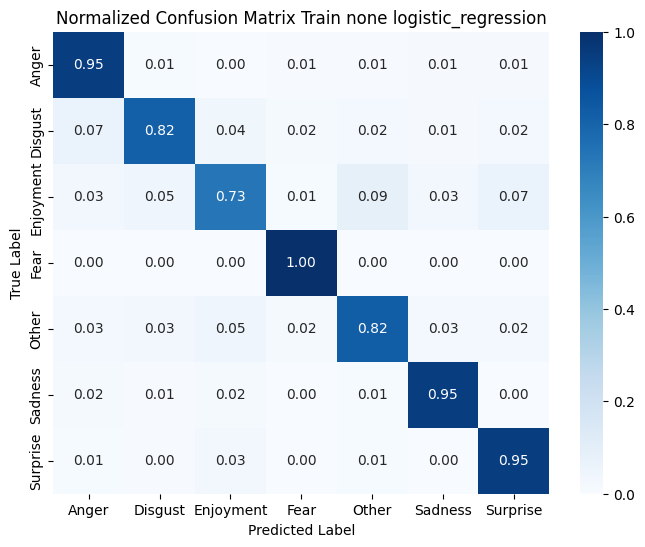

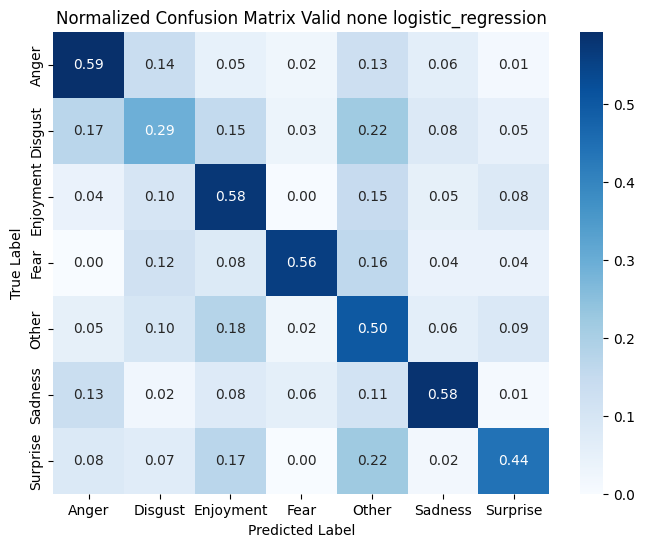

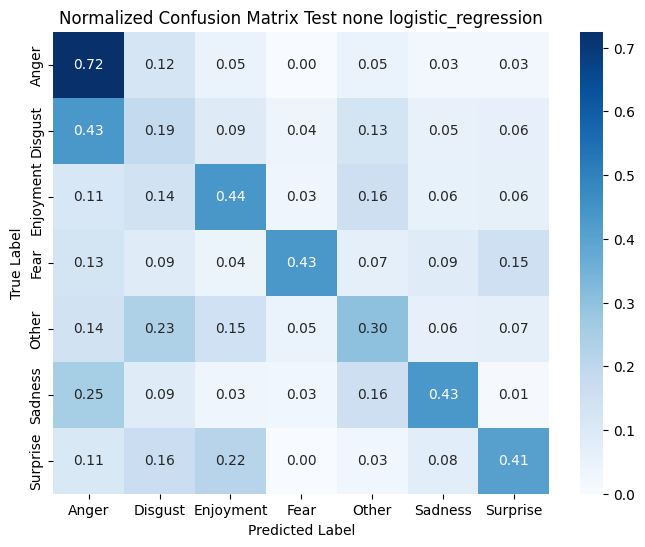

In [132]:
model_82, train_82, valid_82, test_82, pred_82 = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="logistic_regression",
    max_iter=1000
)

# Dự đoán từ pipeline_modeling
y_pred_train_82, y_pred_valid_82, y_pred_test_82 = pred_82

pipeline_evaluation(
    y_train_82, y_valid_82, y_test_82,
    y_pred_train_82, y_pred_valid_82, y_pred_test_82,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (3616, 5735) (số câu x số từ vựng)
Số từ vựng: 5735
TF-IDF - Non-zero values: 44730


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.7842920353982301
Recall: 0.7842920353982301
Precision: 0.8085021247132443
F1-score: 0.7854605016530759

--- valid --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.5093922651933702
Recall: 0.5093922651933702
Precision: 0.5386487717247733
F1-score: 0.5173147388751763

--- test --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.376453488372093
Recall: 0.376453488372093
Precision: 0.4435583399720153
F1-score: 0.39148261207558493


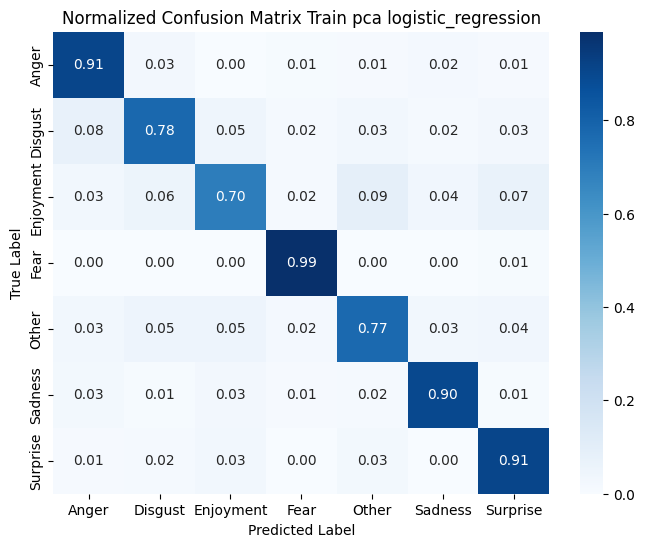

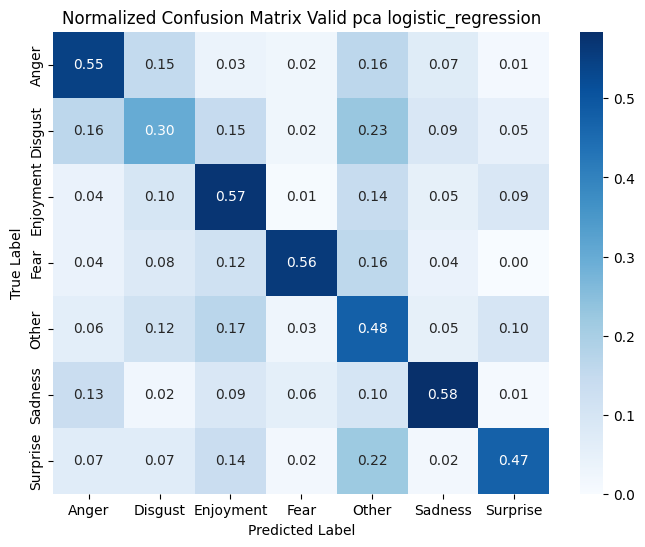

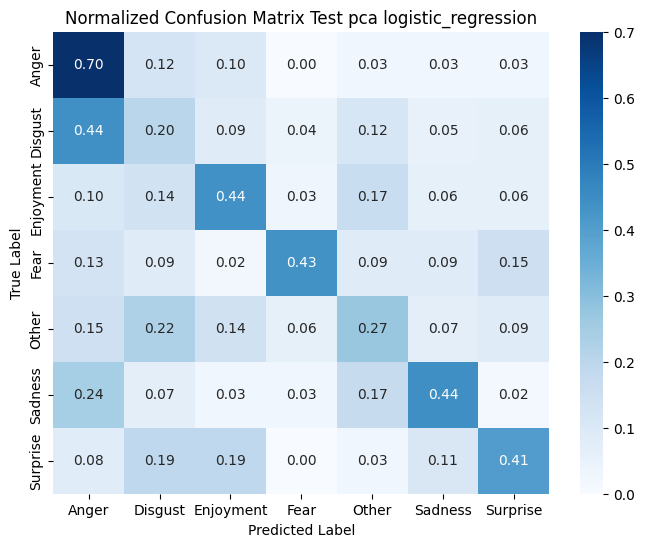

In [133]:
# Chuẩn bị dữ liệu với PCA
X_train_pca_82, X_valid_pca_82, X_test_pca_82, y_train_pca_82, y_valid_pca_82, y_test_pca_82, tfidf_vec_pca_82, disc_model_pca_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="pca"
)

# Chạy mô hình Logistic Regression trên dữ liệu PCA
model_pca_82, train_pca_82, valid_pca_82, test_pca_82, pred_pca_82 = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="logistic_regression",
    max_iter=1000
)

y_train_pca_82, y_valid_pca_82, y_test_pca_82 = train_pca_82[1], valid_pca_82[1], test_pca_82[1]
y_pred_train_pca_82, y_pred_valid_pca_82, y_pred_test_pca_82 = pred_pca_82

pipeline_evaluation(
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    y_pred_train_pca_82, y_pred_valid_pca_82, y_pred_test_pca_82,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (3616, 5735) (số câu x số từ vựng)
Số từ vựng: 5735
TF-IDF - Non-zero values: 44730


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.9914269911504425
Recall: 0.9914269911504425
Precision: 0.9917540794450711
F1-score: 0.9914996189000688

--- valid --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.29171270718232045
Recall: 0.29171270718232045
Precision: 0.3393929264712169
F1-score: 0.30278005643236855

--- test --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.25
Recall: 0.25
Precision: 0.2964828834921371
F1-score: 0.24591594065786326


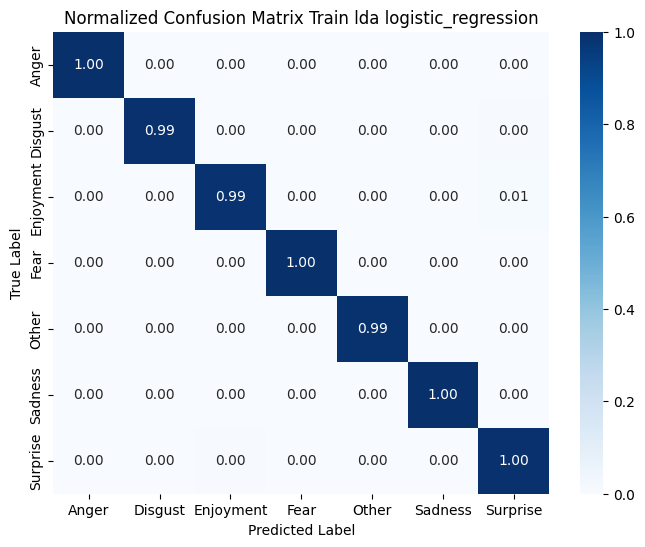

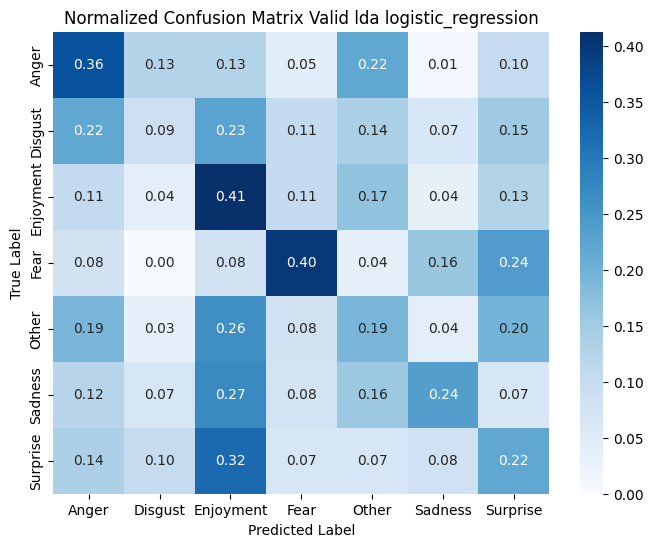

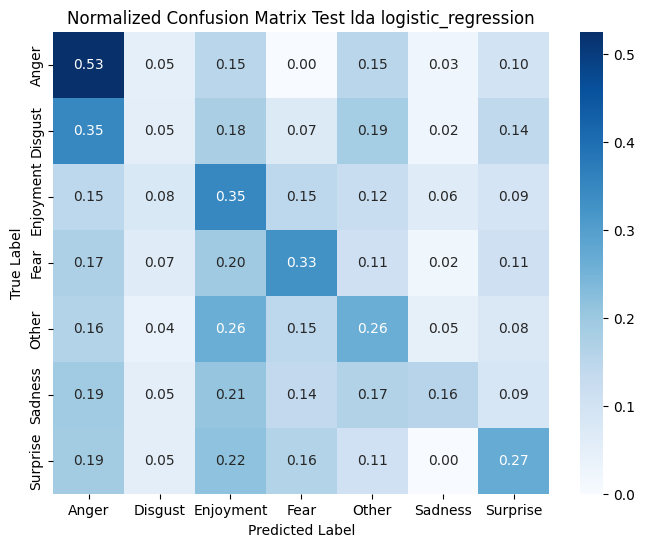

In [134]:
# Chuẩn bị dữ liệu với LDA
X_train_lda_82, X_valid_lda_82, X_test_lda_82, y_train_lda_82, y_valid_lda_82, y_test_lda_82, tfidf_vec_lda_82, disc_model_lda_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="lda"
)

# Chạy mô hình Logistic Regression trên dữ liệu LDA
model_lda_82, train_lda_82, valid_lda_82, test_lda_82, pred_lda_82 = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="logistic_regression",
    max_iter=1000
)

y_train_lda_82, y_valid_lda_82, y_test_lda_82 = train_lda_82[1], valid_lda_82[1], test_lda_82[1]
y_pred_train_lda_82, y_pred_valid_lda_82, y_pred_test_lda_82 = pred_lda_82

pipeline_evaluation(
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    y_pred_train_lda_82, y_pred_valid_lda_82, y_pred_test_lda_82,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- knn --- none ---
Accuracy: 0.4944690265486726
Recall: 0.4944690265486726
Precision: 0.5537989089035869
F1-score: 0.41651349548862177

--- valid --- 8:2 --- knn --- none ---
Accuracy: 0.4585635359116022
Recall: 0.4585635359116022
Precision: 0.45249657292402273
F1-score: 0.3670478885219868

--- test --- 8:2 --- knn --- none ---
Accuracy: 0.3168604651162791
Recall: 0.3168604651162791
Precision: 0.42859577647376984
F1-score: 0.21444302124054673


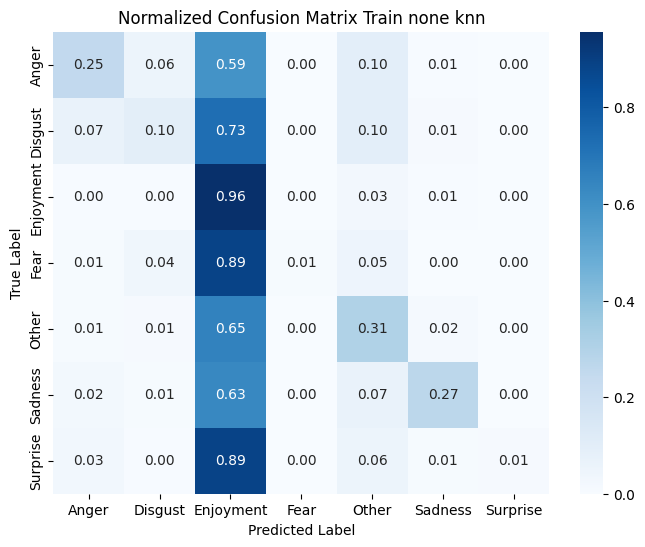

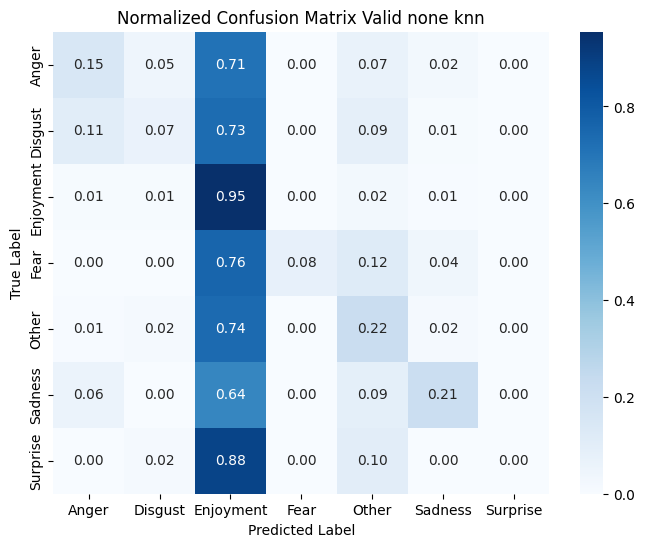

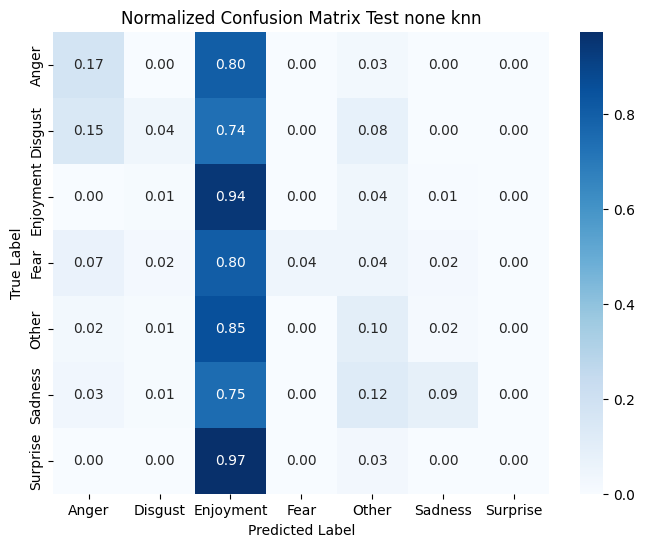

In [135]:
# Chạy KNN - cosine - None
model_82_knn, train_82_knn, valid_82_knn, test_82_knn, pred_82_knn = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="knn"
)

y_train_82_knn, y_valid_82_knn, y_test_82_knn = train_82_knn[1], valid_82_knn[1], test_82_knn[1]
y_pred_train_82_knn, y_pred_valid_82_knn, y_pred_test_82_knn = pred_82_knn

pipeline_evaluation(
    y_train_82_knn, y_valid_82_knn, y_test_82_knn,
    y_pred_train_82_knn, y_pred_valid_82_knn, y_pred_test_82_knn,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.466537610619469
Recall: 0.466537610619469
Precision: 0.5485096412888983
F1-score: 0.3673935802451563

--- valid --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.450828729281768
Recall: 0.450828729281768
Precision: 0.48117357945627987
F1-score: 0.34498535352138976

--- test --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.3023255813953488
Recall: 0.3023255813953488
Precision: 0.43668517017739356
F1-score: 0.17675813338796406


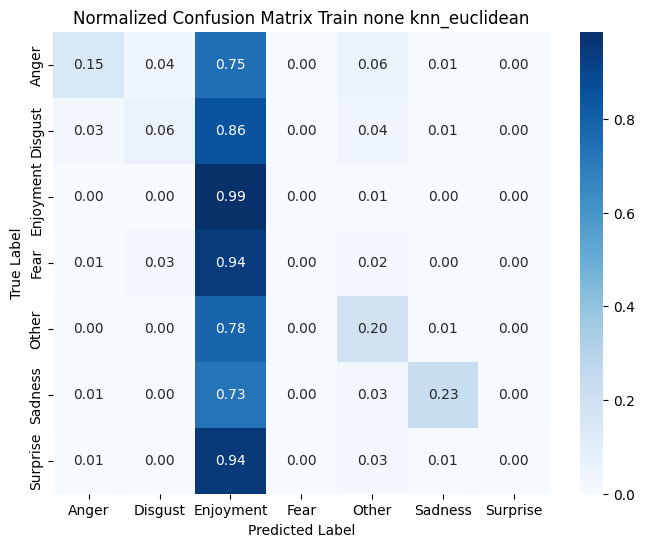

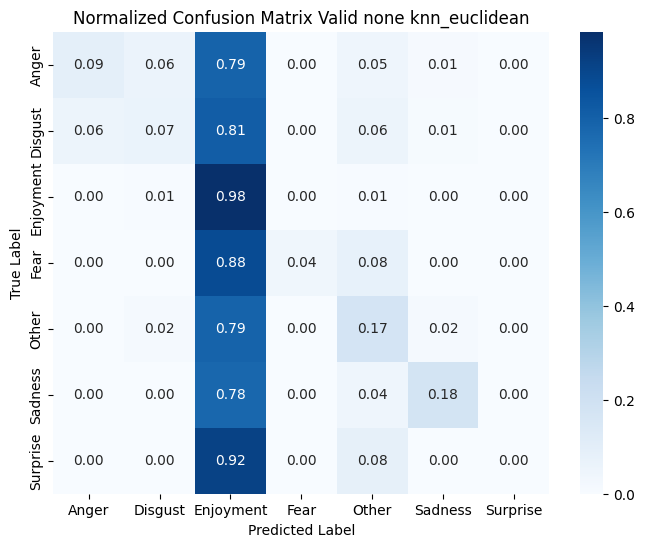

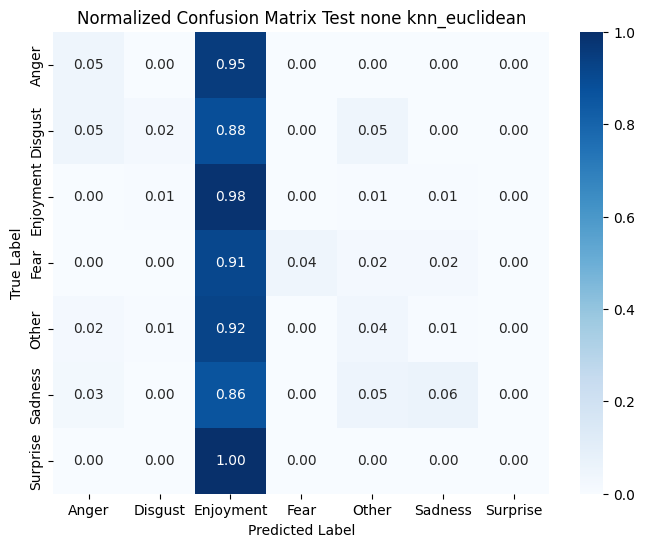

In [136]:
# KNN - euclidean - None
model_82_knn_euclidean, train_82_knn_euclidean, valid_82_knn_euclidean, test_82_knn_euclidean, pred_82_knn_euclidean = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="knn",
    metric="euclidean"
)

y_train_82_knn_euclidean, y_valid_82_knn_euclidean, y_test_82_knn_euclidean = train_82_knn_euclidean[1], valid_82_knn_euclidean[1], test_82_knn_euclidean[1]
y_pred_train_82_knn_euclidean, y_pred_valid_82_knn_euclidean, y_pred_test_82_knn_euclidean = pred_82_knn_euclidean

pipeline_evaluation(
    y_train_82_knn_euclidean, y_valid_82_knn_euclidean, y_test_82_knn_euclidean,
    y_pred_train_82_knn_euclidean, y_pred_valid_82_knn_euclidean, y_pred_test_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

### Bộ dữ liệu PCA

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- knn --- pca ---
Accuracy: 0.4892146017699115
Recall: 0.4892146017699115
Precision: 0.5372435742633652
F1-score: 0.40824091174224275

--- valid --- 8:2 --- knn --- pca ---
Accuracy: 0.46298342541436466
Recall: 0.46298342541436466
Precision: 0.5277699556954781
F1-score: 0.375603931692816

--- test --- 8:2 --- knn --- pca ---
Accuracy: 0.311046511627907
Recall: 0.311046511627907
Precision: 0.39142164806932417
F1-score: 0.2090764947387822


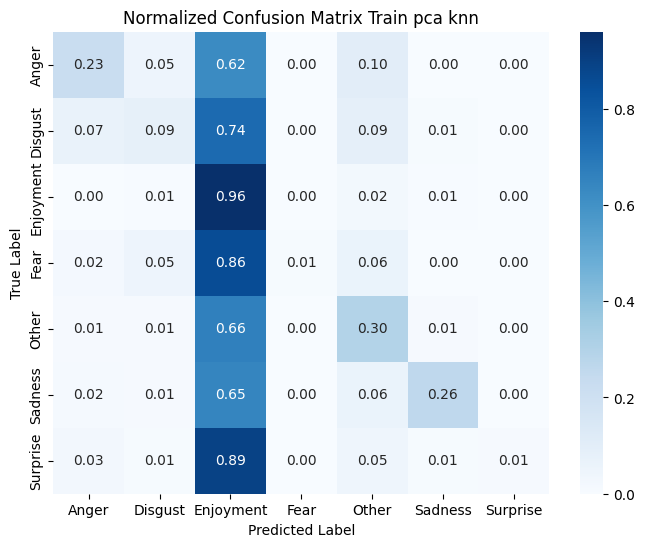

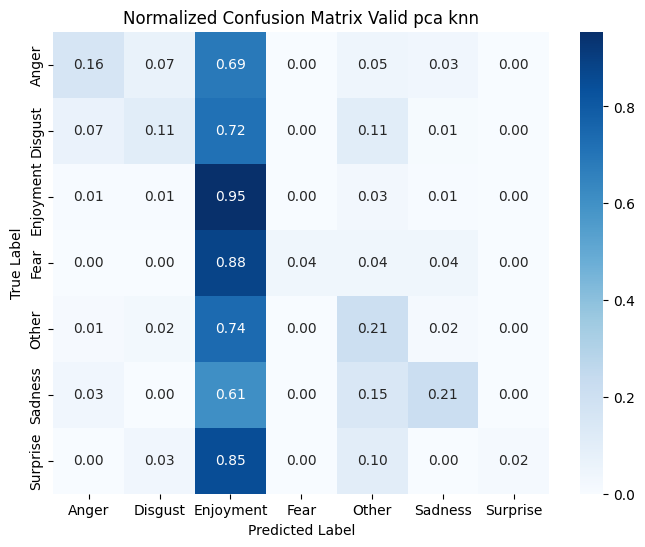

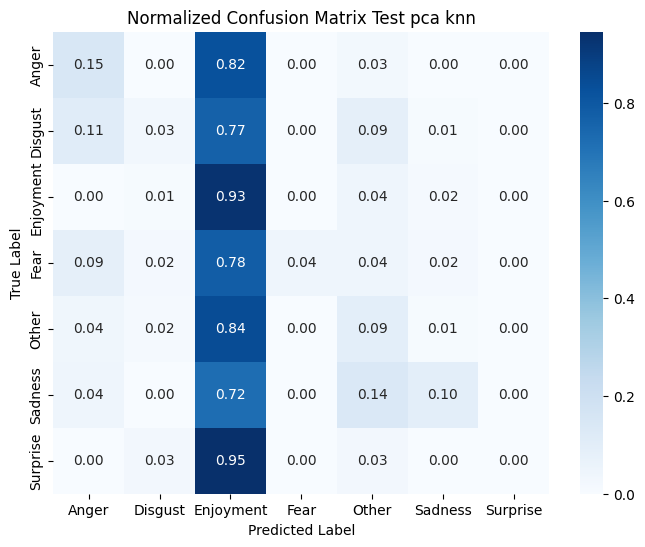

In [137]:
model_pca_82_knn, train_pca_82_knn, valid_pca_82_knn, test_pca_82_knn, pred_pca_82_knn = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="knn",
    max_iter=1000
)

y_train_pca_82_knn, y_valid_pca_82_knn, y_test_pca_82_knn = train_pca_82_knn[1], valid_pca_82_knn[1], test_pca_82_knn[1]
y_pred_train_pca_82_knn, y_pred_valid_pca_82_knn, y_pred_test_pca_82_knn = pred_pca_82_knn

pipeline_evaluation(
    y_train_pca_82_knn, y_valid_pca_82_knn, y_test_pca_82_knn,
    y_pred_train_pca_82_knn, y_pred_valid_pca_82_knn, y_pred_test_pca_82_knn,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.4759402654867257
Recall: 0.4759402654867257
Precision: 0.551321762056946
F1-score: 0.38658319043800893

--- valid --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.4585635359116022
Recall: 0.4585635359116022
Precision: 0.5070653335861747
F1-score: 0.3568104382251388

--- test --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.3066860465116279
Recall: 0.3066860465116279
Precision: 0.4185297168195486
F1-score: 0.19105278166474696


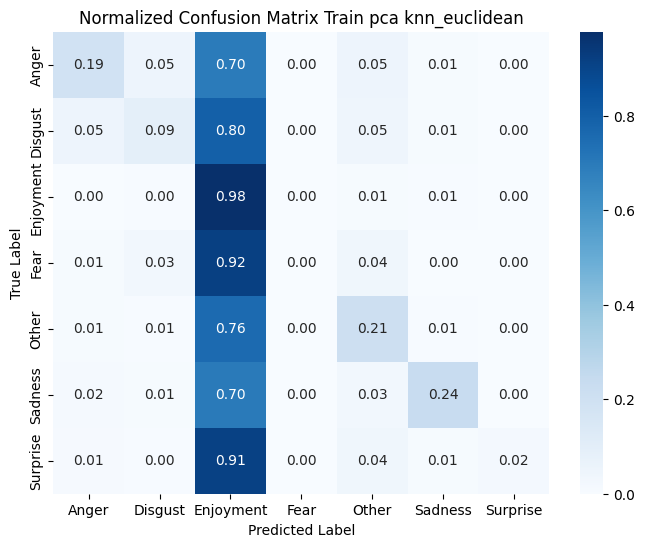

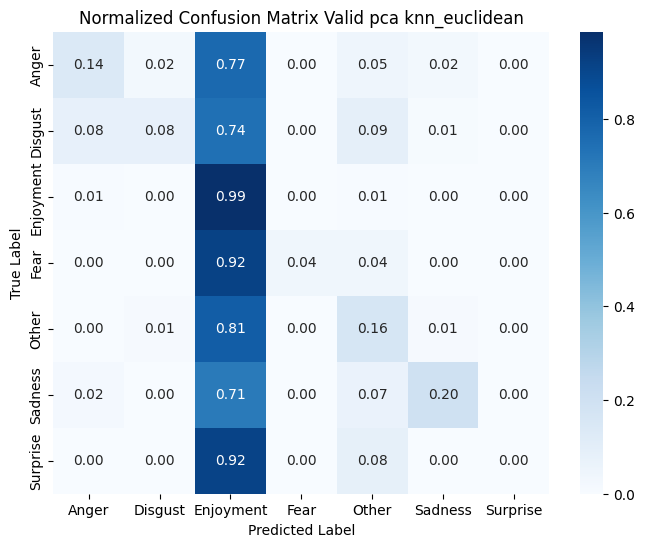

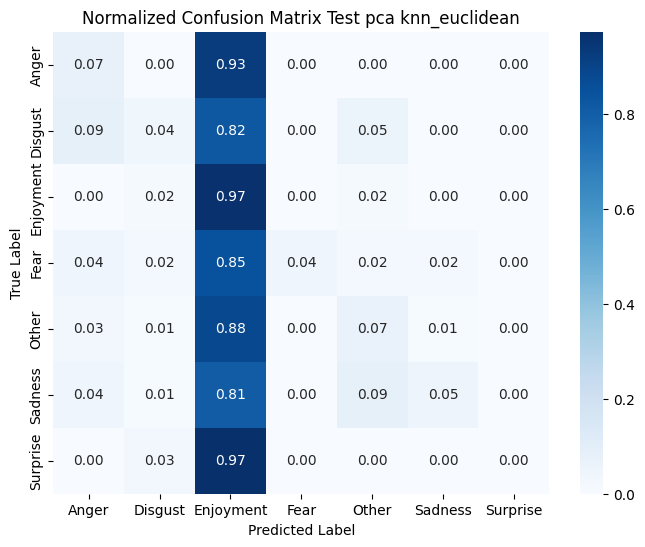

In [138]:
# KNN - euclidean - PCA
model_pca_82_knn_euclidean, train_pca_82_knn_euclidean, valid_pca_82_knn_euclidean, test_pca_82_knn_euclidean, pred_pca_82_knn_euclidean = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_82_knn_euclidean, y_valid_pca_82_knn_euclidean, y_test_pca_82_knn_euclidean = train_pca_82_knn_euclidean[1], valid_pca_82_knn_euclidean[1], test_pca_82_knn_euclidean[1]
y_pred_train_pca_82_knn_euclidean, y_pred_valid_pca_82_knn_euclidean, y_pred_test_pca_82_knn_euclidean = pred_pca_82_knn_euclidean

pipeline_evaluation(
    y_train_pca_82_knn_euclidean, y_valid_pca_82_knn_euclidean, y_test_pca_82_knn_euclidean,
    y_pred_train_pca_82_knn_euclidean, y_pred_valid_pca_82_knn_euclidean, y_pred_test_pca_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.9936393805309734
Recall: 0.9936393805309734
Precision: 0.9936674545679475
F1-score: 0.9936325651071732

--- valid --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.3116022099447514
Recall: 0.3116022099447514
Precision: 0.3480577933177299
F1-score: 0.32248516490637175

--- test --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.26453488372093026
Recall: 0.26453488372093026
Precision: 0.3058292531975741
F1-score: 0.27138059541759324


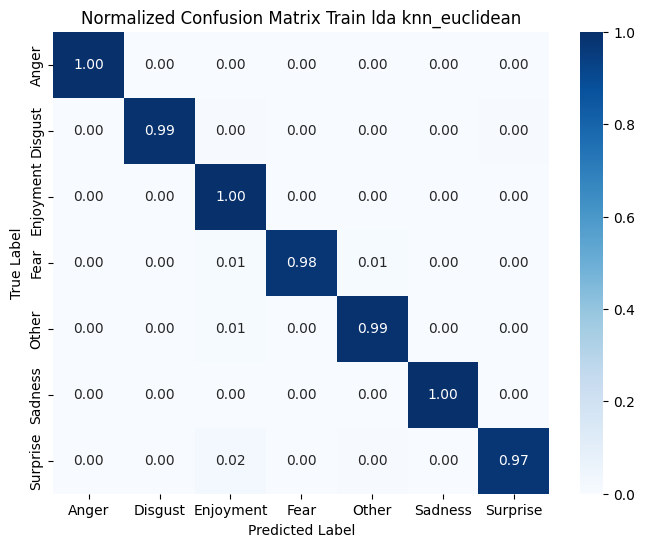

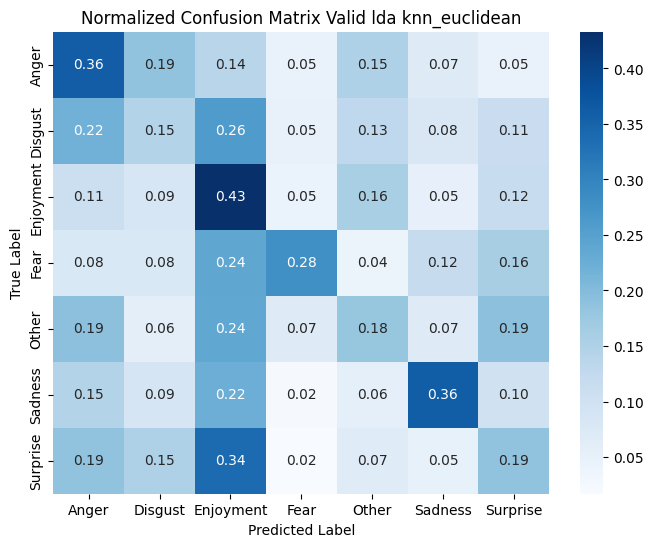

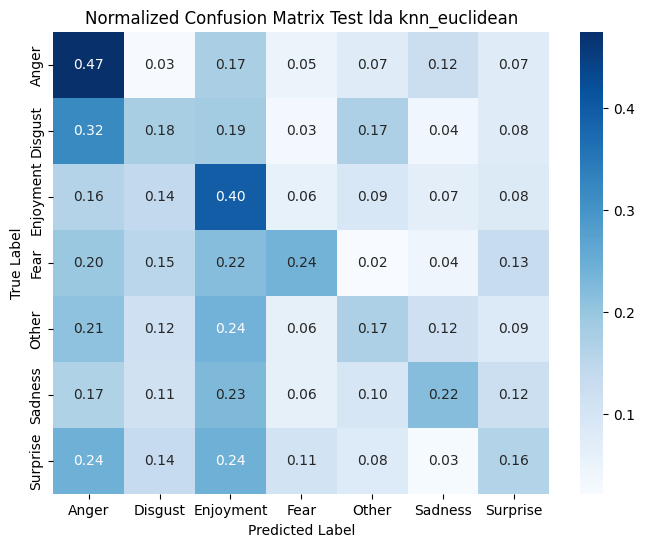

In [139]:
# KNN - euclidean - LDA
model_lda_82_knn_euclidean, train_lda_82_knn_euclidean, valid_lda_82_knn_euclidean, test_lda_82_knn_euclidean, pred_lda_82_knn_euclidean = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_82_knn_euclidean, y_valid_lda_82_knn_euclidean, y_test_lda_82_knn_euclidean = train_lda_82_knn_euclidean[1], valid_lda_82_knn_euclidean[1], test_lda_82_knn_euclidean[1]
y_pred_train_lda_82_knn_euclidean, y_pred_valid_lda_82_knn_euclidean, y_pred_test_lda_82_knn_euclidean = pred_lda_82_knn_euclidean

pipeline_evaluation(
    y_train_lda_82_knn_euclidean, y_valid_lda_82_knn_euclidean, y_test_lda_82_knn_euclidean,
    y_pred_train_lda_82_knn_euclidean, y_pred_valid_lda_82_knn_euclidean, y_pred_test_lda_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 8:2 --- knn --- lda ---
Accuracy: 0.9900442477876106
Recall: 0.9900442477876106
Precision: 0.9903676287865218
F1-score: 0.9901138887073128

--- valid --- 8:2 --- knn --- lda ---
Accuracy: 0.2906077348066298
Recall: 0.2906077348066298
Precision: 0.3469306814784838
F1-score: 0.3025534082102967

--- test --- 8:2 --- knn --- lda ---
Accuracy: 0.23401162790697674
Recall: 0.23401162790697674
Precision: 0.2934734889241564
F1-score: 0.24216404341031827


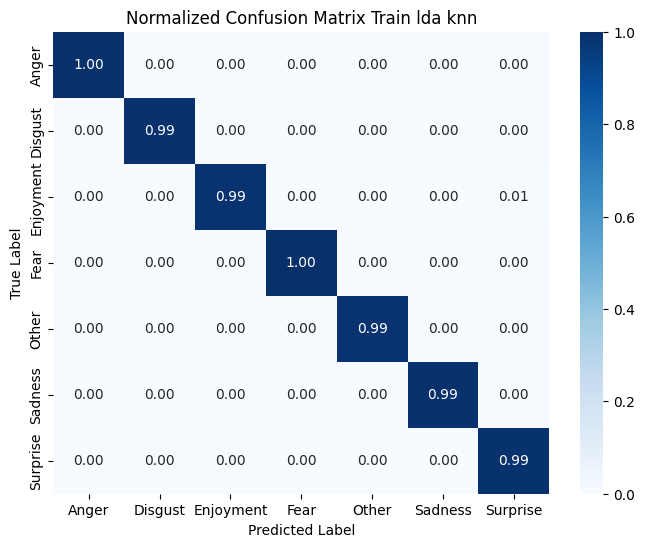

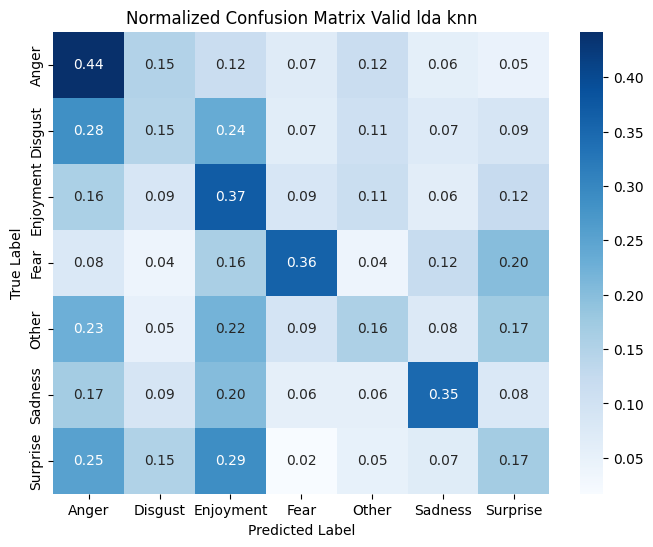

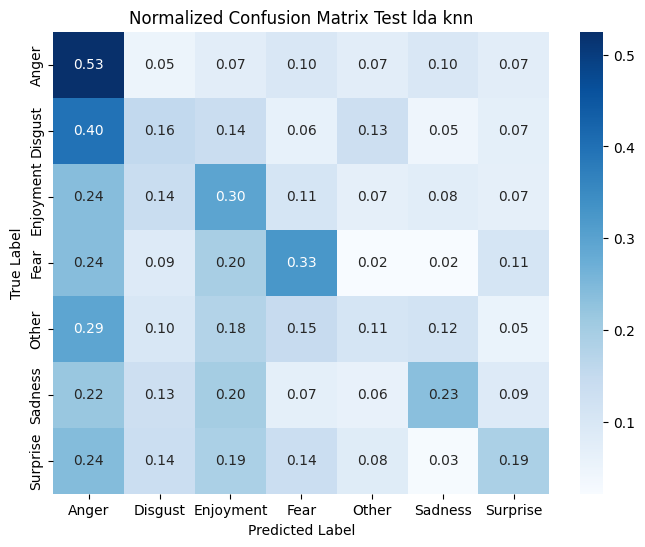

In [140]:
model_lda_82_knn, train_lda_82_knn, valid_lda_82_knn, test_lda_82_knn, pred_lda_82_knn = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="knn",
    max_iter=1000
)

y_train_lda_82_knn, y_valid_lda_82_knn, y_test_lda_82_knn = train_lda_82_knn[1], valid_lda_82_knn[1], test_lda_82_knn[1]
y_pred_train_lda_82_knn, y_pred_valid_lda_82_knn, y_pred_test_lda_82_knn = pred_lda_82_knn

pipeline_evaluation(
    y_train_lda_82_knn, y_valid_lda_82_knn, y_test_lda_82_knn,
    y_pred_train_lda_82_knn, y_pred_valid_lda_82_knn, y_pred_test_lda_82_knn,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu không giảm chiều

--- train --- 8:2 --- svm_linear --- none ---
Accuracy: 0.9402654867256637
Recall: 0.9402654867256637
Precision: 0.9420965801982316
F1-score: 0.9403351866567037

--- valid --- 8:2 --- svm_linear --- none ---
Accuracy: 0.538121546961326
Recall: 0.538121546961326
Precision: 0.5430449220671283
F1-score: 0.5390102947586676

--- test --- 8:2 --- svm_linear --- none ---
Accuracy: 0.3866279069767442
Recall: 0.3866279069767442
Precision: 0.4234114248511628
F1-score: 0.3929007018677191


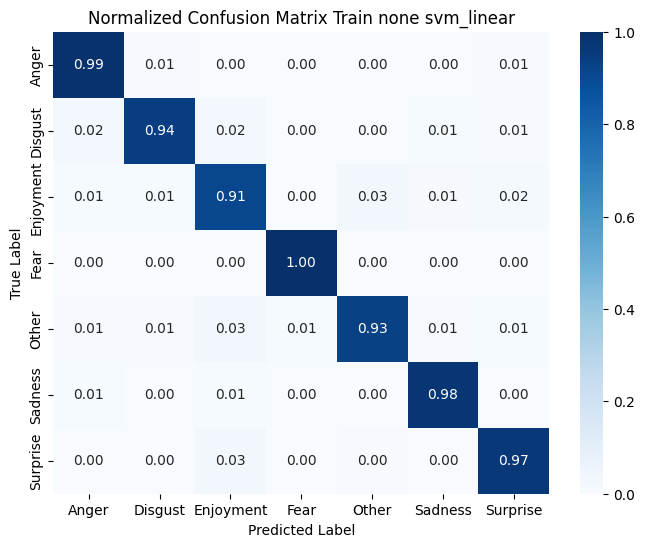

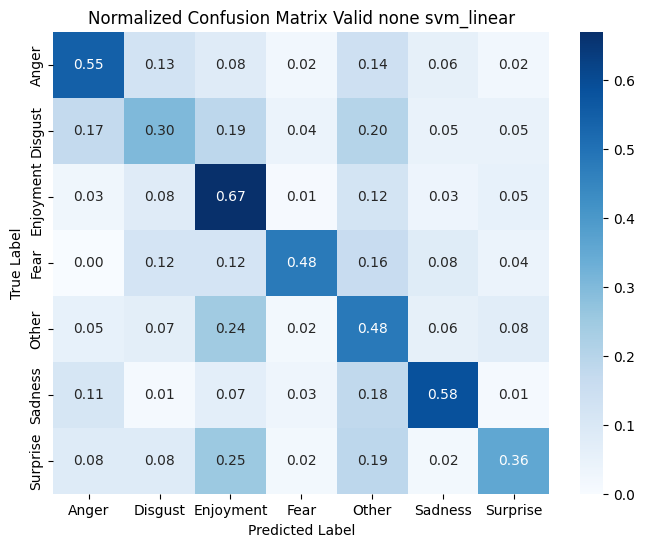

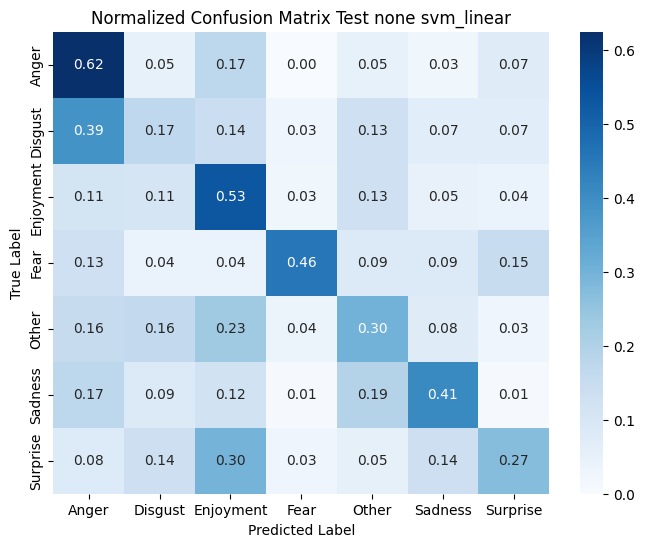

In [141]:
# SVM - linear - None (8:2)
model_82_svm_linear, train_82_svm_linear, valid_82_svm_linear, test_82_svm_linear, pred_82_svm_linear = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_82_svm_linear, y_valid_82_svm_linear, y_test_82_svm_linear = train_82_svm_linear[1], valid_82_svm_linear[1], test_82_svm_linear[1]
y_pred_train_82_svm_linear, y_pred_valid_82_svm_linear, y_pred_test_82_svm_linear = pred_82_svm_linear

pipeline_evaluation(
    y_train_82_svm_linear, y_valid_82_svm_linear, y_test_82_svm_linear,
    y_pred_train_82_svm_linear, y_pred_valid_82_svm_linear, y_pred_test_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 8:2 --- svm_poly --- none ---
Accuracy: 0.2325774336283186
Recall: 0.2325774336283186
Precision: 0.6033555777061493
F1-score: 0.12821671617081395

--- valid --- 8:2 --- svm_poly --- none ---
Accuracy: 0.20773480662983426
Recall: 0.20773480662983426
Precision: 0.5939554934753418
F1-score: 0.09682052648553868

--- test --- 8:2 --- svm_poly --- none ---
Accuracy: 0.1933139534883721
Recall: 0.1933139534883721
Precision: 0.5484950117470803
F1-score: 0.07092065986742227


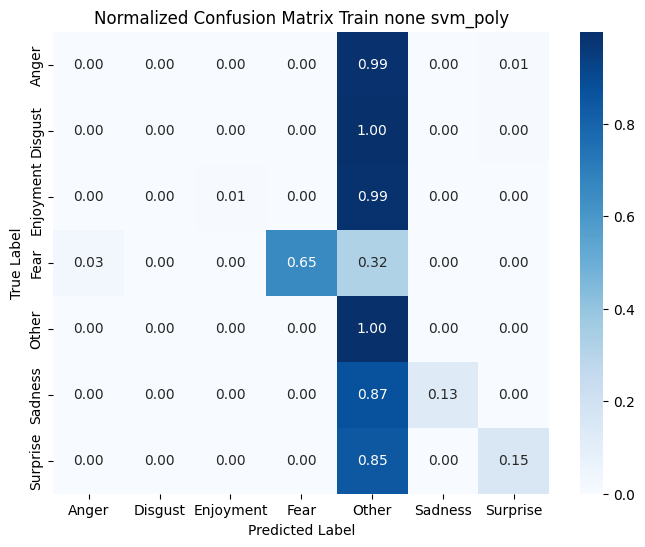

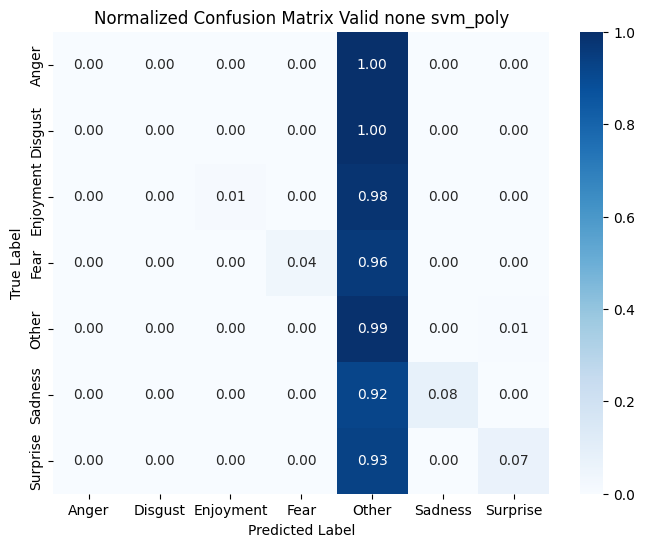

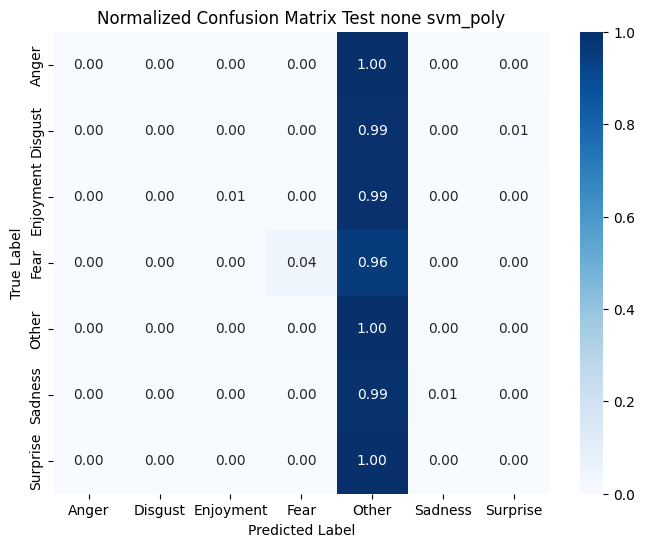

In [142]:
# SVM - poly - None (8:2)
model_82_svm_poly, train_82_svm_poly, valid_82_svm_poly, test_82_svm_poly, pred_82_svm_poly = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly = train_82_svm_poly[1], valid_82_svm_poly[1], test_82_svm_poly[1]
y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly = pred_82_svm_poly

pipeline_evaluation(
    y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly,
    y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

--- train --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.9413716814159292
Recall: 0.9413716814159292
Precision: 0.9448081652899841
F1-score: 0.9413029910889742

--- valid --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.532596685082873
Recall: 0.532596685082873
Precision: 0.5506598340993856
F1-score: 0.5315099327331497

--- test --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.35901162790697677
Recall: 0.35901162790697677
Precision: 0.4269035388538746
F1-score: 0.35161212541135556


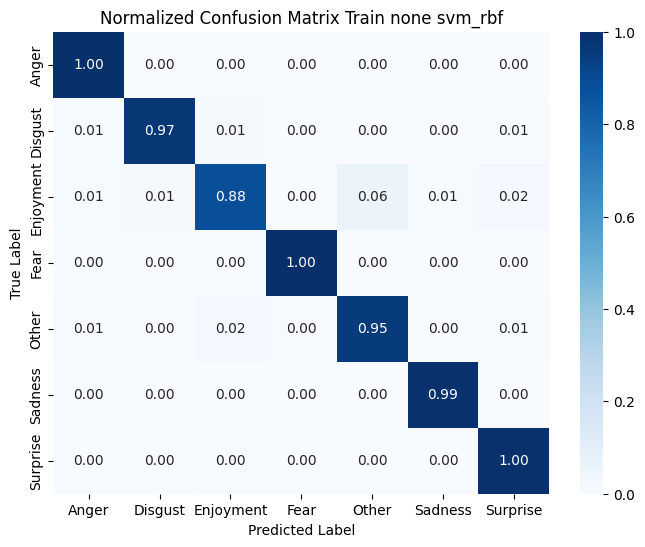

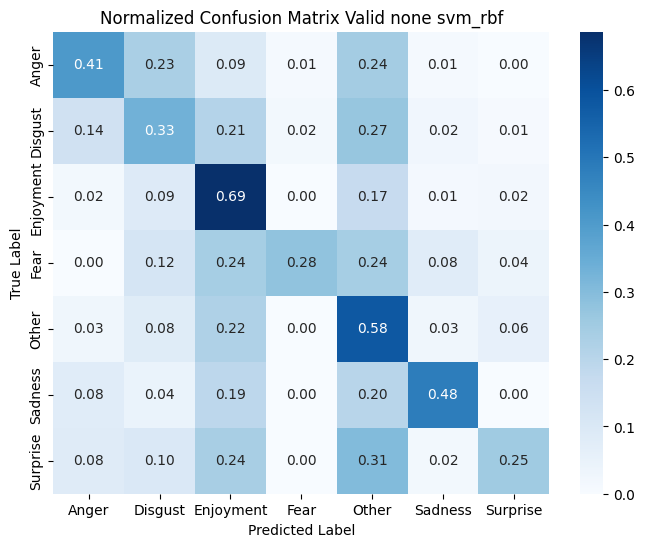

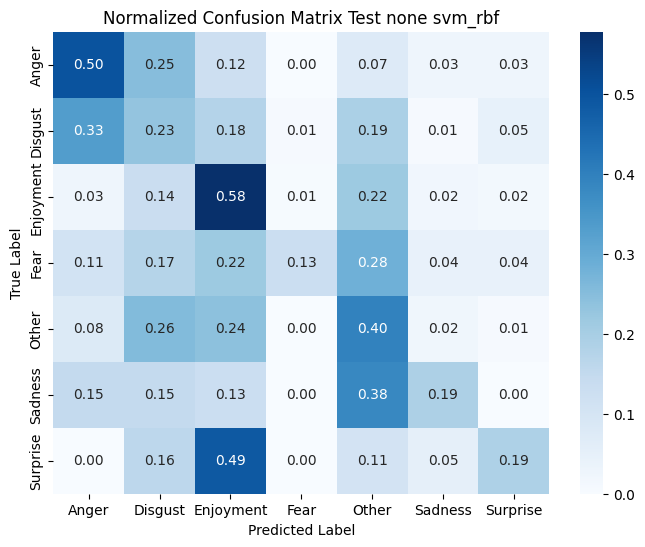

In [143]:
# SVM - rbf - None (8:2)
model_82_svm_rbf, train_82_svm_rbf, valid_82_svm_rbf, test_82_svm_rbf, pred_82_svm_rbf = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_82_svm_rbf, y_valid_82_svm_rbf, y_test_82_svm_rbf = train_82_svm_rbf[1], valid_82_svm_rbf[1], test_82_svm_rbf[1]
y_pred_train_82_svm_rbf, y_pred_valid_82_svm_rbf, y_pred_test_82_svm_rbf = pred_82_svm_rbf

pipeline_evaluation(
    y_train_82_svm_rbf, y_valid_82_svm_rbf, y_test_82_svm_rbf,
    y_pred_train_82_svm_rbf, y_pred_valid_82_svm_rbf, y_pred_test_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.8832964601769911
Recall: 0.8832964601769911
Precision: 0.8874620878717102
F1-score: 0.8832397374112646

--- valid --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.538121546961326
Recall: 0.538121546961326
Precision: 0.5455465042193461
F1-score: 0.5402141689963593

--- test --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.3866279069767442
Recall: 0.3866279069767442
Precision: 0.4212214946014959
F1-score: 0.39091292960949553


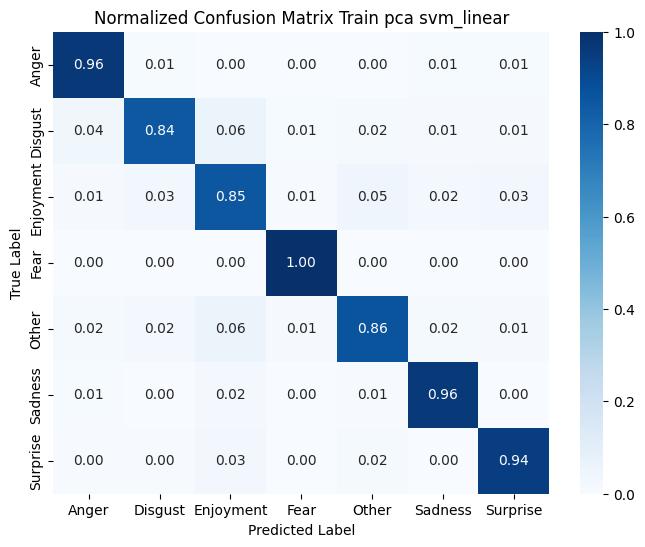

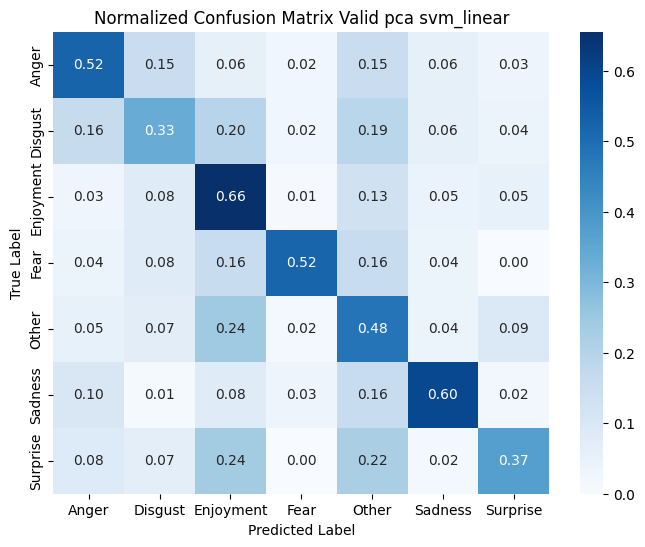

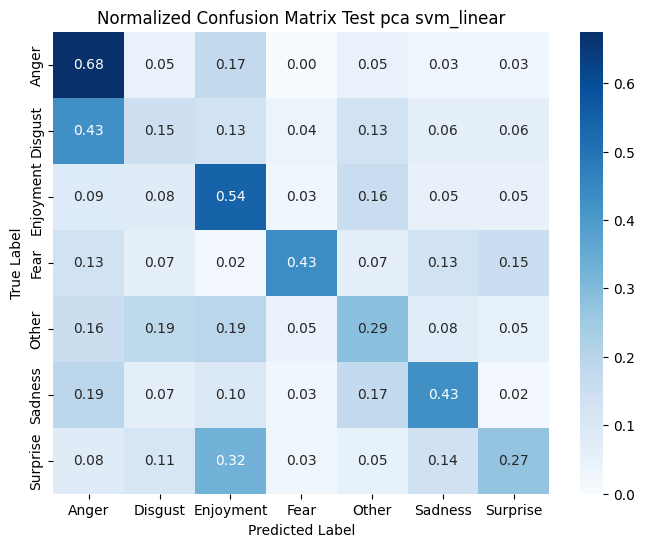

In [144]:
# SVM - linear - PCA (8:2)
model_pca_82_svm_linear, train_pca_82_svm_linear, valid_pca_82_svm_linear, test_pca_82_svm_linear, pred_pca_82_svm_linear = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_82_svm_linear, y_valid_pca_82_svm_linear, y_test_pca_82_svm_linear = train_pca_82_svm_linear[1], valid_pca_82_svm_linear[1], test_pca_82_svm_linear[1]
y_pred_train_pca_82_svm_linear, y_pred_valid_pca_82_svm_linear, y_pred_test_pca_82_svm_linear = pred_pca_82_svm_linear

pipeline_evaluation(
    y_train_pca_82_svm_linear, y_valid_pca_82_svm_linear, y_test_pca_82_svm_linear,
    y_pred_train_pca_82_svm_linear, y_pred_valid_pca_82_svm_linear, y_pred_test_pca_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.2364491150442478
Recall: 0.2364491150442478
Precision: 0.7307264591941012
F1-score: 0.13788009047249547

--- valid --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.2121546961325967
Recall: 0.2121546961325967
Precision: 0.5879966994331636
F1-score: 0.10554708127198306

--- test --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.19476744186046513
Recall: 0.19476744186046513
Precision: 0.408389620383037
F1-score: 0.073506403128152


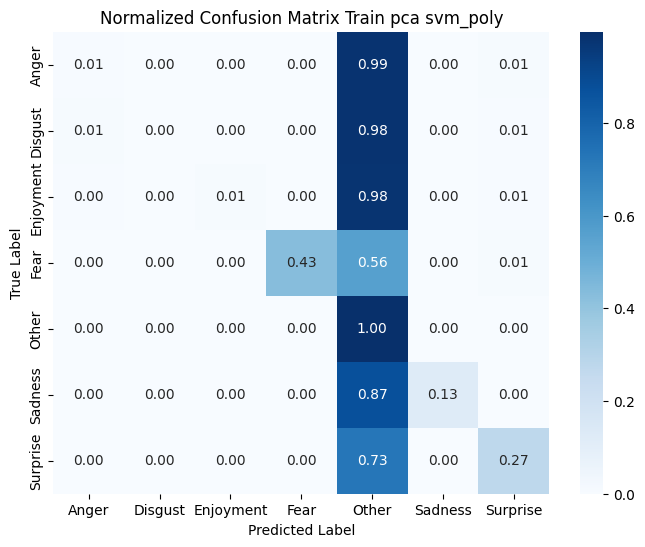

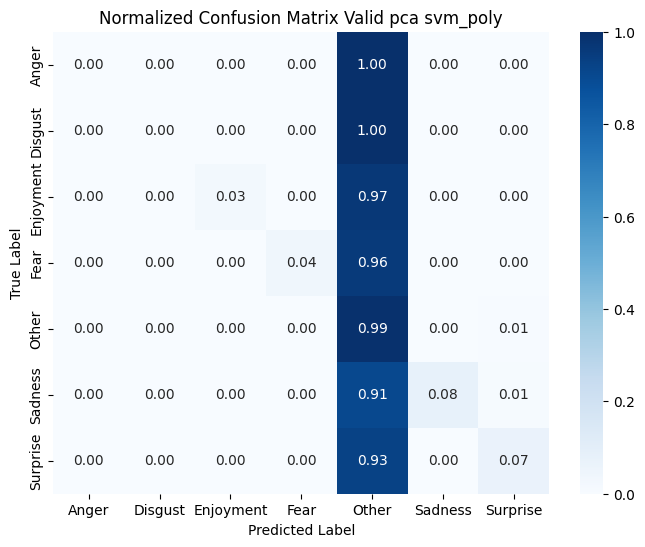

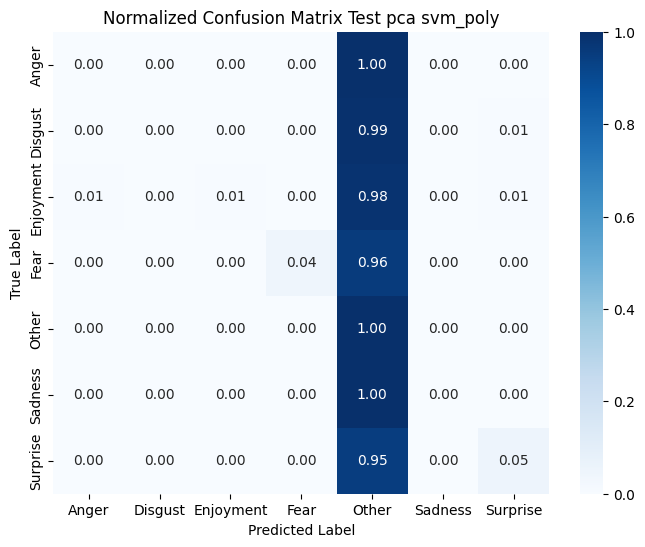

In [145]:
# SVM - poly - PCA (8:2)
model_pca_82_svm_poly, train_pca_82_svm_poly, valid_pca_82_svm_poly, test_pca_82_svm_poly, pred_pca_82_svm_poly = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_82_svm_poly, y_valid_pca_82_svm_poly, y_test_pca_82_svm_poly = train_pca_82_svm_poly[1], valid_pca_82_svm_poly[1], test_pca_82_svm_poly[1]
y_pred_train_pca_82_svm_poly, y_pred_valid_pca_82_svm_poly, y_pred_test_pca_82_svm_poly = pred_pca_82_svm_poly

pipeline_evaluation(
    y_train_pca_82_svm_poly, y_valid_pca_82_svm_poly, y_test_pca_82_svm_poly,
    y_pred_train_pca_82_svm_poly, y_pred_valid_pca_82_svm_poly, y_pred_test_pca_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

--- train --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.9239491150442478
Recall: 0.9239491150442478
Precision: 0.9287421820383615
F1-score: 0.9238375070729735

--- valid --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.5060773480662983
Recall: 0.5060773480662983
Precision: 0.5380096146300598
F1-score: 0.5161950235336877

--- test --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.3691860465116279
Recall: 0.3691860465116279
Precision: 0.4598624545972431
F1-score: 0.386707970171303


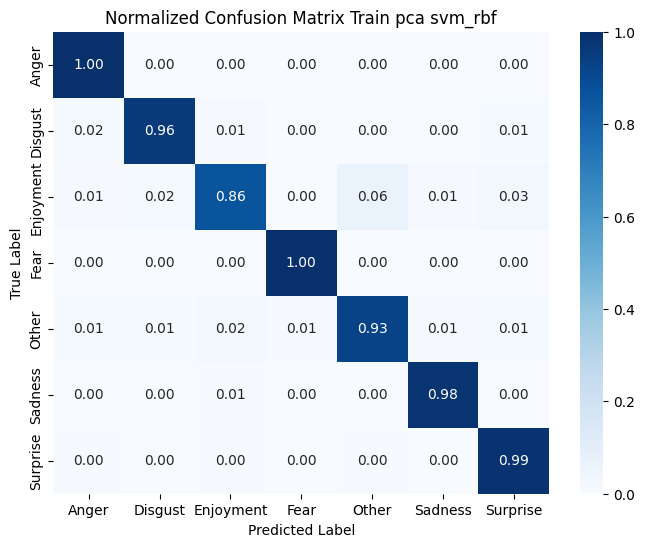

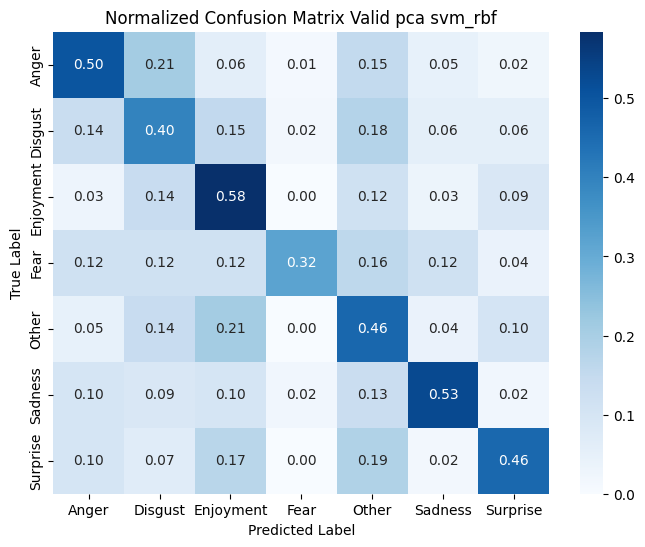

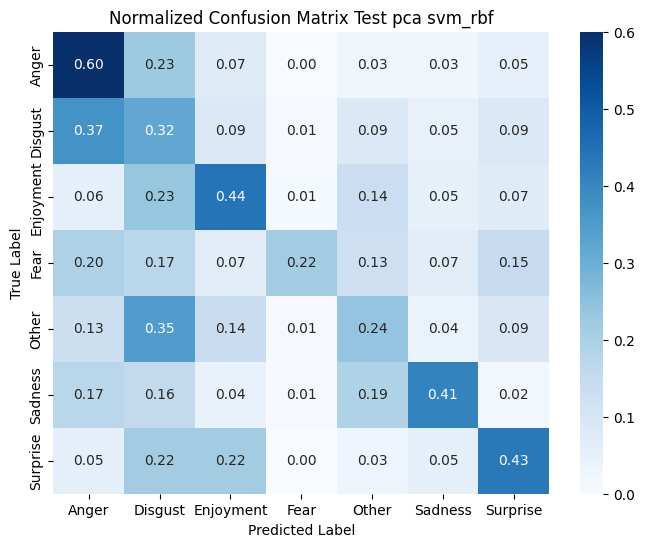

In [146]:
# SVM - rbf - PCA (8:2)
model_pca_82_svm_rbf, train_pca_82_svm_rbf, valid_pca_82_svm_rbf, test_pca_82_svm_rbf, pred_pca_82_svm_rbf = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_82_svm_rbf, y_valid_pca_82_svm_rbf, y_test_pca_82_svm_rbf = train_pca_82_svm_rbf[1], valid_pca_82_svm_rbf[1], test_pca_82_svm_rbf[1]
y_pred_train_pca_82_svm_rbf, y_pred_valid_pca_82_svm_rbf, y_pred_test_pca_82_svm_rbf = pred_pca_82_svm_rbf

pipeline_evaluation(
    y_train_pca_82_svm_rbf, y_valid_pca_82_svm_rbf, y_test_pca_82_svm_rbf,
    y_pred_train_pca_82_svm_rbf, y_pred_valid_pca_82_svm_rbf, y_pred_test_pca_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu LDA

--- train --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.9917035398230089
Recall: 0.9917035398230089
Precision: 0.9919632180766387
F1-score: 0.9917661869324875

--- valid --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.31712707182320443
Recall: 0.31712707182320443
Precision: 0.3381301010066956
F1-score: 0.32001888953179786

--- test --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.28488372093023256
Recall: 0.28488372093023256
Precision: 0.30144464088618106
F1-score: 0.26910079600520015


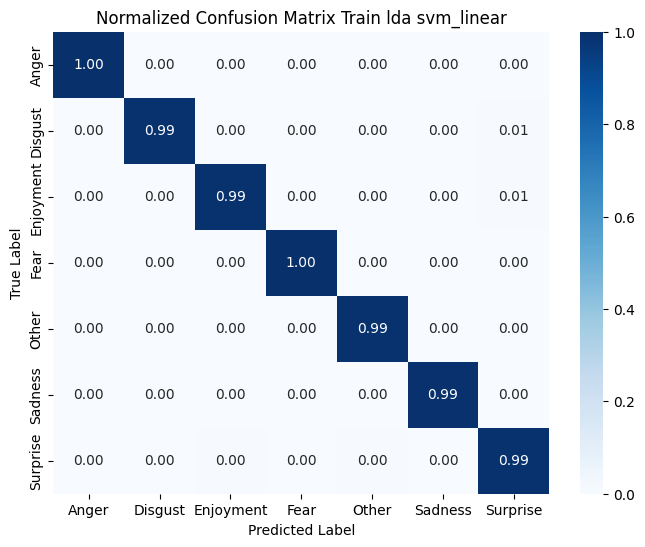

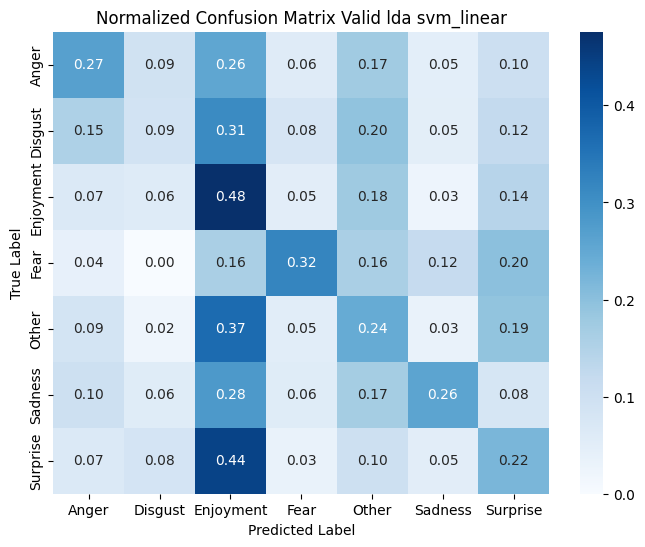

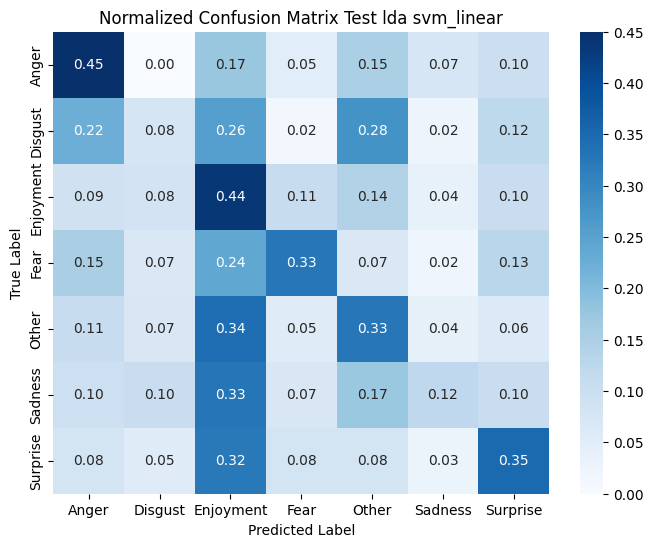

In [147]:
# SVM - linear - LDA (8:2)
model_lda_82_svm_linear, train_lda_82_svm_linear, valid_lda_82_svm_linear, test_lda_82_svm_linear, pred_lda_82_svm_linear = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_82_svm_linear, y_valid_lda_82_svm_linear, y_test_lda_82_svm_linear = train_lda_82_svm_linear[1], valid_lda_82_svm_linear[1], test_lda_82_svm_linear[1]
y_pred_train_lda_82_svm_linear, y_pred_valid_lda_82_svm_linear, y_pred_test_lda_82_svm_linear = pred_lda_82_svm_linear

pipeline_evaluation(
    y_train_lda_82_svm_linear, y_valid_lda_82_svm_linear, y_test_lda_82_svm_linear,
    y_pred_train_lda_82_svm_linear, y_pred_valid_lda_82_svm_linear, y_pred_test_lda_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.9883849557522124
Recall: 0.9883849557522124
Precision: 0.9886896063933828
F1-score: 0.9883897985857836

--- valid --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.2718232044198895
Recall: 0.2718232044198895
Precision: 0.3352126720799145
F1-score: 0.28478173452485933

--- test --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.2005813953488372
Recall: 0.2005813953488372
Precision: 0.2541892886596599
F1-score: 0.2079201407293997


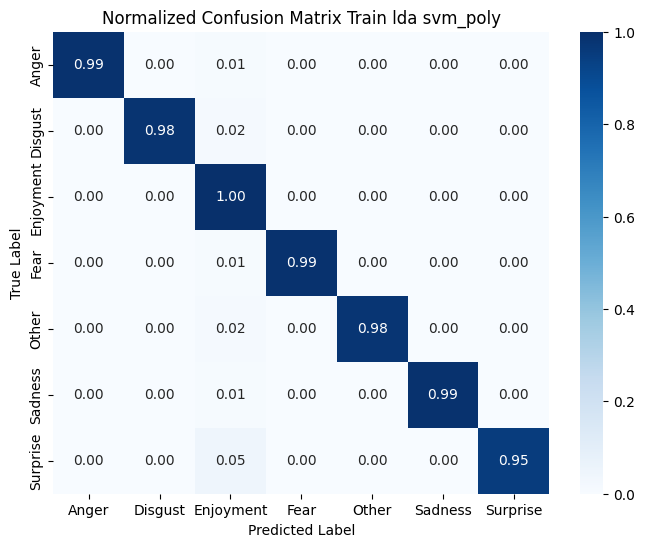

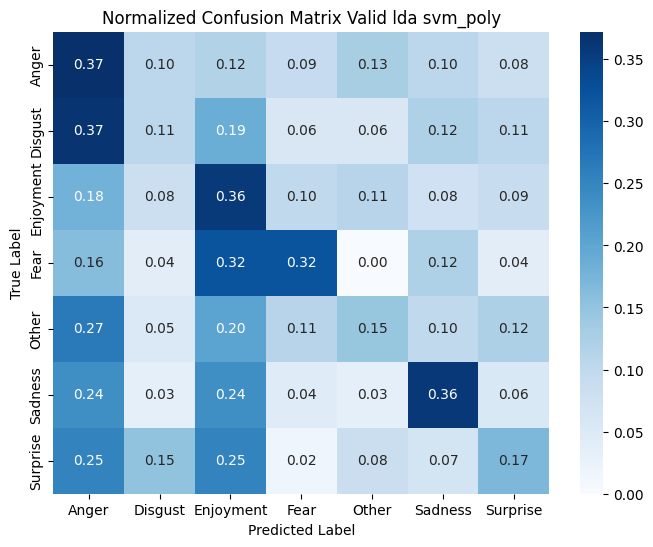

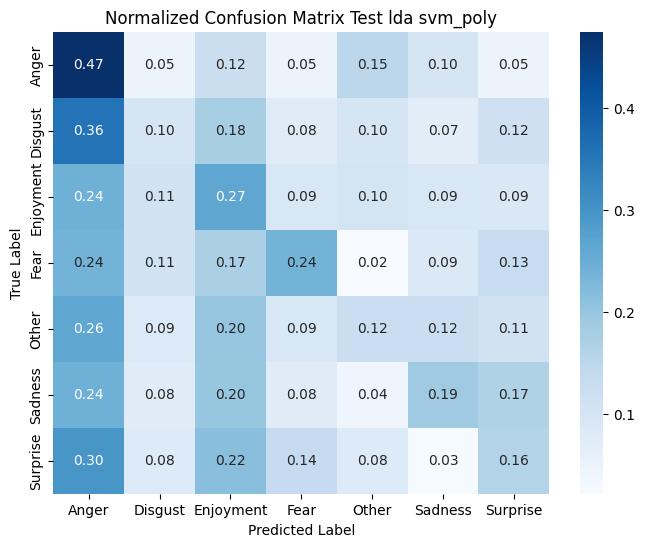

In [148]:
# SVM - poly - LDA (8:2)
model_lda_82_svm_poly, train_lda_82_svm_poly, valid_lda_82_svm_poly, test_lda_82_svm_poly, pred_lda_82_svm_poly = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly = train_lda_82_svm_poly[1], valid_lda_82_svm_poly[1], test_lda_82_svm_poly[1]
y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly = pred_lda_82_svm_poly

pipeline_evaluation(
    y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly,
    y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.9939159292035398
Recall: 0.9939159292035398
Precision: 0.9941329042984377
F1-score: 0.9939624913882827

--- valid --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.3878453038674033
Recall: 0.3878453038674033
Precision: 0.17239245119500943
F1-score: 0.21894942784113589

--- test --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.27761627906976744
Recall: 0.27761627906976744
Precision: 0.07770018306325853
F1-score: 0.12141759813529691


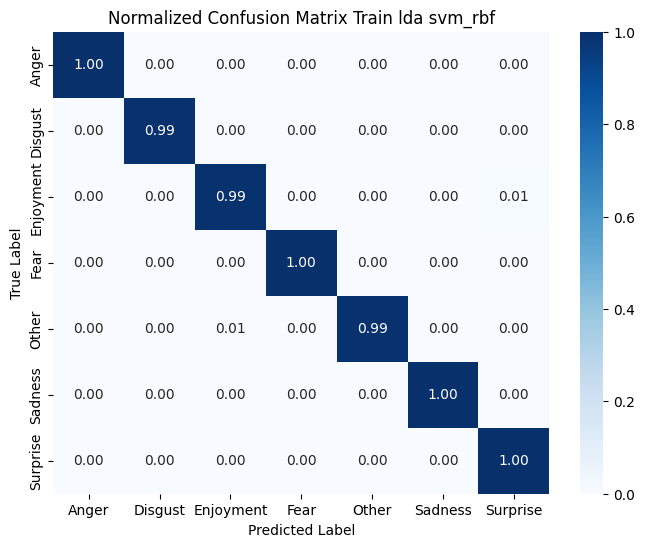

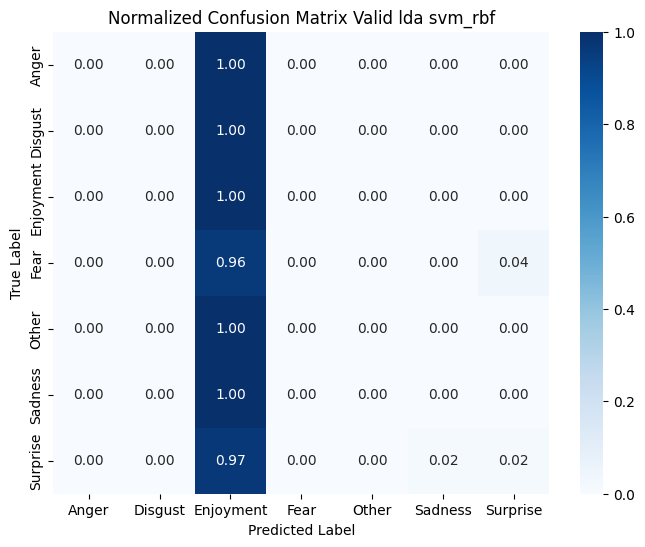

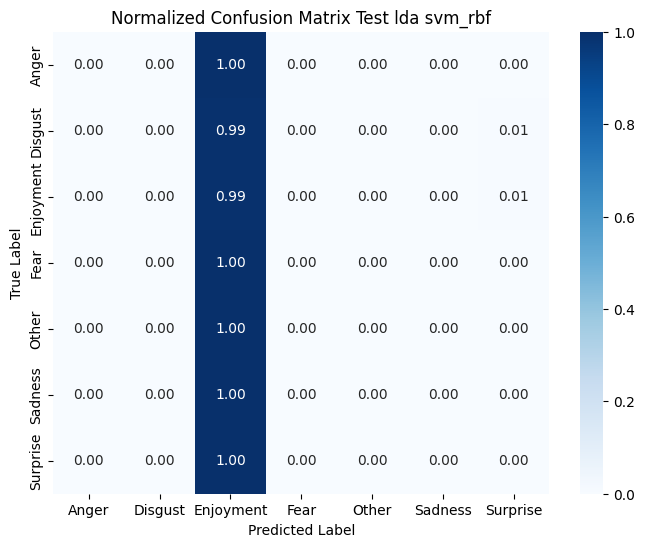

In [149]:
# SVM - rbf - LDA (8:2)
model_lda_82_svm_rbf, train_lda_82_svm_rbf, valid_lda_82_svm_rbf, test_lda_82_svm_rbf, pred_lda_82_svm_rbf = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_82_svm_rbf, y_valid_lda_82_svm_rbf, y_test_lda_82_svm_rbf = train_lda_82_svm_rbf[1], valid_lda_82_svm_rbf[1], test_lda_82_svm_rbf[1]
y_pred_train_lda_82_svm_rbf, y_pred_valid_lda_82_svm_rbf, y_pred_test_lda_82_svm_rbf = pred_lda_82_svm_rbf

pipeline_evaluation(
    y_train_lda_82_svm_rbf, y_valid_lda_82_svm_rbf, y_test_lda_82_svm_rbf,
    y_pred_train_lda_82_svm_rbf, y_pred_valid_lda_82_svm_rbf, y_pred_test_lda_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Train:Validation = 7:3

## Logistic Regression

### Bộ dữ liệu không giảm chiều

In [150]:
X_train_73, X_valid_73, X_test_73, y_train_73, y_valid_73, y_test_73, tfidf_vec_73, disc_model_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="none"
)

TF-IDF hoàn thành!
Shape: (3164, 5115) (số câu x số từ vựng)
Số từ vựng: 5115
TF-IDF - Non-zero values: 38562


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.8293299620733249
Recall: 0.8293299620733249
Precision: 0.844375949207466
F1-score: 0.829385237437408

--- valid --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.5202652910832719
Recall: 0.5202652910832719
Precision: 0.5397061124771303
F1-score: 0.5261710287932425

--- test --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.3691860465116279
Recall: 0.3691860465116279
Precision: 0.4363563359201377
F1-score: 0.38374431263279096


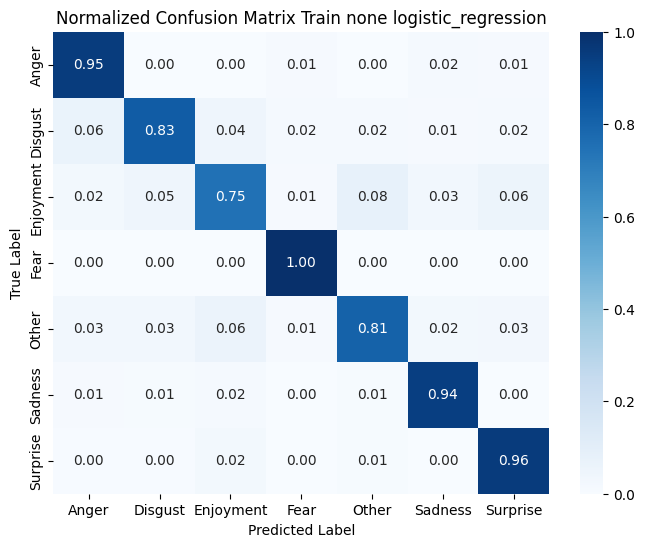

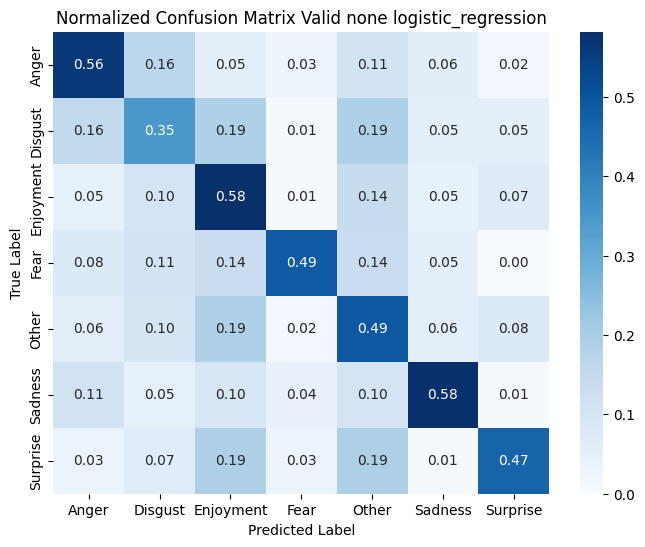

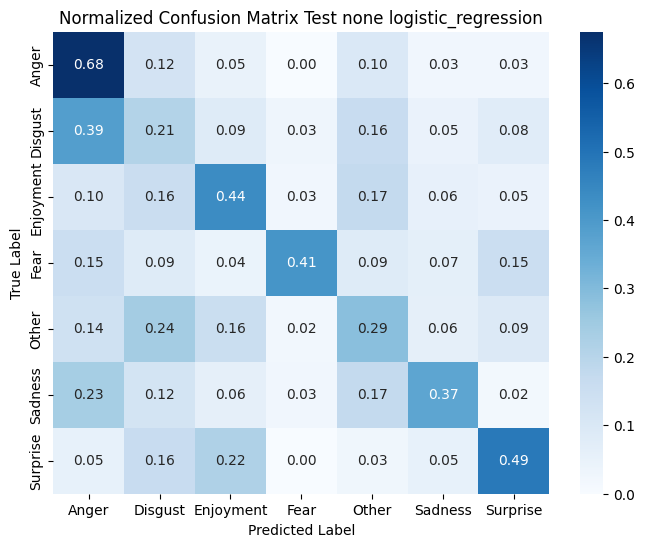

In [151]:
model_73, train_73, valid_73, test_73, pred_73 = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_73, y_pred_valid_73, y_pred_test_73 = pred_73

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73, y_pred_valid_73, y_pred_test_73,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (3164, 5115) (số câu x số từ vựng)
Số từ vựng: 5115
TF-IDF - Non-zero values: 38562


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.7920353982300885
Recall: 0.7920353982300885
Precision: 0.8118015520458136
F1-score: 0.7927631777424184

--- valid --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.5173176123802505
Recall: 0.5173176123802505
Precision: 0.540423701707464
F1-score: 0.5243609628138863

--- test --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.3793604651162791
Recall: 0.3793604651162791
Precision: 0.45003866937078824
F1-score: 0.3961019005079282


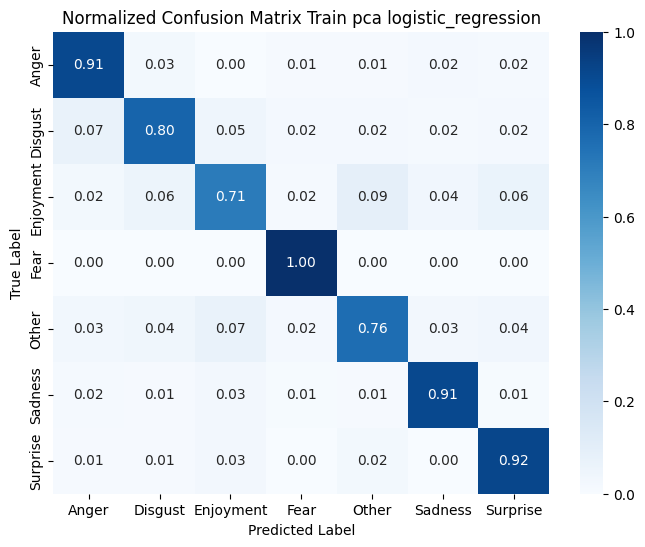

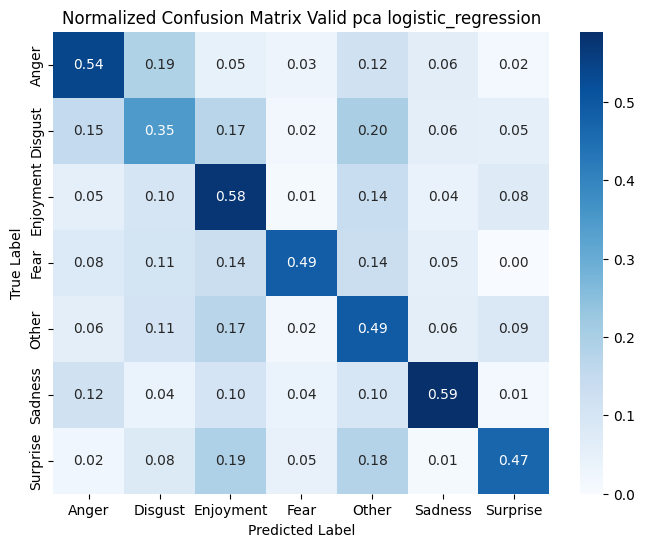

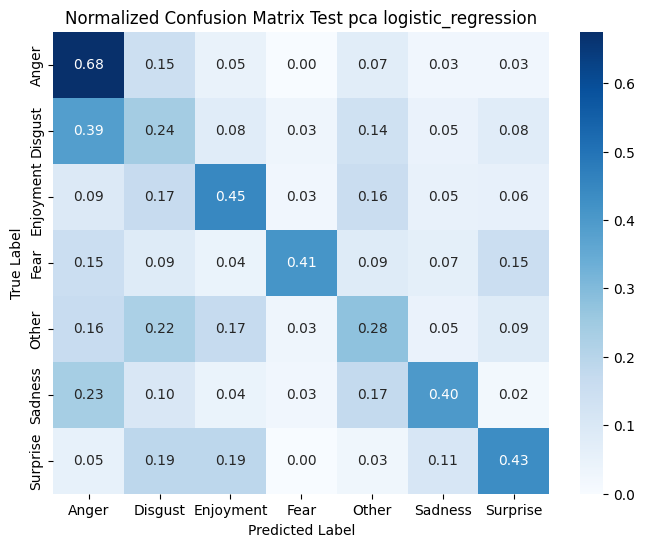

In [152]:
X_train_pca_73, X_valid_pca_73, X_test_pca_73, y_train_pca_73, y_valid_pca_73, y_test_pca_73, tfidf_vec_pca_73, disc_model_pca_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="pca"
)

model_pca_73, train_pca_73, valid_pca_73, test_pca_73, pred_pca_73 = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_pca_73, y_pred_valid_pca_73, y_pred_test_pca_73 = pred_pca_73

pipeline_evaluation(
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    y_pred_train_pca_73, y_pred_valid_pca_73, y_pred_test_pca_73,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (3164, 5115) (số câu x số từ vựng)
Số từ vựng: 5115
TF-IDF - Non-zero values: 38562


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.9946270543615676
Recall: 0.9946270543615676
Precision: 0.994834716328538
F1-score: 0.994673711414812

--- valid --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.31319086219602066
Recall: 0.31319086219602066
Precision: 0.3596127086018828
F1-score: 0.3266851423313381

--- test --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.25
Recall: 0.25
Precision: 0.26838342342161725
F1-score: 0.24787411166238094


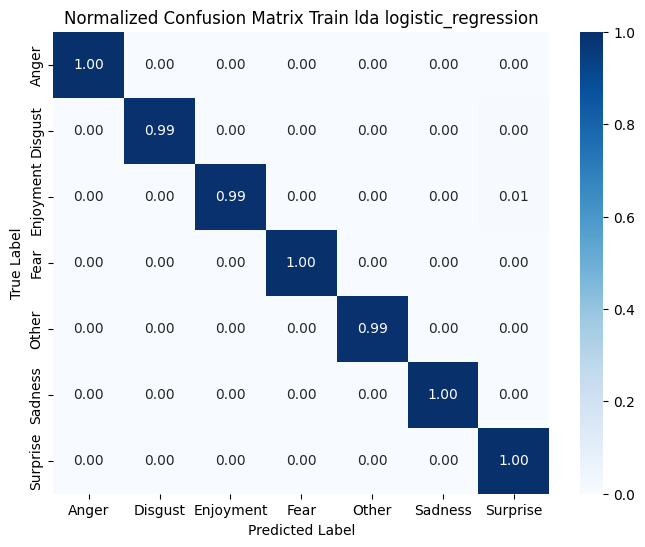

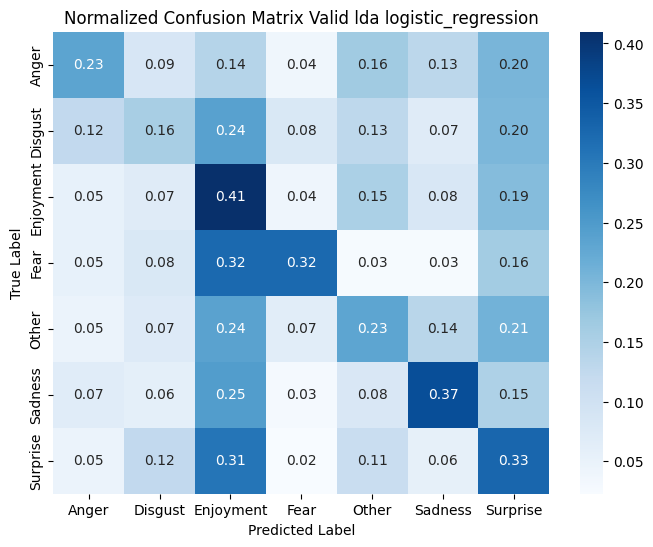

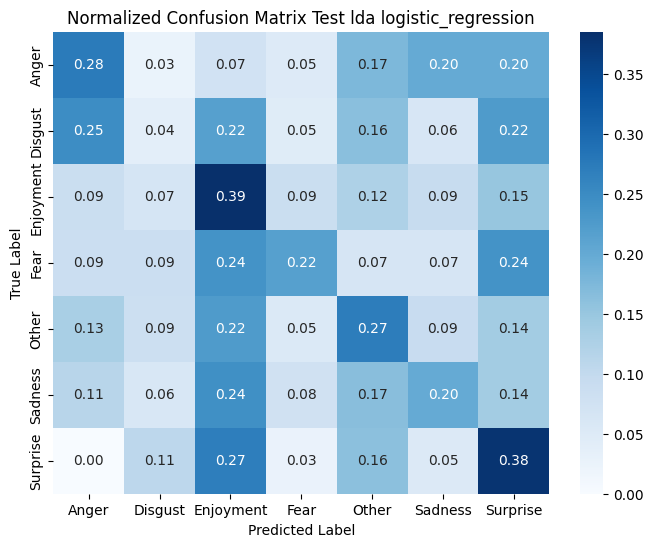

In [153]:
X_train_lda_73, X_valid_lda_73, X_test_lda_73, y_train_lda_73, y_valid_lda_73, y_test_lda_73, tfidf_vec_lda_73, disc_model_lda_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="lda"
)

model_lda_73, train_lda_73, valid_lda_73, test_lda_73, pred_lda_73 = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_lda_73, y_pred_valid_lda_73, y_pred_test_lda_73 = pred_lda_73

pipeline_evaluation(
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    y_pred_train_lda_73, y_pred_valid_lda_73, y_pred_test_lda_73,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.46523388116308473
Recall: 0.46523388116308473
Precision: 0.540932952822925
F1-score: 0.3647320894245832

--- valid --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.4458364038319823
Recall: 0.4458364038319823
Precision: 0.5053982266056025
F1-score: 0.33943377835583105

--- test --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.29651162790697677
Recall: 0.29651162790697677
Precision: 0.4060938045021585
F1-score: 0.16866642630510953


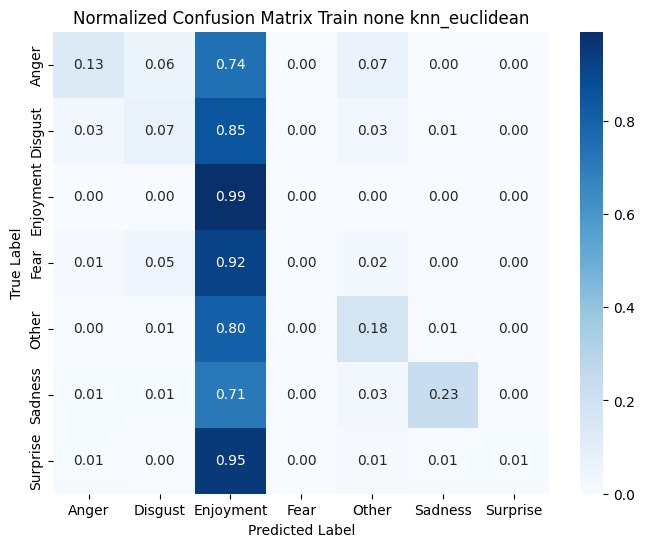

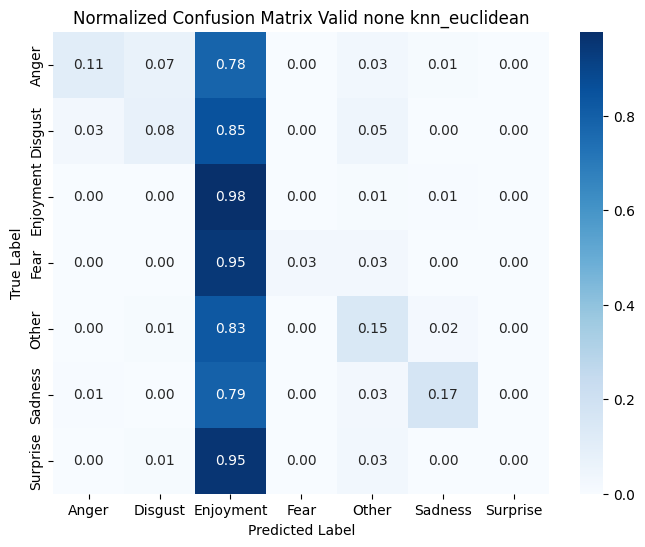

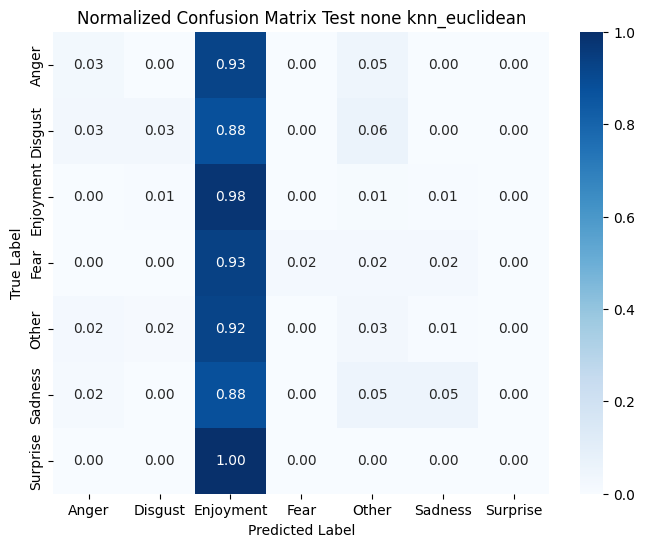

In [154]:
# KNN - euclidean - None (7:3)
model_73_knn_euclidean, train_73_knn_euclidean, valid_73_knn_euclidean, test_73_knn_euclidean, pred_73_knn_euclidean = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="knn",
    metric="euclidean"
)

y_pred_train_73_knn_euclidean, y_pred_valid_73_knn_euclidean, y_pred_test_73_knn_euclidean = pred_73_knn_euclidean

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73_knn_euclidean, y_pred_valid_73_knn_euclidean, y_pred_test_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- knn --- none ---
Accuracy: 0.4832490518331226
Recall: 0.4832490518331226
Precision: 0.5145951791694255
F1-score: 0.40121416881568617

--- valid --- 7:3 --- knn --- none ---
Accuracy: 0.4613117170228445
Recall: 0.4613117170228445
Precision: 0.4657670459267237
F1-score: 0.3689559269064711

--- test --- 7:3 --- knn --- none ---
Accuracy: 0.3023255813953488
Recall: 0.3023255813953488
Precision: 0.38821003285667716
F1-score: 0.19192188745537342


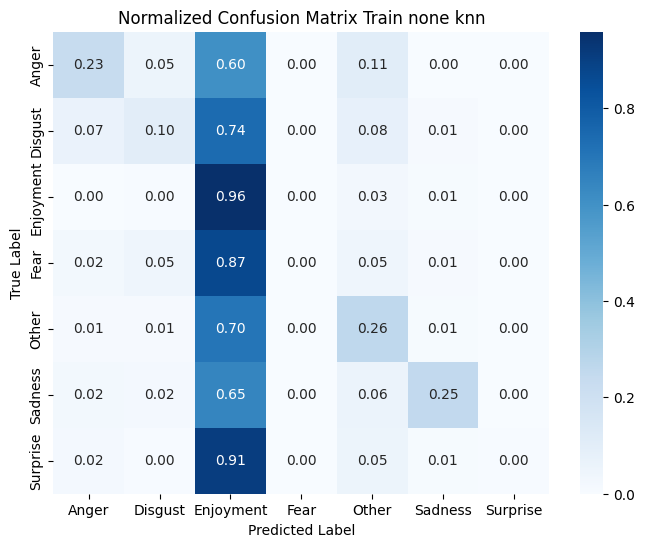

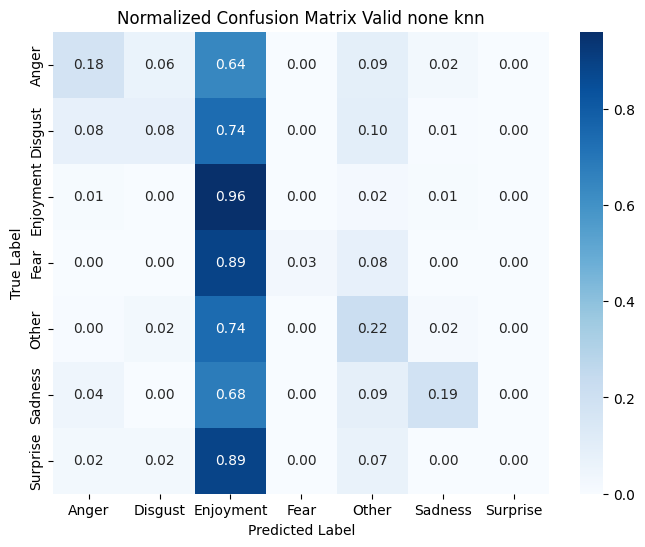

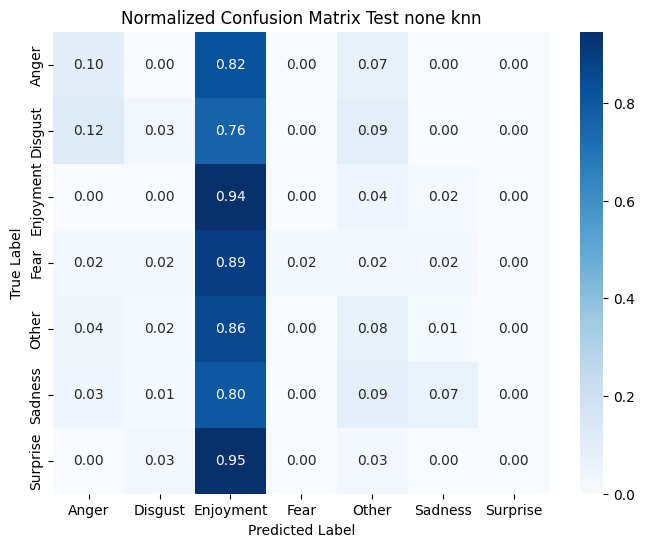

In [155]:
# KNN - cosine - none
model_73_knn, train_73_knn, valid_73_knn, test_73_knn, pred_73_knn = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="knn"
)

y_pred_train_73_knn, y_pred_valid_73_knn, y_pred_test_73_knn = pred_73_knn

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73_knn, y_pred_valid_73_knn, y_pred_test_73_knn,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu PCA

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.47597977243994943
Recall: 0.47597977243994943
Precision: 0.5540906086567832
F1-score: 0.38628193509198283

--- valid --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.45689019896831246
Recall: 0.45689019896831246
Precision: 0.4916412372230875
F1-score: 0.3600969926633081

--- test --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.3023255813953488
Recall: 0.3023255813953488
Precision: 0.35265948675982023
F1-score: 0.18336824416220485


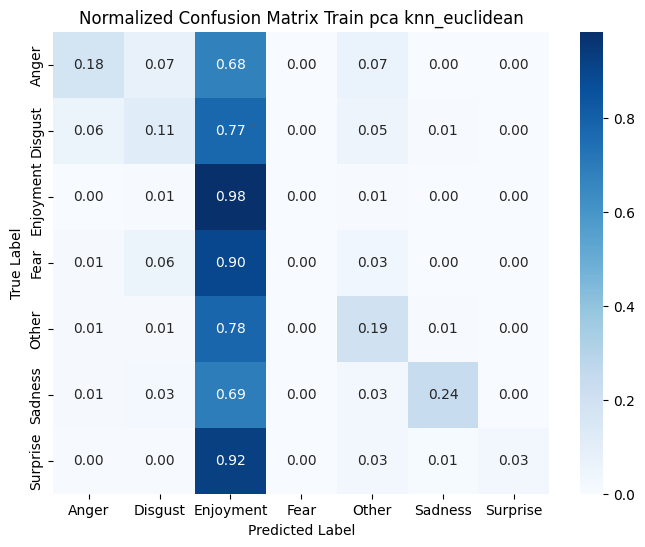

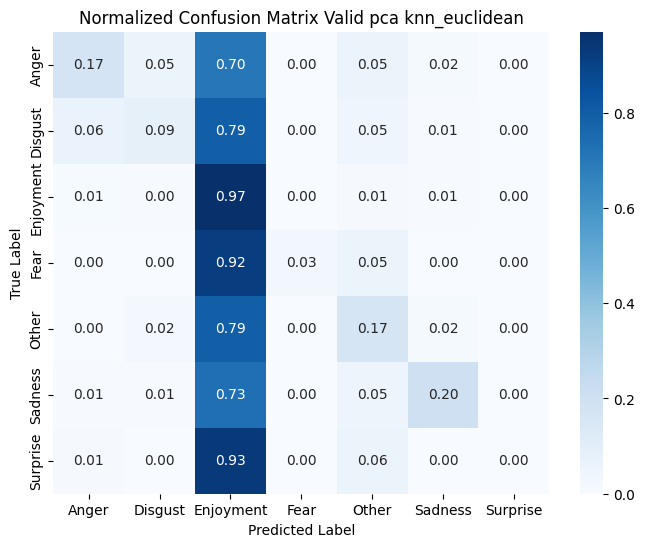

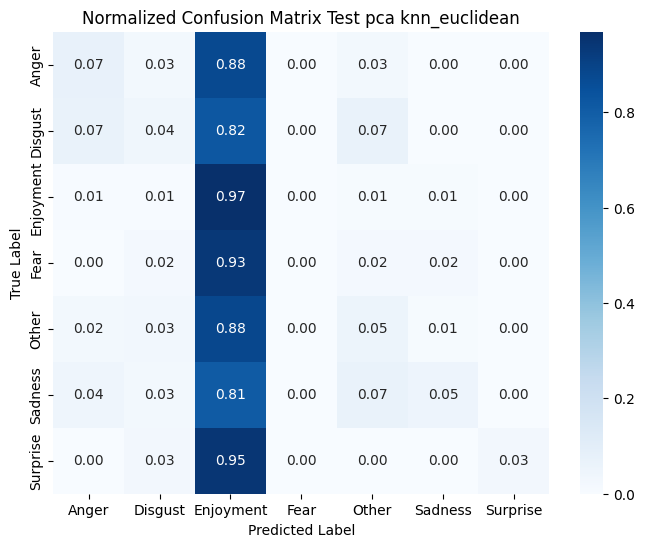

In [156]:
# KNN - euclidean - PCA (7:3)
model_pca_73_knn_euclidean, train_pca_73_knn_euclidean, valid_pca_73_knn_euclidean, test_pca_73_knn_euclidean, pred_pca_73_knn_euclidean = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_73_knn_euclidean, y_valid_pca_73_knn_euclidean, y_test_pca_73_knn_euclidean = train_pca_73_knn_euclidean[1], valid_pca_73_knn_euclidean[1], test_pca_73_knn_euclidean[1]
y_pred_train_pca_73_knn_euclidean, y_pred_valid_pca_73_knn_euclidean, y_pred_test_pca_73_knn_euclidean = pred_pca_73_knn_euclidean

pipeline_evaluation(
    y_train_pca_73_knn_euclidean, y_valid_pca_73_knn_euclidean, y_test_pca_73_knn_euclidean,
    y_pred_train_pca_73_knn_euclidean, y_pred_valid_pca_73_knn_euclidean, y_pred_test_pca_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- knn --- pca ---
Accuracy: 0.48514538558786346
Recall: 0.48514538558786346
Precision: 0.5296221687751915
F1-score: 0.4026616207000654

--- valid --- 7:3 --- knn --- pca ---
Accuracy: 0.4613117170228445
Recall: 0.4613117170228445
Precision: 0.48326912377461934
F1-score: 0.3713248457526456

--- test --- 7:3 --- knn --- pca ---
Accuracy: 0.30377906976744184
Recall: 0.30377906976744184
Precision: 0.36528697445297287
F1-score: 0.19754194932540692


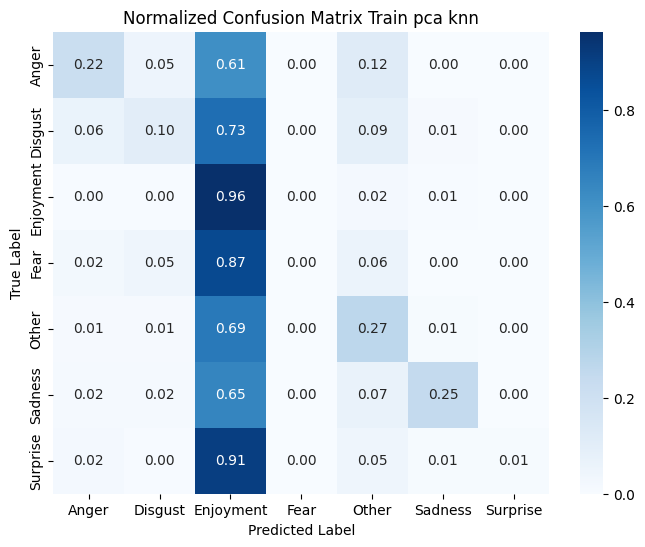

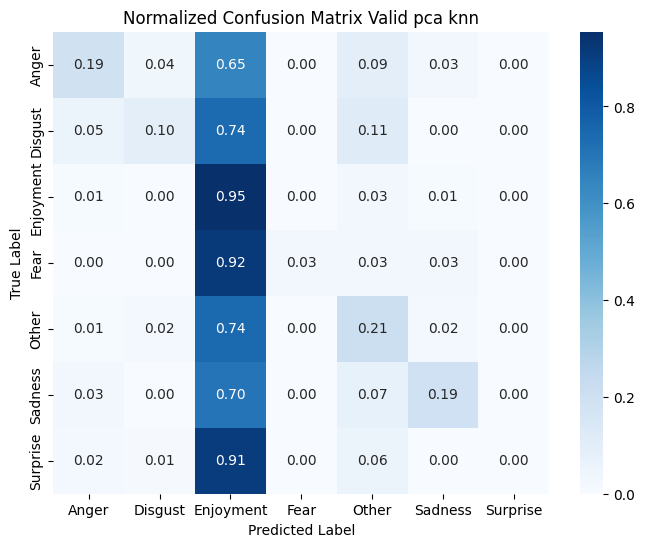

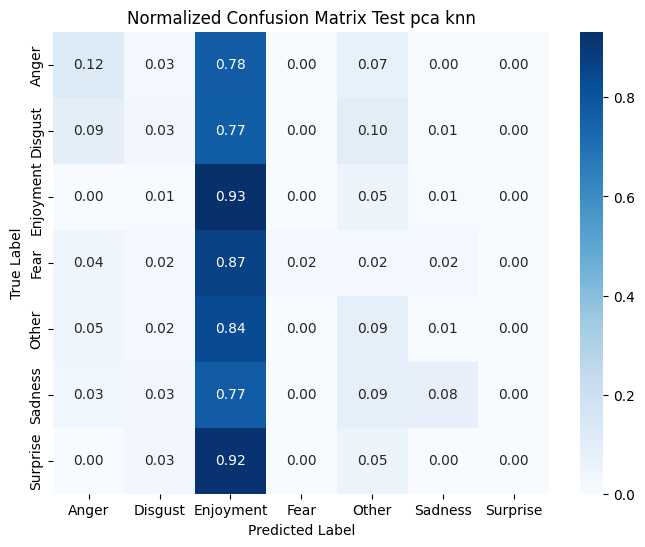

In [157]:
model_pca_73_knn, train_pca_73_knn, valid_pca_73_knn, test_pca_73_knn, pred_pca_73_knn = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="knn",
    max_iter=1000
)

y_train_pca_73_knn, y_valid_pca_73_knn, y_test_pca_73_knn = train_pca_73_knn[1], valid_pca_73_knn[1], test_pca_73_knn[1]
y_pred_train_pca_73_knn, y_pred_valid_pca_73_knn, y_pred_test_pca_73_knn = pred_pca_73_knn

pipeline_evaluation(
    y_train_pca_73_knn, y_valid_pca_73_knn, y_test_pca_73_knn,
    y_pred_train_pca_73_knn, y_pred_valid_pca_73_knn, y_pred_test_pca_73_knn,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.9936788874841972
Recall: 0.9936788874841972
Precision: 0.9937363010351287
F1-score: 0.99367037679109

--- valid --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.3323507737656595
Recall: 0.3323507737656595
Precision: 0.3575300448135623
F1-score: 0.3390374724985142

--- test --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.25872093023255816
Recall: 0.25872093023255816
Precision: 0.27570308568661245
F1-score: 0.26049928385368076


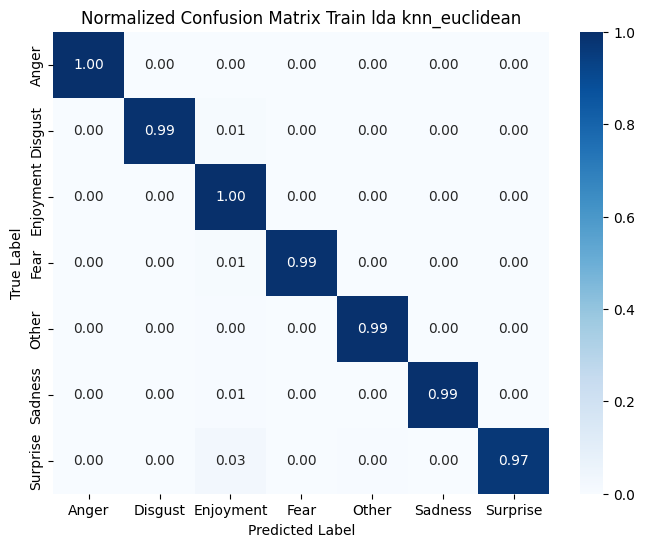

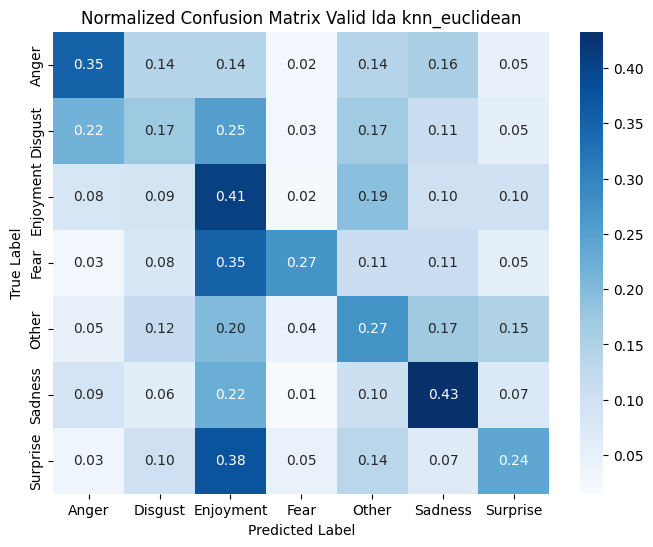

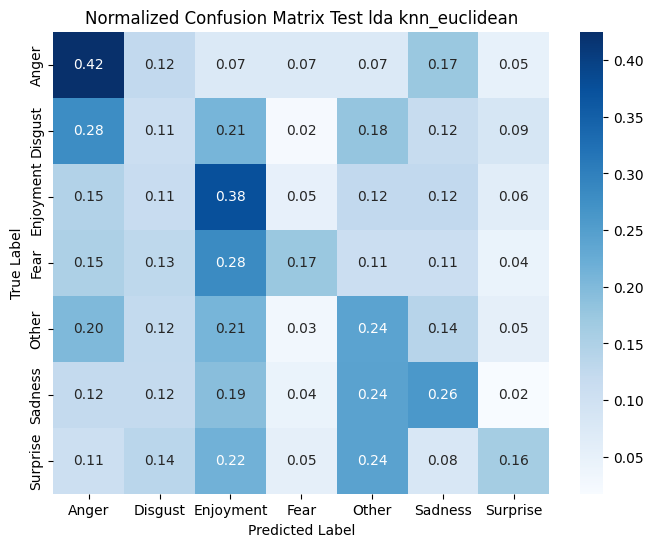

In [158]:
# KNN - euclidean - LDA (7:3)
model_lda_73_knn_euclidean, train_lda_73_knn_euclidean, valid_lda_73_knn_euclidean, test_lda_73_knn_euclidean, pred_lda_73_knn_euclidean = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_73_knn_euclidean, y_valid_lda_73_knn_euclidean, y_test_lda_73_knn_euclidean = train_lda_73_knn_euclidean[1], valid_lda_73_knn_euclidean[1], test_lda_73_knn_euclidean[1]
y_pred_train_lda_73_knn_euclidean, y_pred_valid_lda_73_knn_euclidean, y_pred_test_lda_73_knn_euclidean = pred_lda_73_knn_euclidean

pipeline_evaluation(
    y_train_lda_73_knn_euclidean, y_valid_lda_73_knn_euclidean, y_test_lda_73_knn_euclidean,
    y_pred_train_lda_73_knn_euclidean, y_pred_valid_lda_73_knn_euclidean, y_pred_test_lda_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 7:3 --- knn --- lda ---
Accuracy: 0.9898862199747156
Recall: 0.9898862199747156
Precision: 0.9902577487746126
F1-score: 0.989966976234926

--- valid --- 7:3 --- knn --- lda ---
Accuracy: 0.3006632277081798
Recall: 0.3006632277081798
Precision: 0.35735536582148764
F1-score: 0.31046858937408084

--- test --- 7:3 --- knn --- lda ---
Accuracy: 0.23255813953488372
Recall: 0.23255813953488372
Precision: 0.27634678947248187
F1-score: 0.2377410815814186


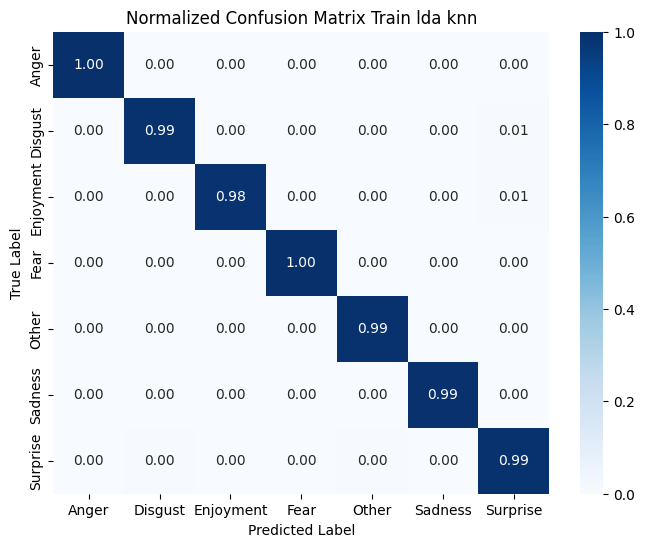

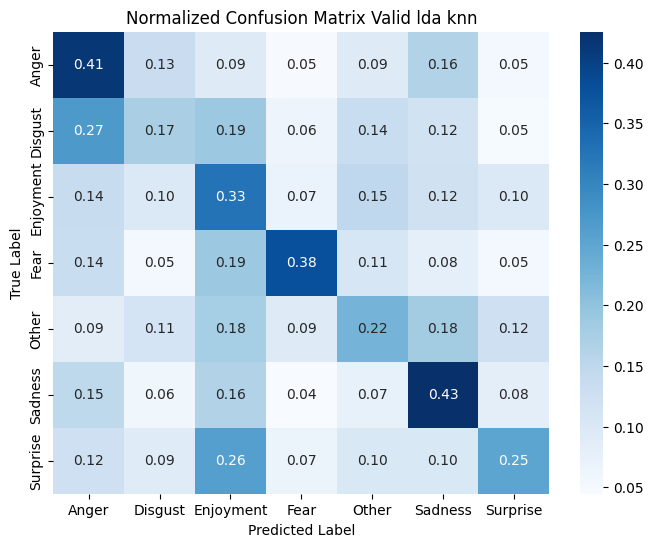

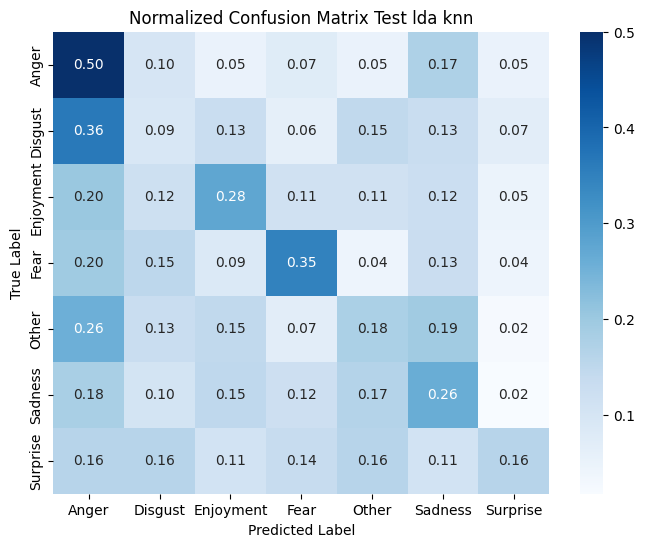

In [159]:

model_lda_73_knn, train_lda_73_knn, valid_lda_73_knn, test_lda_73_knn, pred_lda_73_knn = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="knn",
    max_iter=1000
)

y_train_lda_73_knn, y_valid_lda_73_knn, y_test_lda_73_knn = train_lda_73_knn[1], valid_lda_73_knn[1], test_lda_73_knn[1]
y_pred_train_lda_73_knn, y_pred_valid_lda_73_knn, y_pred_test_lda_73_knn = pred_lda_73_knn

pipeline_evaluation(
    y_train_lda_73_knn, y_valid_lda_73_knn, y_test_lda_73_knn,
    y_pred_train_lda_73_knn, y_pred_valid_lda_73_knn, y_pred_test_lda_73_knn,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu gốc

--- train --- 7:3 --- svm_linear --- none ---
Accuracy: 0.9437420986093552
Recall: 0.9437420986093552
Precision: 0.9451428963367089
F1-score: 0.9437678528137247

--- valid --- 7:3 --- svm_linear --- none ---
Accuracy: 0.5408990420044215
Recall: 0.5408990420044215
Precision: 0.5415199144230632
F1-score: 0.5402870373405337

--- test --- 7:3 --- svm_linear --- none ---
Accuracy: 0.36773255813953487
Recall: 0.36773255813953487
Precision: 0.3962173808586021
F1-score: 0.3695782067318609


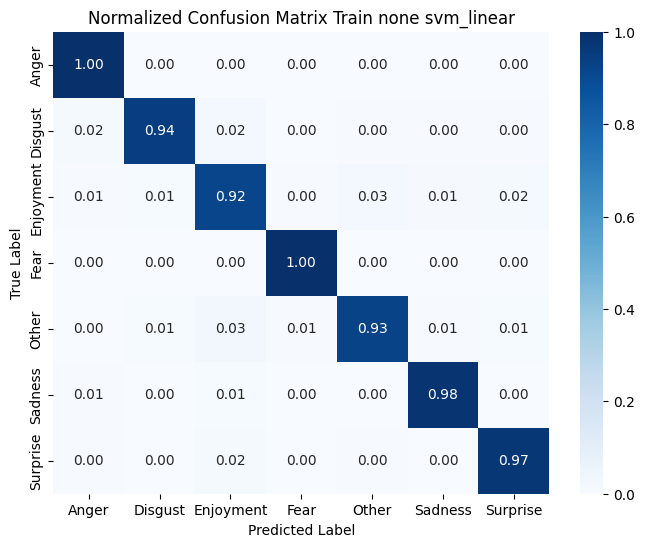

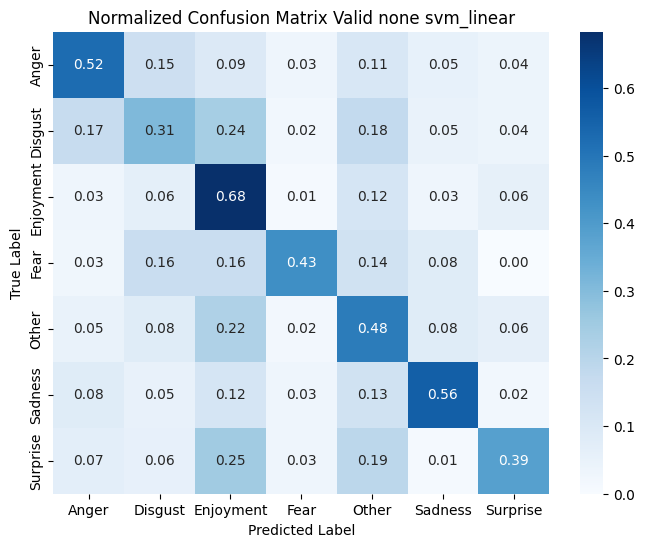

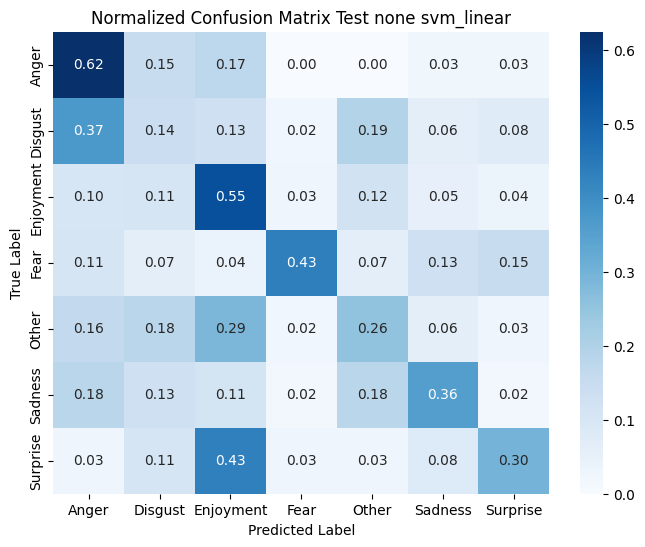

In [160]:
# SVM - linear - None (7:3)
model_73_svm_linear, train_73_svm_linear, valid_73_svm_linear, test_73_svm_linear, pred_73_svm_linear = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_73_svm_linear, y_valid_73_svm_linear, y_test_73_svm_linear = train_73_svm_linear[1], valid_73_svm_linear[1], test_73_svm_linear[1]
y_pred_train_73_svm_linear, y_pred_valid_73_svm_linear, y_pred_test_73_svm_linear = pred_73_svm_linear

pipeline_evaluation(
    y_train_73_svm_linear, y_valid_73_svm_linear, y_test_73_svm_linear,
    y_pred_train_73_svm_linear, y_pred_valid_73_svm_linear, y_pred_test_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- svm_poly --- none ---
Accuracy: 0.2828697850821745
Recall: 0.2828697850821745
Precision: 0.6517899900404744
F1-score: 0.17415014837441267

--- valid --- 7:3 --- svm_poly --- none ---
Accuracy: 0.2144436256448047
Recall: 0.2144436256448047
Precision: 0.51956215051428
F1-score: 0.10834427015852821

--- test --- 7:3 --- svm_poly --- none ---
Accuracy: 0.2005813953488372
Recall: 0.2005813953488372
Precision: 0.5649287443063092
F1-score: 0.08082520700787814


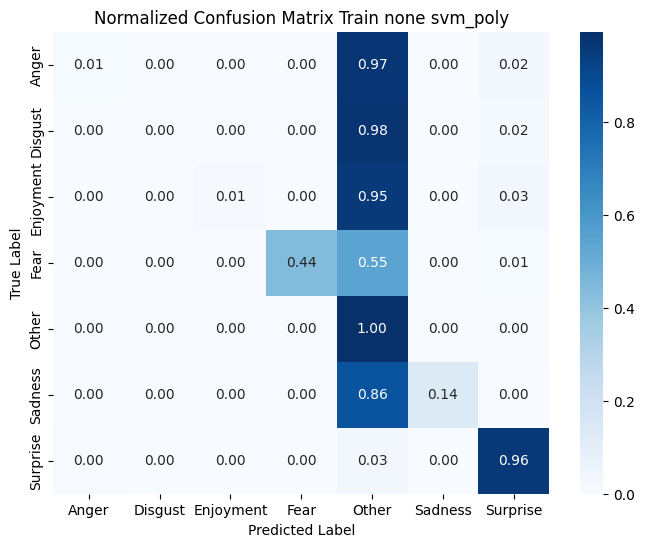

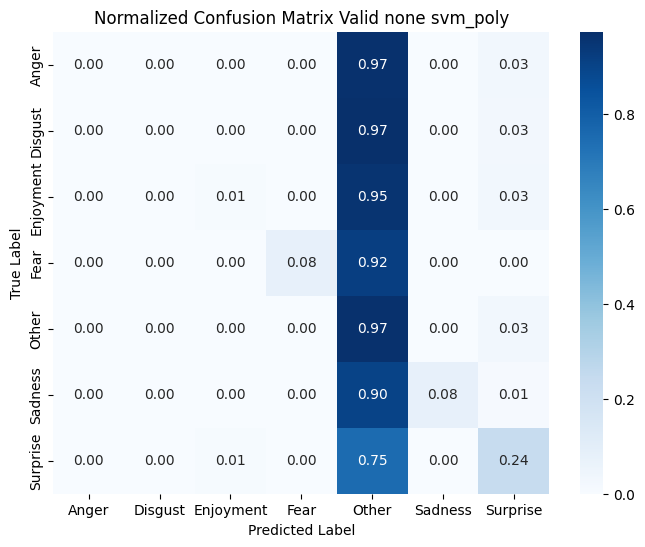

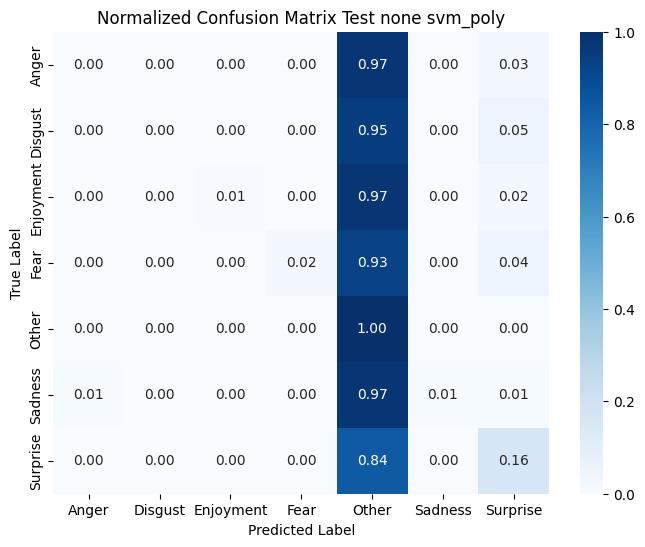

In [161]:
# SVM - poly - None (7:3)
model_73_svm_poly, train_73_svm_poly, valid_73_svm_poly, test_73_svm_poly, pred_73_svm_poly = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly = train_73_svm_poly[1], valid_73_svm_poly[1], test_73_svm_poly[1]
y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly = pred_73_svm_poly

pipeline_evaluation(
    y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly,
    y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

--- train --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.9472187104930467
Recall: 0.9472187104930467
Precision: 0.9496505942803717
F1-score: 0.9471973734515307

--- valid --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.5438467207074429
Recall: 0.5438467207074429
Precision: 0.5622265121424515
F1-score: 0.5424347264701866

--- test --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.34593023255813954
Recall: 0.34593023255813954
Precision: 0.4436636676167789
F1-score: 0.34099607185604297


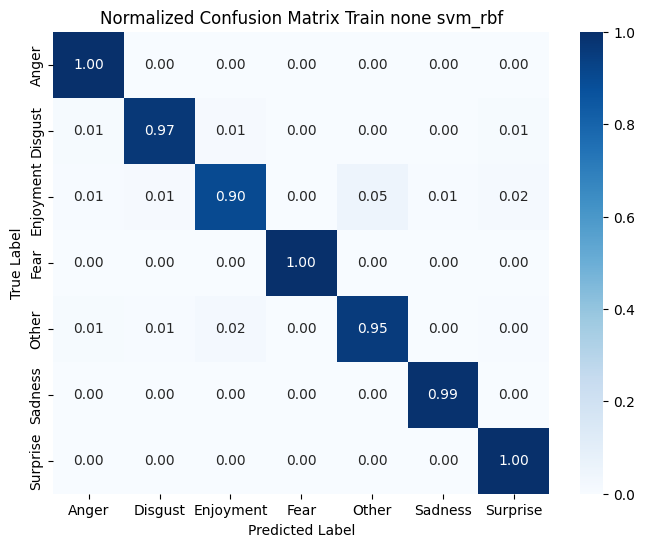

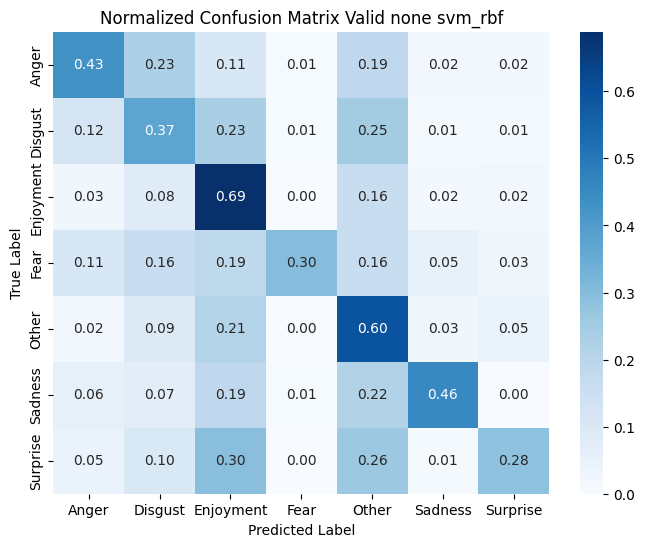

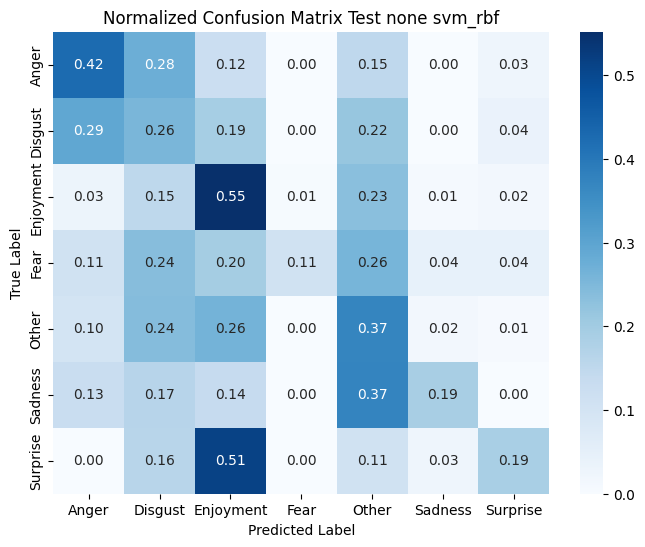

In [162]:
# SVM - rbf - None (7:3)
model_73_svm_rbf, train_73_svm_rbf, valid_73_svm_rbf, test_73_svm_rbf, pred_73_svm_rbf = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_73_svm_rbf, y_valid_73_svm_rbf, y_test_73_svm_rbf = train_73_svm_rbf[1], valid_73_svm_rbf[1], test_73_svm_rbf[1]
y_pred_train_73_svm_rbf, y_pred_valid_73_svm_rbf, y_pred_test_73_svm_rbf = pred_73_svm_rbf

pipeline_evaluation(
    y_train_73_svm_rbf, y_valid_73_svm_rbf, y_test_73_svm_rbf,
    y_pred_train_73_svm_rbf, y_pred_valid_73_svm_rbf, y_pred_test_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

## Bộ dữ liệu PCA

--- train --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.8830594184576486
Recall: 0.8830594184576486
Precision: 0.8876407836334753
F1-score: 0.8830665477320172

--- valid --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.5372144436256449
Recall: 0.5372144436256449
Precision: 0.5395685345369151
F1-score: 0.5373449118854556

--- test --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.37790697674418605
Recall: 0.37790697674418605
Precision: 0.41330006054058016
F1-score: 0.3816726646765636


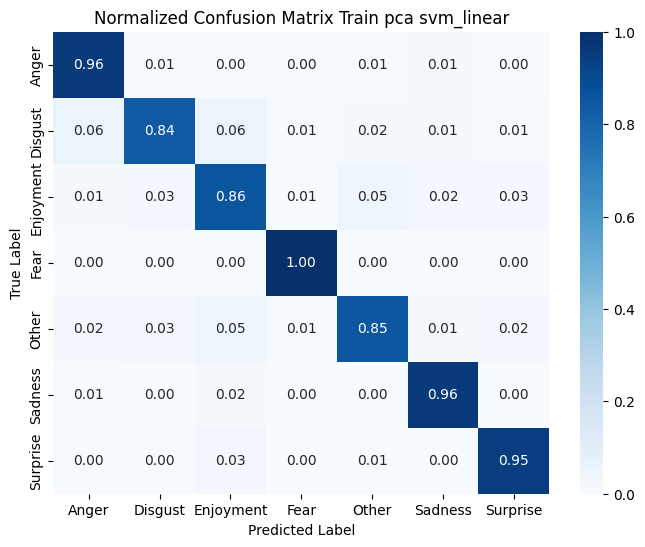

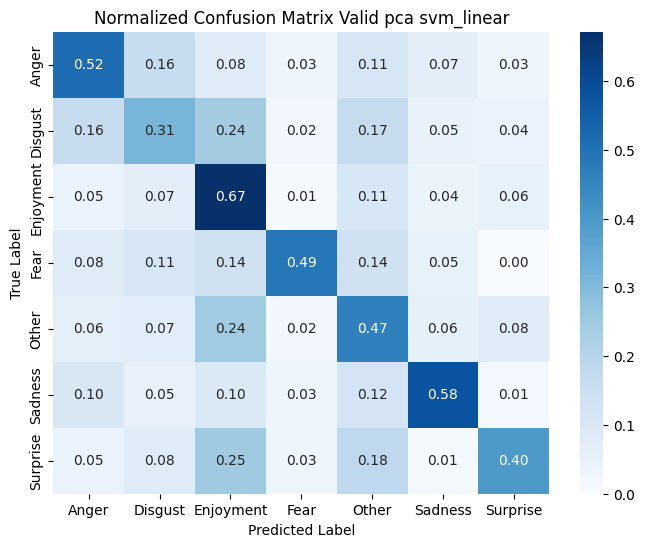

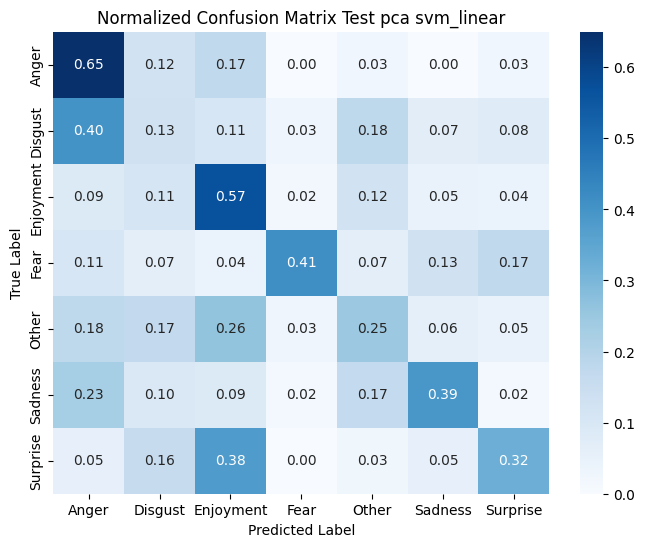

In [163]:
# SVM - linear - PCA (7:3)
model_pca_73_svm_linear, train_pca_73_svm_linear, valid_pca_73_svm_linear, test_pca_73_svm_linear, pred_pca_73_svm_linear = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_73_svm_linear, y_valid_pca_73_svm_linear, y_test_pca_73_svm_linear = train_pca_73_svm_linear[1], valid_pca_73_svm_linear[1], test_pca_73_svm_linear[1]
y_pred_train_pca_73_svm_linear, y_pred_valid_pca_73_svm_linear, y_pred_test_pca_73_svm_linear = pred_pca_73_svm_linear

pipeline_evaluation(
    y_train_pca_73_svm_linear, y_valid_pca_73_svm_linear, y_test_pca_73_svm_linear,
    y_pred_train_pca_73_svm_linear, y_pred_valid_pca_73_svm_linear, y_pred_test_pca_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.23925410872313527
Recall: 0.23925410872313527
Precision: 0.6046875774214343
F1-score: 0.13865712285827592

--- valid --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.21149594694178334
Recall: 0.21149594694178334
Precision: 0.5836347835046466
F1-score: 0.10500773686979098

--- test --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.1933139534883721
Recall: 0.1933139534883721
Precision: 0.38928773557169316
F1-score: 0.0709878830881673


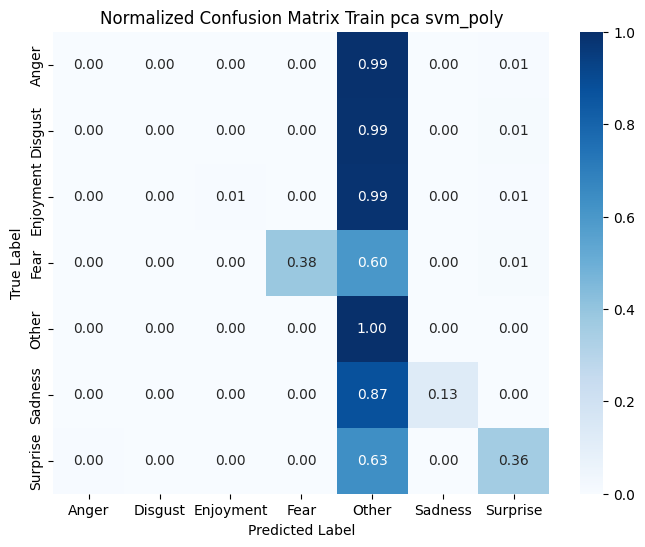

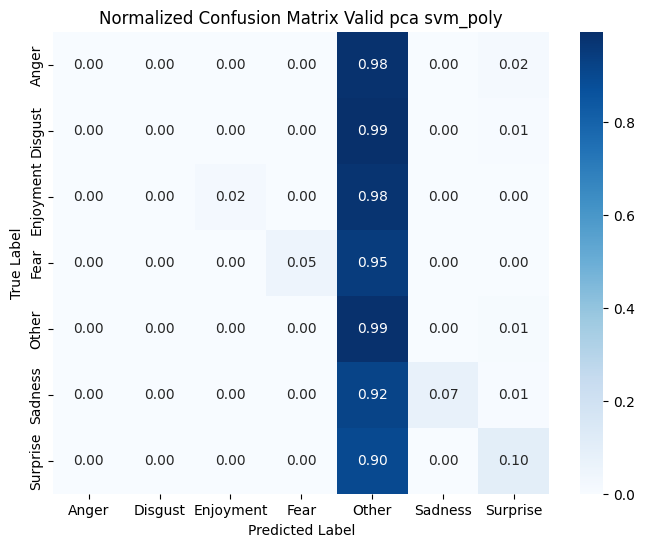

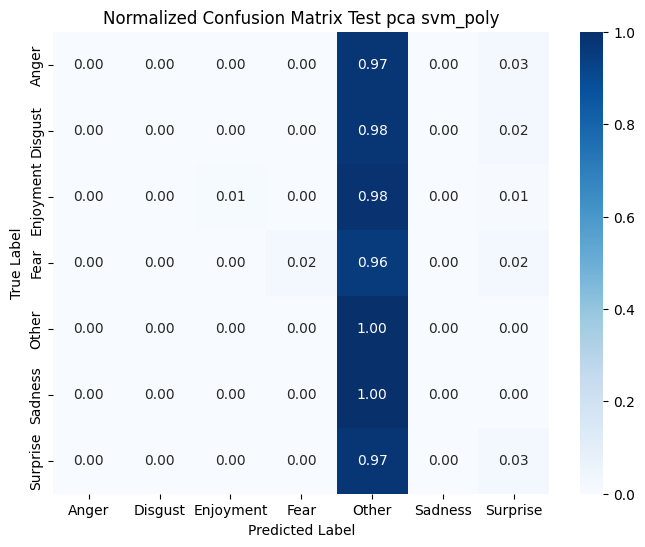

In [164]:
# SVM - poly - PCA (7:3)
model_pca_73_svm_poly, train_pca_73_svm_poly, valid_pca_73_svm_poly, test_pca_73_svm_poly, pred_pca_73_svm_poly = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly = train_pca_73_svm_poly[1], valid_pca_73_svm_poly[1], test_pca_73_svm_poly[1]
y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly = pred_pca_73_svm_poly

pipeline_evaluation(
    y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly,
    y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

--- train --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.9238305941845765
Recall: 0.9238305941845765
Precision: 0.9277906128090647
F1-score: 0.9235817464024769

--- valid --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.496683861459101
Recall: 0.496683861459101
Precision: 0.5391908575380058
F1-score: 0.5098798559822145

--- test --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.34738372093023256
Recall: 0.34738372093023256
Precision: 0.46215416854996744
F1-score: 0.36462187733545776


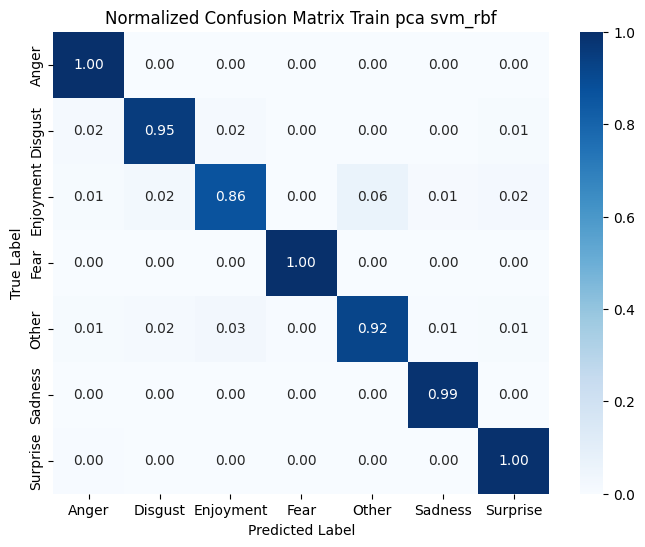

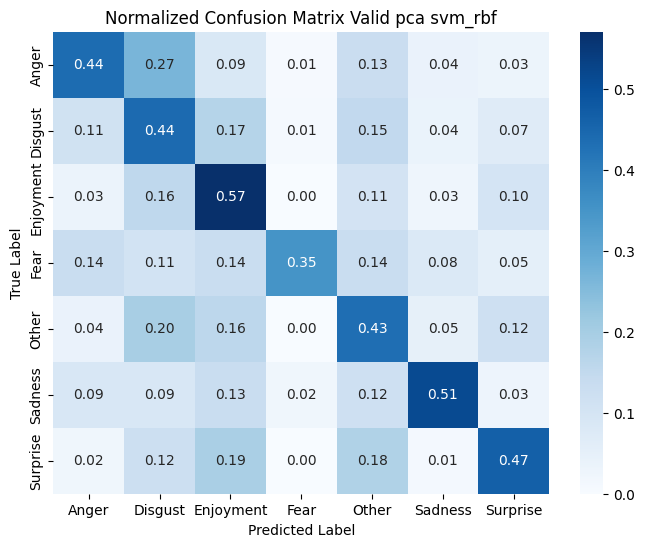

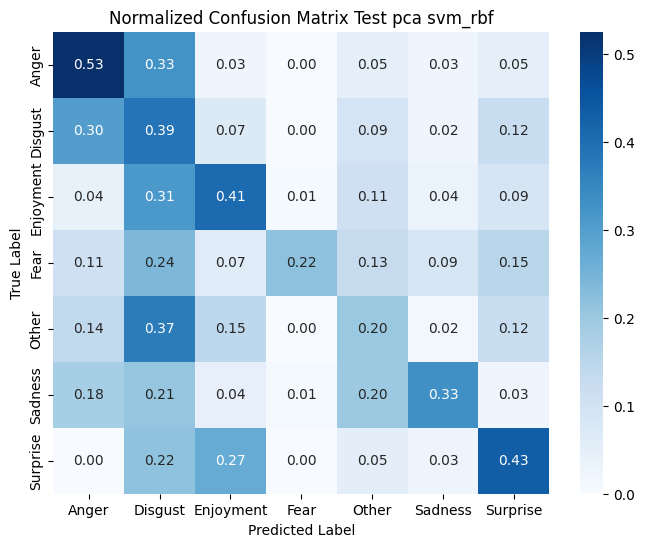

In [165]:
# SVM - rbf - PCA (7:3)
model_pca_73_svm_rbf, train_pca_73_svm_rbf, valid_pca_73_svm_rbf, test_pca_73_svm_rbf, pred_pca_73_svm_rbf = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_73_svm_rbf, y_valid_pca_73_svm_rbf, y_test_pca_73_svm_rbf = train_pca_73_svm_rbf[1], valid_pca_73_svm_rbf[1], test_pca_73_svm_rbf[1]
y_pred_train_pca_73_svm_rbf, y_pred_valid_pca_73_svm_rbf, y_pred_test_pca_73_svm_rbf = pred_pca_73_svm_rbf

pipeline_evaluation(
    y_train_pca_73_svm_rbf, y_valid_pca_73_svm_rbf, y_test_pca_73_svm_rbf,
    y_pred_train_pca_73_svm_rbf, y_pred_valid_pca_73_svm_rbf, y_pred_test_pca_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

## Bộ dữ liệu LDA

--- train --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.9933628318584071
Recall: 0.9933628318584071
Precision: 0.9936542432738052
F1-score: 0.9934276135771711

--- valid --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.3492999263080324
Recall: 0.3492999263080324
Precision: 0.3662073896835645
F1-score: 0.3516082016791635

--- test --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.27906976744186046
Recall: 0.27906976744186046
Precision: 0.27827875884546505
F1-score: 0.26819478802153446


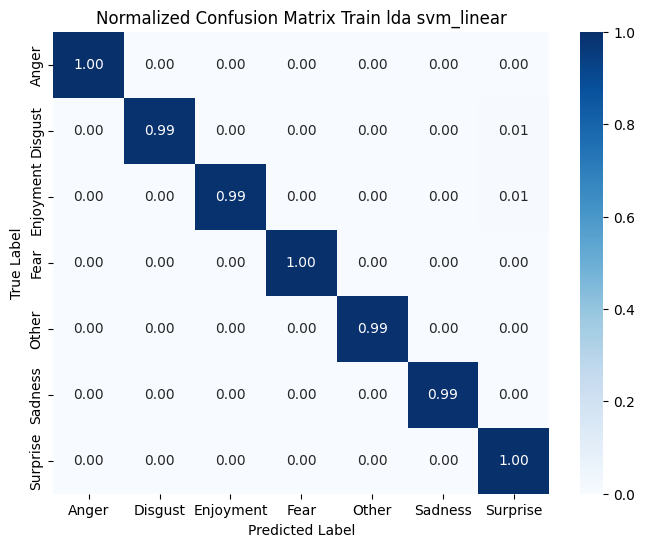

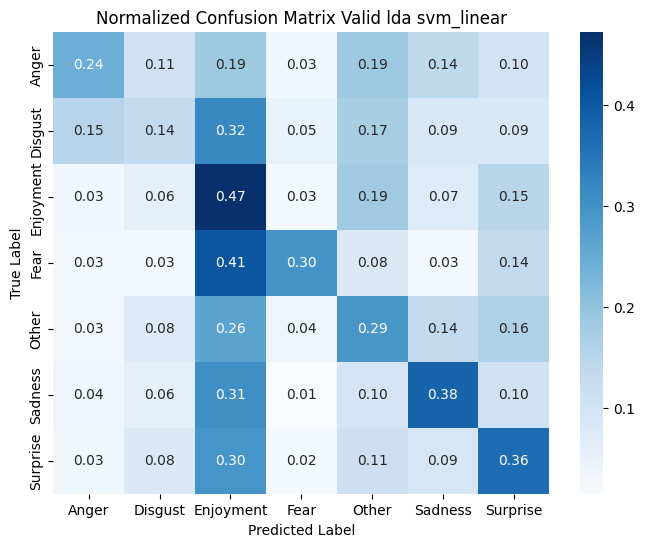

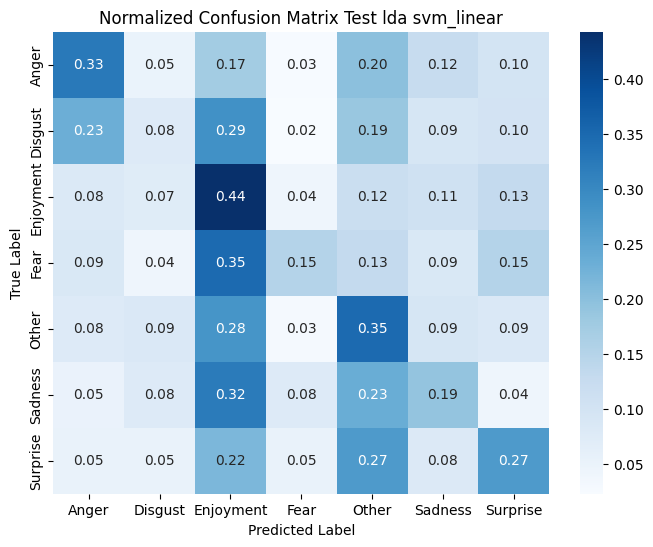

In [166]:
# SVM - linear - LDA (7:3)
model_lda_73_svm_linear, train_lda_73_svm_linear, valid_lda_73_svm_linear, test_lda_73_svm_linear, pred_lda_73_svm_linear = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_73_svm_linear, y_valid_lda_73_svm_linear, y_test_lda_73_svm_linear = train_lda_73_svm_linear[1], valid_lda_73_svm_linear[1], test_lda_73_svm_linear[1]
y_pred_train_lda_73_svm_linear, y_pred_valid_lda_73_svm_linear, y_pred_test_lda_73_svm_linear = pred_lda_73_svm_linear

pipeline_evaluation(
    y_train_lda_73_svm_linear, y_valid_lda_73_svm_linear, y_test_lda_73_svm_linear,
    y_pred_train_lda_73_svm_linear, y_pred_valid_lda_73_svm_linear, y_pred_test_lda_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.9876738305941846
Recall: 0.9876738305941846
Precision: 0.9880529477919974
F1-score: 0.9876763767668673

--- valid --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.2829771554900516
Recall: 0.2829771554900516
Precision: 0.32596760352061765
F1-score: 0.2893540766484104

--- test --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.22529069767441862
Recall: 0.22529069767441862
Precision: 0.2589167485018594
F1-score: 0.22404362148635926


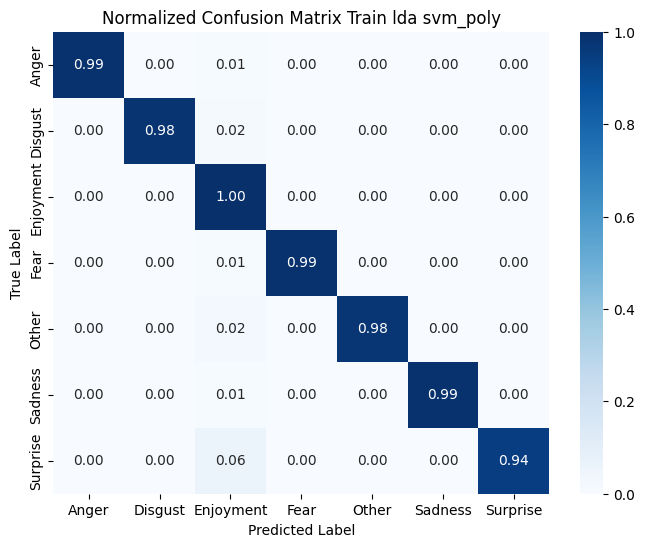

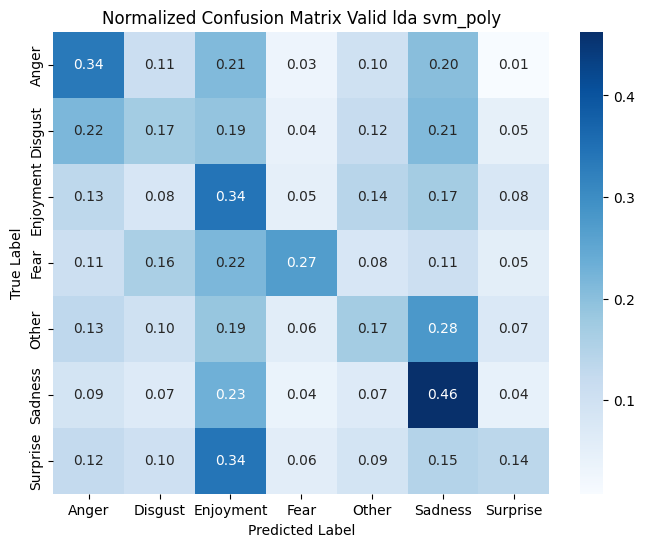

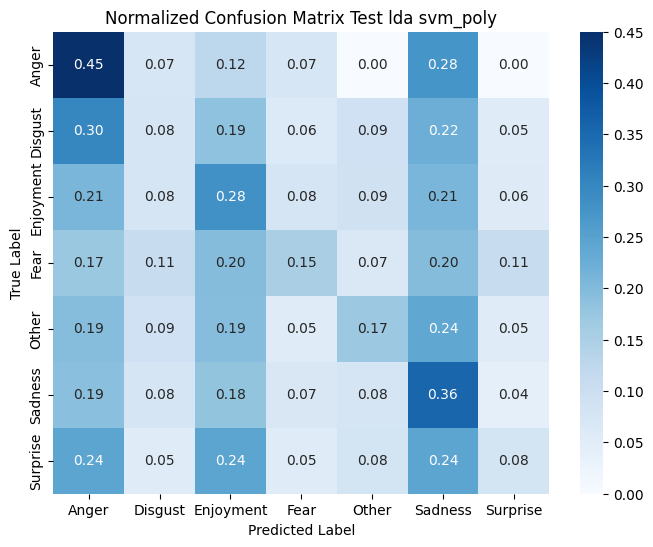

In [167]:
# SVM - poly - LDA (7:3)
model_lda_73_svm_poly, train_lda_73_svm_poly, valid_lda_73_svm_poly, test_lda_73_svm_poly, pred_lda_73_svm_poly = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_73_svm_poly, y_valid_lda_73_svm_poly, y_test_lda_73_svm_poly = train_lda_73_svm_poly[1], valid_lda_73_svm_poly[1], test_lda_73_svm_poly[1]
y_pred_train_lda_73_svm_poly, y_pred_valid_lda_73_svm_poly, y_pred_test_lda_73_svm_poly = pred_lda_73_svm_poly

pipeline_evaluation(
    y_train_lda_73_svm_poly, y_valid_lda_73_svm_poly, y_test_lda_73_svm_poly,
    y_pred_train_lda_73_svm_poly, y_pred_valid_lda_73_svm_poly, y_pred_test_lda_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.9952591656131479
Recall: 0.9952591656131479
Precision: 0.9954331192373002
F1-score: 0.9952978775654256

--- valid --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.39056742815033163
Recall: 0.39056742815033163
Precision: 0.21247308376508026
F1-score: 0.22366393773403495

--- test --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.27761627906976744
Recall: 0.27761627906976744
Precision: 0.07770018306325853
F1-score: 0.12141759813529691


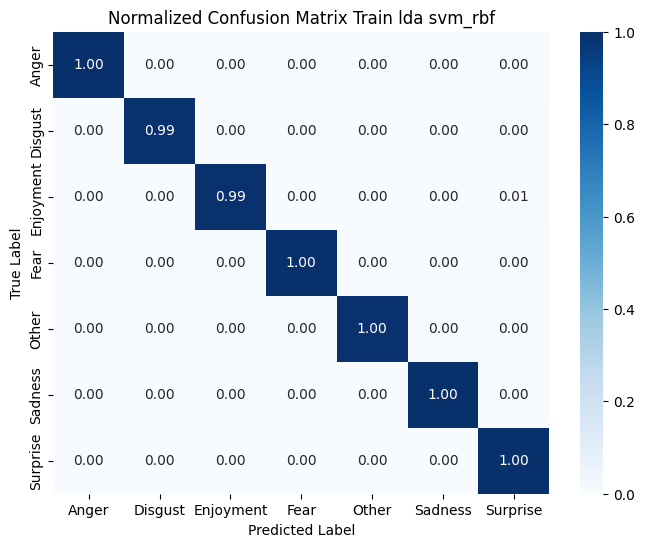

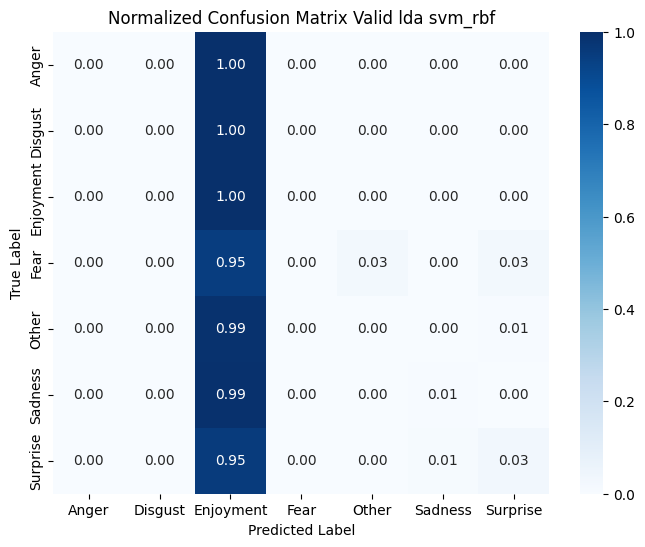

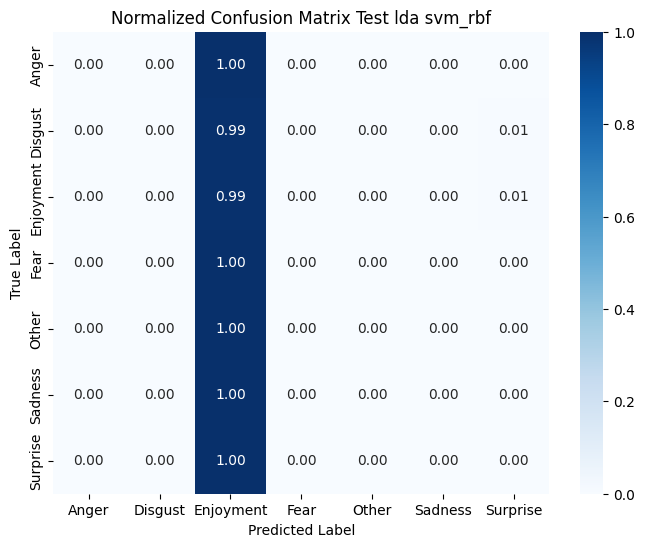

In [168]:
# SVM - rbf - LDA (7:3)
model_lda_73_svm_rbf, train_lda_73_svm_rbf, valid_lda_73_svm_rbf, test_lda_73_svm_rbf, pred_lda_73_svm_rbf = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_73_svm_rbf, y_valid_lda_73_svm_rbf, y_test_lda_73_svm_rbf = train_lda_73_svm_rbf[1], valid_lda_73_svm_rbf[1], test_lda_73_svm_rbf[1]
y_pred_train_lda_73_svm_rbf, y_pred_valid_lda_73_svm_rbf, y_pred_test_lda_73_svm_rbf = pred_lda_73_svm_rbf

pipeline_evaluation(
    y_train_lda_73_svm_rbf, y_valid_lda_73_svm_rbf, y_test_lda_73_svm_rbf,
    y_pred_train_lda_73_svm_rbf, y_pred_valid_lda_73_svm_rbf, y_pred_test_lda_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Train:Validation = 6:4

## Logistic Regression

### Bộ dữ liệu không giảm chiều

TF-IDF hoàn thành!
Shape: (2712, 4452) (số câu x số từ vựng)
Số từ vựng: 4452
TF-IDF - Non-zero values: 32346


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.8300147492625368
Recall: 0.8300147492625368
Precision: 0.8471922692747177
F1-score: 0.8301486808937032

--- valid --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.5245992260917635
Recall: 0.5245992260917635
Precision: 0.5462953902140787
F1-score: 0.5311716790623824

--- test --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.3561046511627907
Recall: 0.3561046511627907
Precision: 0.4160776835074744
F1-score: 0.3704421291305375


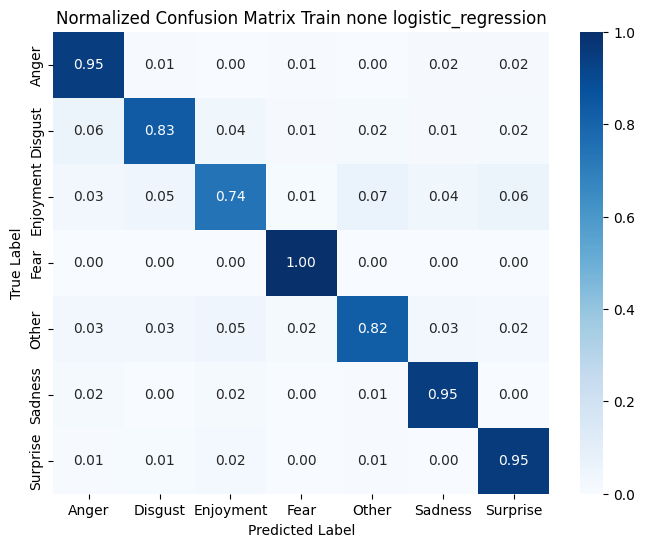

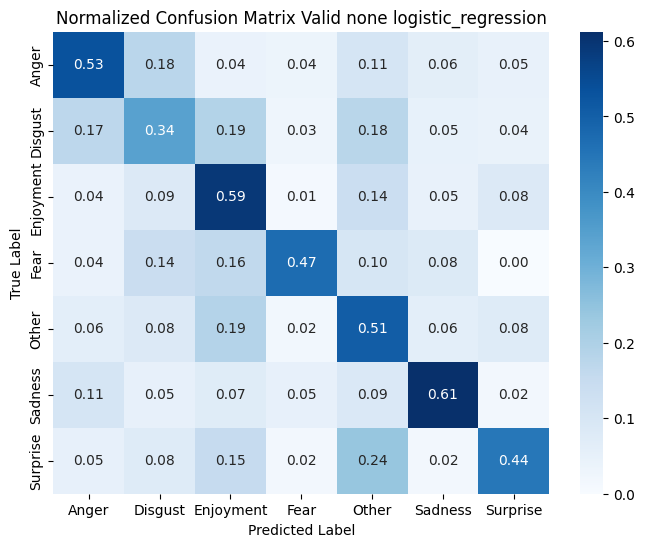

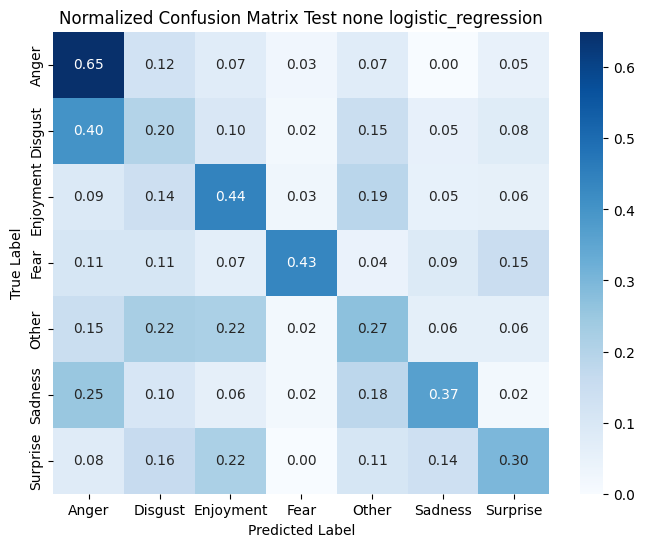

In [169]:
X_train_64, X_valid_64, X_test_64, y_train_64, y_valid_64, y_test_64, tfidf_vec_64, disc_model_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="none"
)

model_64, train_64, valid_64, test_64, pred_64 = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_64, y_pred_valid_64, y_pred_test_64 = pred_64
pipeline_evaluation(
    y_train_64, y_valid_64, y_test_64,
    y_pred_train_64, y_pred_valid_64, y_pred_test_64,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (2712, 4452) (số câu x số từ vựng)
Số từ vựng: 4452
TF-IDF - Non-zero values: 32346


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.7876106194690266
Recall: 0.7876106194690266
Precision: 0.8089273679883837
F1-score: 0.7882703836188935

--- valid --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.5218352681039248
Recall: 0.5218352681039248
Precision: 0.5451169851106352
F1-score: 0.5286574960490844

--- test --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.35901162790697677
Recall: 0.35901162790697677
Precision: 0.4229174857263823
F1-score: 0.3722712690040192


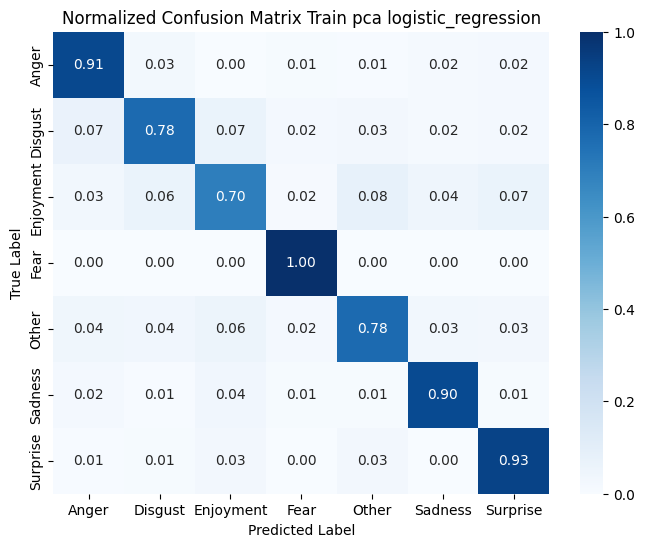

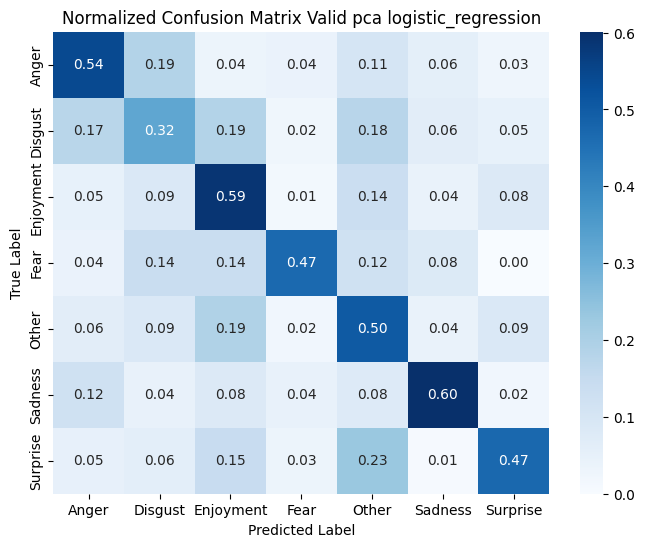

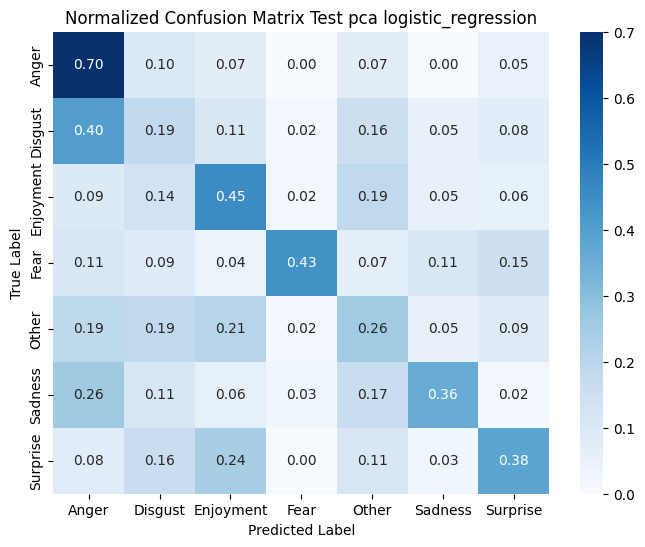

In [170]:
X_train_pca_64, X_valid_pca_64, X_test_pca_64, y_train_pca_64, y_valid_pca_64, y_test_pca_64, tfidf_vec_pca_64, disc_model_pca_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="pca"
)

model_pca_64, train_pca_64, valid_pca_64, test_pca_64, pred_pca_64 = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_pca_64, y_pred_valid_pca_64, y_pred_test_pca_64 = pred_pca_64

pipeline_evaluation(
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    y_pred_train_pca_64, y_pred_valid_pca_64, y_pred_test_pca_64,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (2712, 4452) (số câu x số từ vựng)
Số từ vựng: 4452
TF-IDF - Non-zero values: 32346


c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.9933628318584071
Recall: 0.9933628318584071
Precision: 0.9938530391898045
F1-score: 0.9934767484738969

--- valid --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.30071862907683805
Recall: 0.30071862907683805
Precision: 0.3483779587638202
F1-score: 0.31326640679348255

--- test --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.24273255813953487
Recall: 0.24273255813953487
Precision: 0.2658776409100379
F1-score: 0.2450492594800973


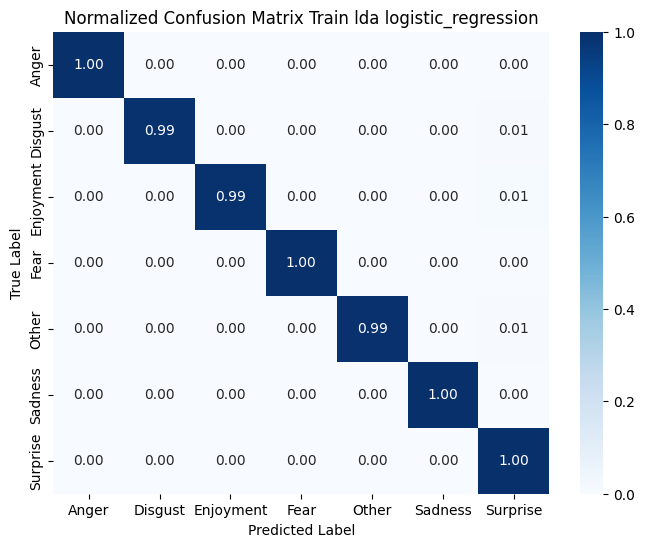

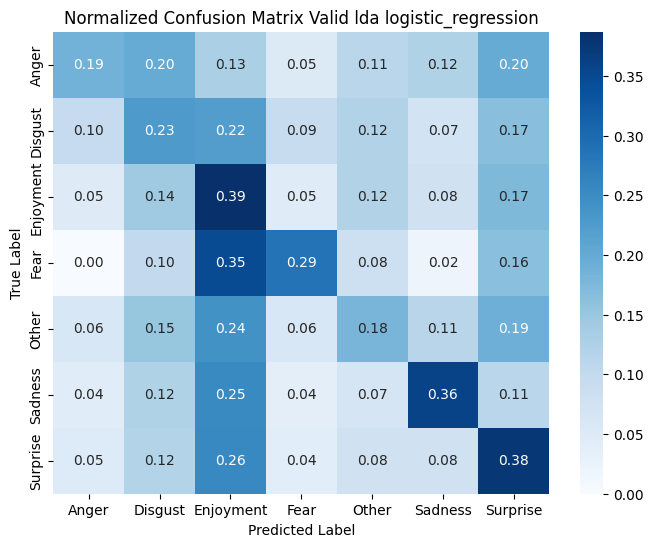

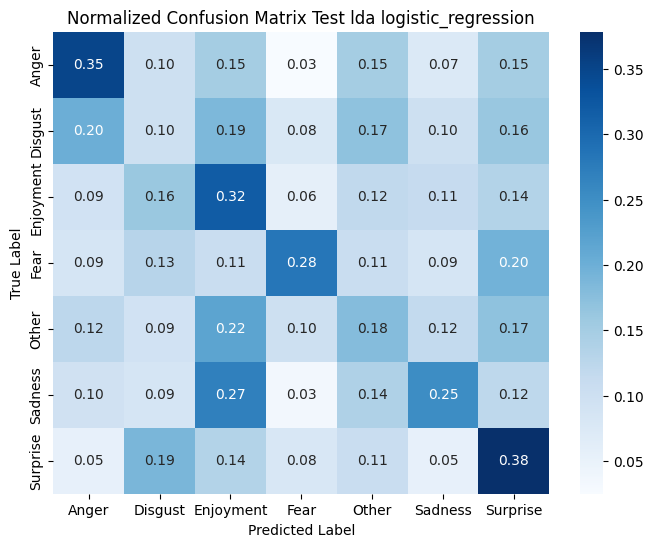

In [171]:
X_train_lda_64, X_valid_lda_64, X_test_lda_64, y_train_lda_64, y_valid_lda_64, y_test_lda_64, tfidf_vec_lda_64, disc_model_lda_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="lda"
)

model_lda_64, train_lda_64, valid_lda_64, test_lda_64, pred_lda_64 = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_lda_64, y_pred_valid_lda_64, y_pred_test_lda_64 = pred_lda_64

pipeline_evaluation(
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    y_pred_train_lda_64, y_pred_valid_lda_64, y_pred_test_lda_64,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.45206489675516226
Recall: 0.45206489675516226
Precision: 0.5935162259499435
F1-score: 0.3433078616908822

--- valid --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.43449419568822556
Recall: 0.43449419568822556
Precision: 0.47451294767553764
F1-score: 0.316013522228902

--- test --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.29069767441860467
Recall: 0.29069767441860467
Precision: 0.3336293014111982
F1-score: 0.1524917821712461


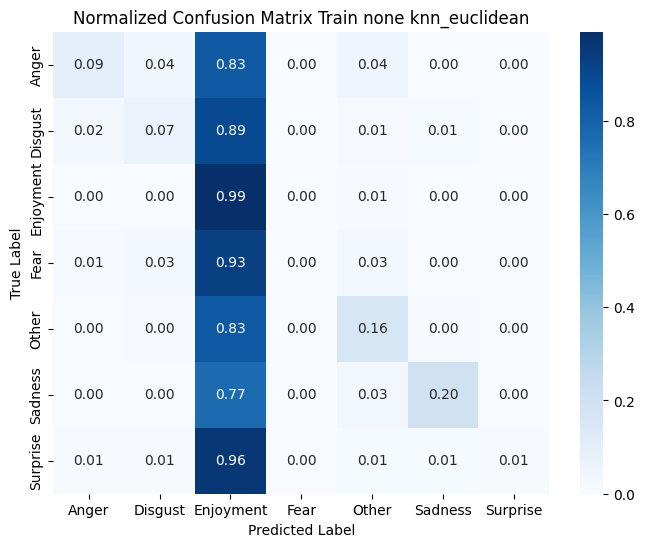

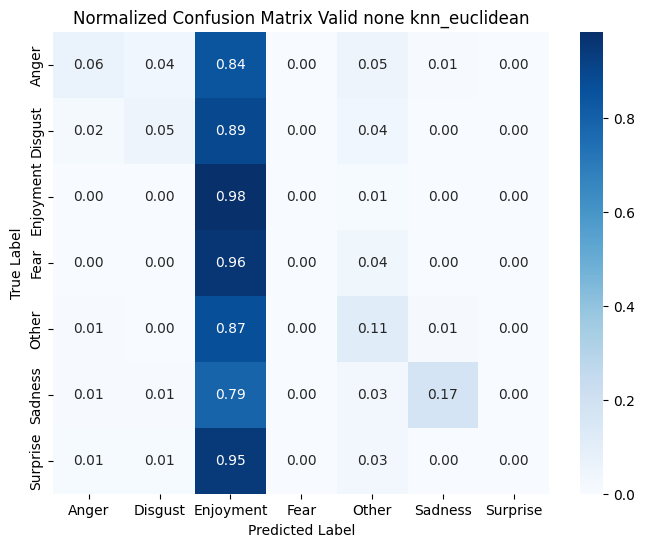

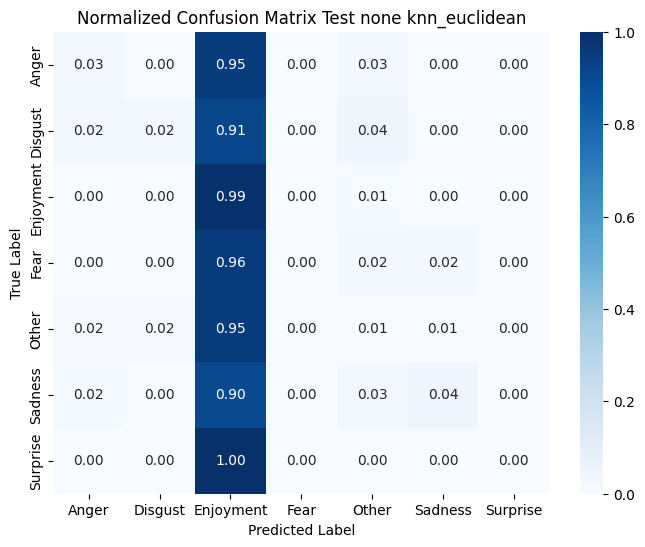

In [172]:
# KNN - euclidean - None (6:4)
model_64_knn_euclidean, train_64_knn_euclidean, valid_64_knn_euclidean, test_64_knn_euclidean, pred_64_knn_euclidean = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="knn",
    metric="euclidean"
)

y_train_64_knn_euclidean, y_valid_64_knn_euclidean, y_test_64_knn_euclidean = train_64_knn_euclidean[1], valid_64_knn_euclidean[1], test_64_knn_euclidean[1]
y_pred_train_64_knn_euclidean, y_pred_valid_64_knn_euclidean, y_pred_test_64_knn_euclidean = pred_64_knn_euclidean

pipeline_evaluation(
    y_train_64_knn_euclidean, y_valid_64_knn_euclidean, y_test_64_knn_euclidean,
    y_pred_train_64_knn_euclidean, y_pred_valid_64_knn_euclidean, y_pred_test_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 6:4 --- knn --- none ---
Accuracy: 0.4808259587020649
Recall: 0.4808259587020649
Precision: 0.552757218801471
F1-score: 0.39474740256616375

--- valid --- 6:4 --- knn --- none ---
Accuracy: 0.4593698175787728
Recall: 0.4593698175787728
Precision: 0.45562508175156563
F1-score: 0.365593088769937

--- test --- 6:4 --- knn --- none ---
Accuracy: 0.29505813953488375
Recall: 0.29505813953488375
Precision: 0.328809940846181
F1-score: 0.1850021031880439


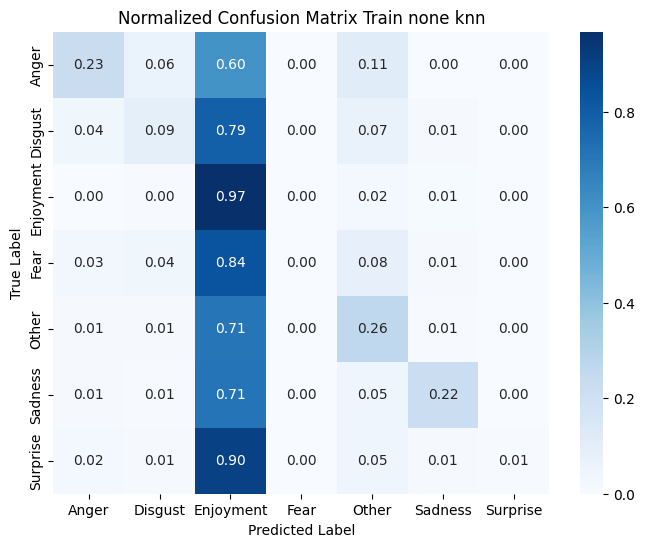

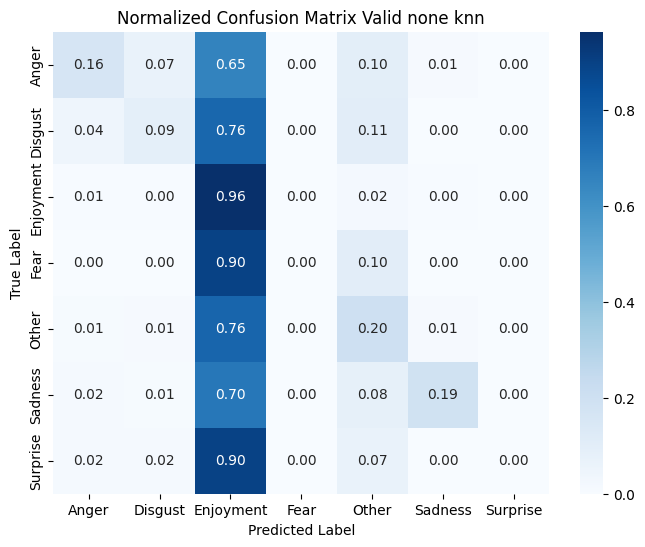

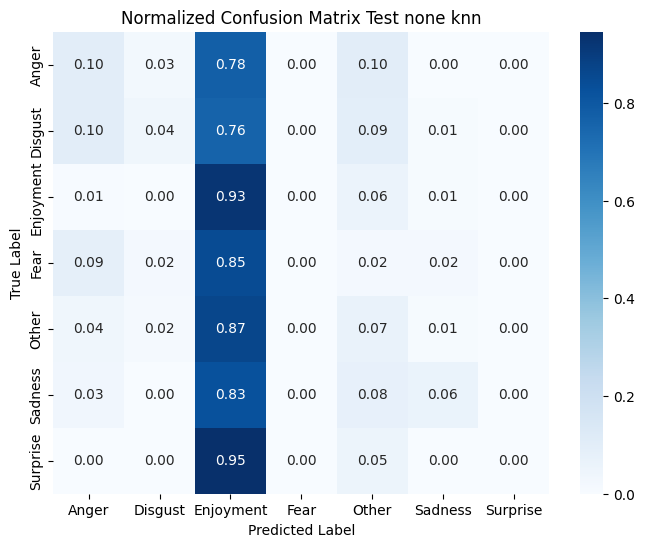

In [173]:
model_64_knn, train_64_knn, valid_64_knn, test_64_knn, pred_64_knn = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="knn"
)

y_train_64_knn, y_valid_64_knn, y_test_64_knn = train_64_knn[1], valid_64_knn[1], test_64_knn[1]
y_pred_train_64_knn, y_pred_valid_64_knn, y_pred_test_64_knn = pred_64_knn

pipeline_evaluation(
    y_train_64_knn, y_valid_64_knn, y_test_64_knn,
    y_pred_train_64_knn, y_pred_valid_64_knn, y_pred_test_64_knn,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu PCA

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.45722713864306785
Recall: 0.45722713864306785
Precision: 0.520185911185709
F1-score: 0.3511231698225783

--- valid --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.44112769485903813
Recall: 0.44112769485903813
Precision: 0.48026504555855265
F1-score: 0.32884970652953993

--- test --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.2921511627906977
Recall: 0.2921511627906977
Precision: 0.3058237160579043
F1-score: 0.1592612629053475


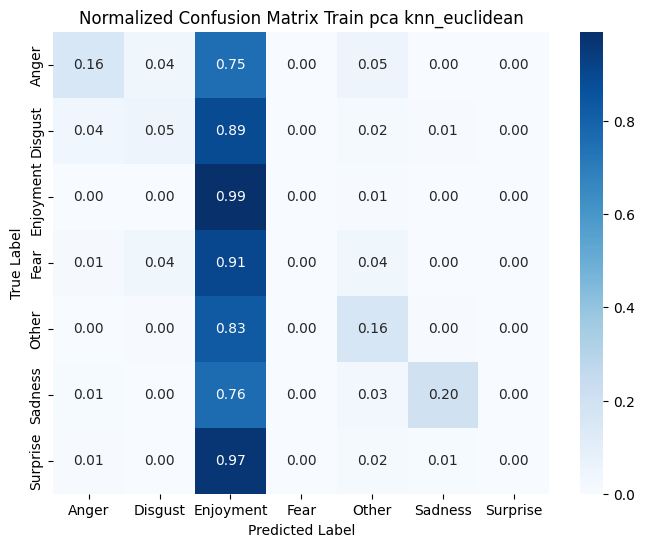

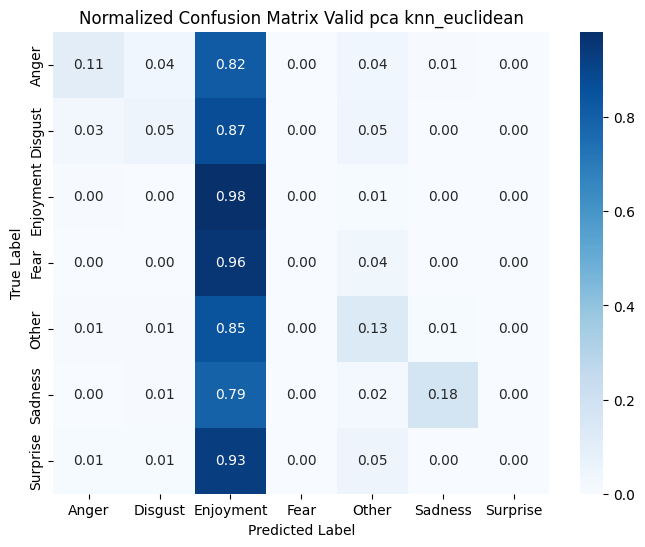

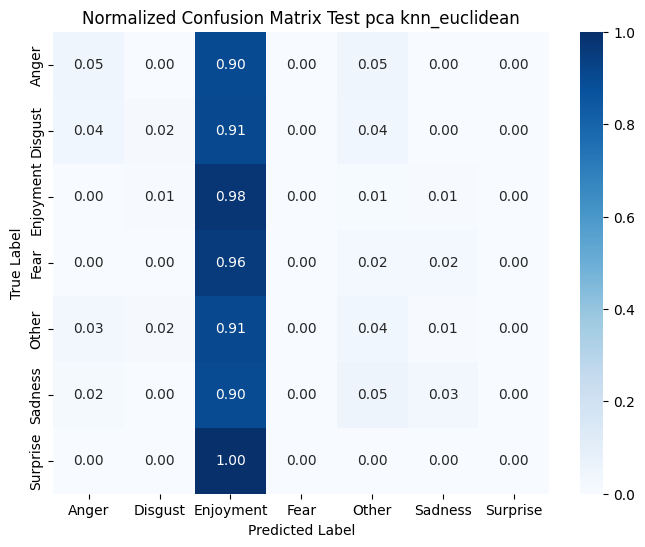

In [174]:
# KNN - euclidean - PCA (6:4)
model_pca_64_knn_euclidean, train_pca_64_knn_euclidean, valid_pca_64_knn_euclidean, test_pca_64_knn_euclidean, pred_pca_64_knn_euclidean = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_64_knn_euclidean, y_valid_pca_64_knn_euclidean, y_test_pca_64_knn_euclidean = train_pca_64_knn_euclidean[1], valid_pca_64_knn_euclidean[1], test_pca_64_knn_euclidean[1]
y_pred_train_pca_64_knn_euclidean, y_pred_valid_pca_64_knn_euclidean, y_pred_test_pca_64_knn_euclidean = pred_pca_64_knn_euclidean

pipeline_evaluation(
    y_train_pca_64_knn_euclidean, y_valid_pca_64_knn_euclidean, y_test_pca_64_knn_euclidean,
    y_pred_train_pca_64_knn_euclidean, y_pred_valid_pca_64_knn_euclidean, y_pred_test_pca_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- knn --- pca ---
Accuracy: 0.48008849557522126
Recall: 0.48008849557522126
Precision: 0.5549240176091306
F1-score: 0.3929001460502237

--- valid --- 6:4 --- knn --- pca ---
Accuracy: 0.4527363184079602
Recall: 0.4527363184079602
Precision: 0.5074149796526262
F1-score: 0.36046034326450915

--- test --- 6:4 --- knn --- pca ---
Accuracy: 0.29941860465116277
Recall: 0.29941860465116277
Precision: 0.30903854624789956
F1-score: 0.18479138679790133


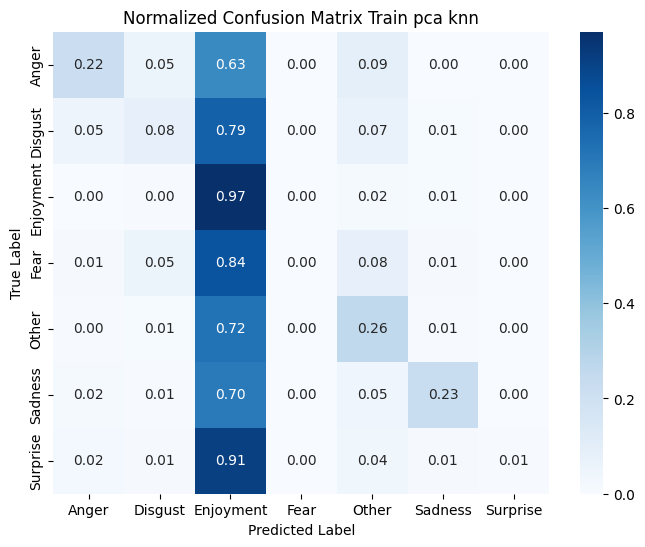

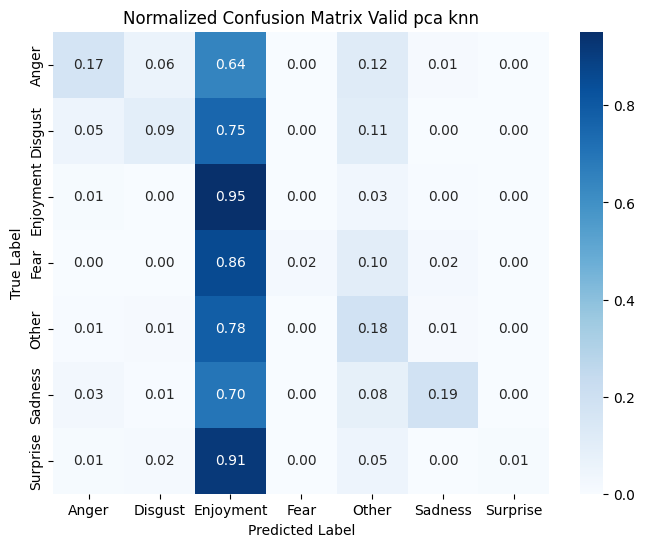

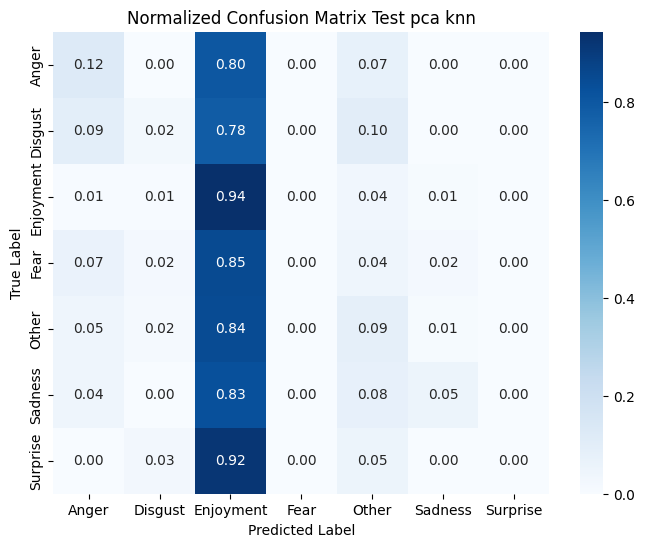

In [175]:

model_pca_64_knn, train_pca_64_knn, valid_pca_64_knn, test_pca_64_knn, pred_pca_64_knn = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="knn",
    max_iter=1000
)

y_train_pca_64_knn, y_valid_pca_64_knn, y_test_pca_64_knn = train_pca_64_knn[1], valid_pca_64_knn[1], test_pca_64_knn[1]
y_pred_train_pca_64_knn, y_pred_valid_pca_64_knn, y_pred_test_pca_64_knn = pred_pca_64_knn

pipeline_evaluation(
    y_train_pca_64_knn, y_valid_pca_64_knn, y_test_pca_64_knn,
    y_pred_train_pca_64_knn, y_pred_valid_pca_64_knn, y_pred_test_pca_64_knn,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.9929941002949852
Recall: 0.9929941002949852
Precision: 0.9930243099643401
F1-score: 0.9929728326785482

--- valid --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.33388612493090103
Recall: 0.33388612493090103
Precision: 0.3602881995357336
F1-score: 0.34137375799848363

--- test --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.2601744186046512
Recall: 0.2601744186046512
Precision: 0.28649923745947725
F1-score: 0.2636702635549015


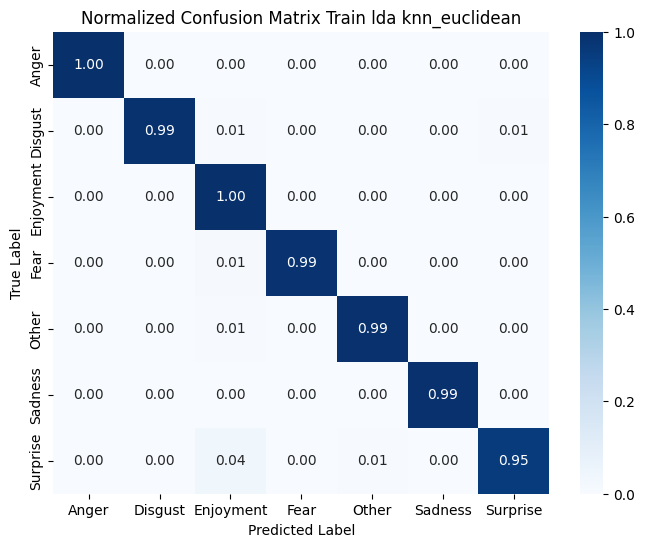

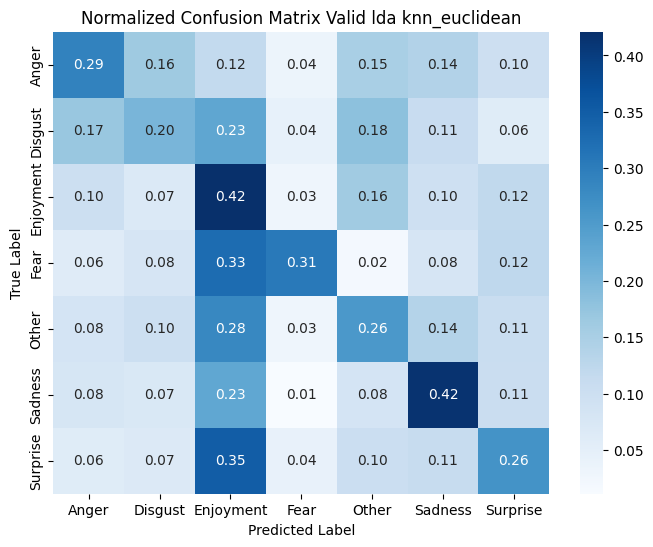

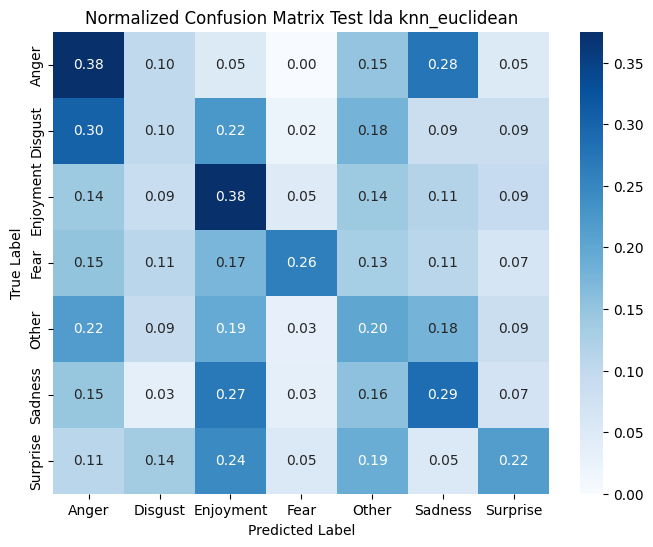

In [176]:
# KNN - euclidean - LDA (6:4)
model_lda_64_knn_euclidean, train_lda_64_knn_euclidean, valid_lda_64_knn_euclidean, test_lda_64_knn_euclidean, pred_lda_64_knn_euclidean = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_64_knn_euclidean, y_valid_lda_64_knn_euclidean, y_test_lda_64_knn_euclidean = train_lda_64_knn_euclidean[1], valid_lda_64_knn_euclidean[1], test_lda_64_knn_euclidean[1]
y_pred_train_lda_64_knn_euclidean, y_pred_valid_lda_64_knn_euclidean, y_pred_test_lda_64_knn_euclidean = pred_lda_64_knn_euclidean

pipeline_evaluation(
    y_train_lda_64_knn_euclidean, y_valid_lda_64_knn_euclidean, y_test_lda_64_knn_euclidean,
    y_pred_train_lda_64_knn_euclidean, y_pred_valid_lda_64_knn_euclidean, y_pred_test_lda_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 6:4 --- knn --- lda ---
Accuracy: 0.9893067846607669
Recall: 0.9893067846607669
Precision: 0.9897441963944396
F1-score: 0.9894209430080325

--- valid --- 6:4 --- knn --- lda ---
Accuracy: 0.3029297954671089
Recall: 0.3029297954671089
Precision: 0.35518283522299027
F1-score: 0.3124847764084762

--- test --- 6:4 --- knn --- lda ---
Accuracy: 0.23982558139534885
Recall: 0.23982558139534885
Precision: 0.2806918294375005
F1-score: 0.2416250857123572


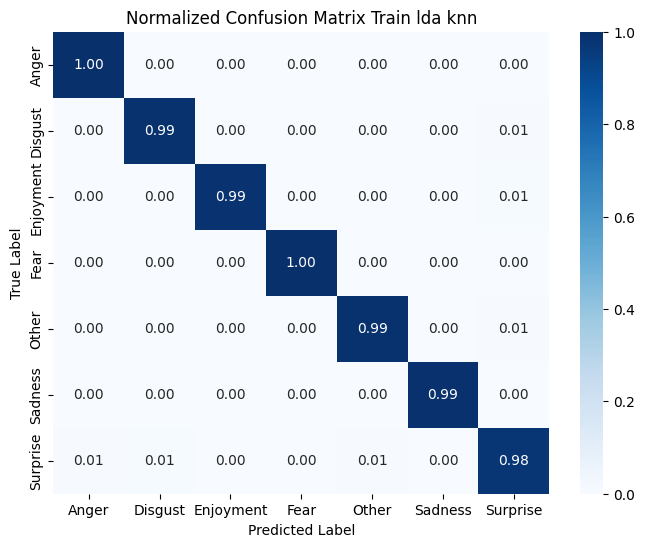

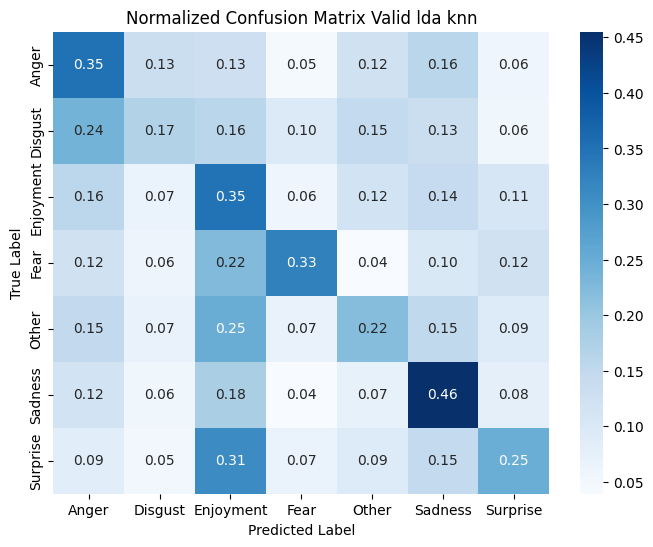

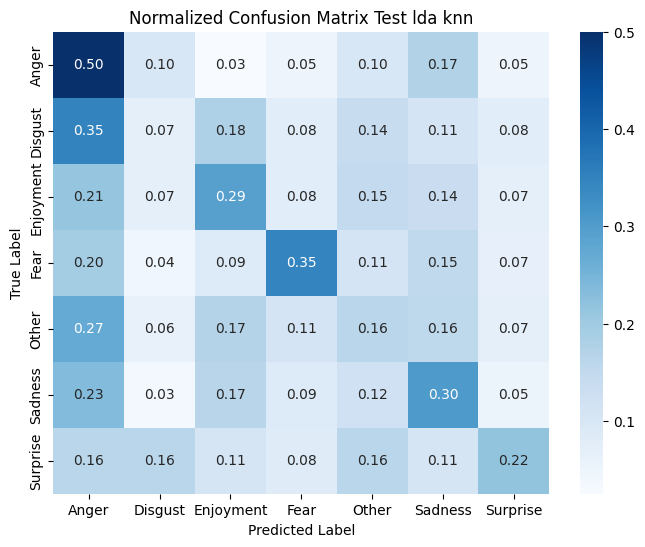

In [177]:

model_lda_64_knn, train_lda_64_knn, valid_lda_64_knn, test_lda_64_knn, pred_lda_64_knn = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="knn",
    max_iter=1000
)

y_train_lda_64_knn, y_valid_lda_64_knn, y_test_lda_64_knn = train_lda_64_knn[1], valid_lda_64_knn[1], test_lda_64_knn[1]
y_pred_train_lda_64_knn, y_pred_valid_lda_64_knn, y_pred_test_lda_64_knn = pred_lda_64_knn

pipeline_evaluation(
    y_train_lda_64_knn, y_valid_lda_64_knn, y_test_lda_64_knn,
    y_pred_train_lda_64_knn, y_pred_valid_lda_64_knn, y_pred_test_lda_64_knn,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu gốc

--- train --- 6:4 --- svm_linear --- none ---
Accuracy: 0.9487463126843658
Recall: 0.9487463126843658
Precision: 0.9501077862436152
F1-score: 0.9488703814466906

--- valid --- 6:4 --- svm_linear --- none ---
Accuracy: 0.5367606412382532
Recall: 0.5367606412382532
Precision: 0.5381096448296575
F1-score: 0.5360629743645284

--- test --- 6:4 --- svm_linear --- none ---
Accuracy: 0.3648255813953488
Recall: 0.3648255813953488
Precision: 0.3944609881823758
F1-score: 0.3676219796290627


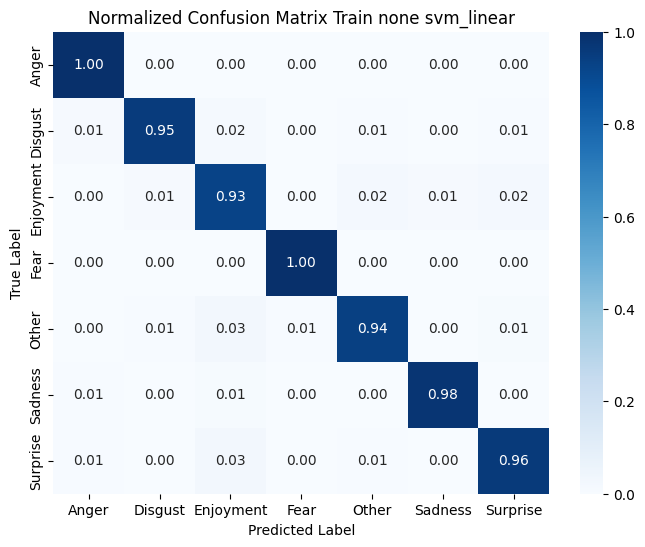

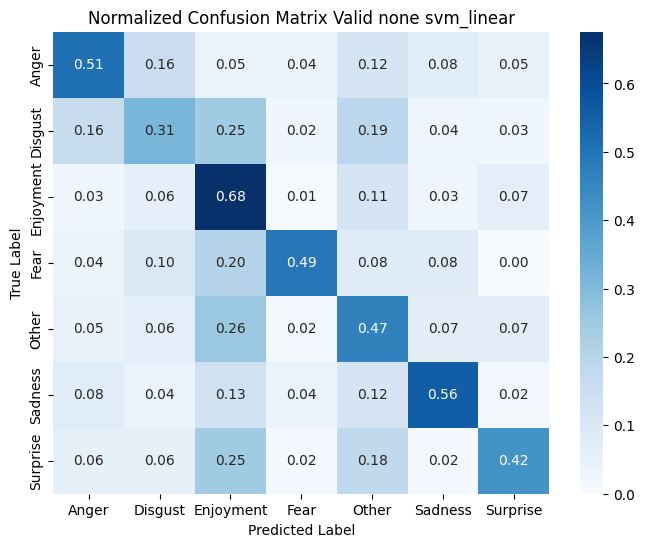

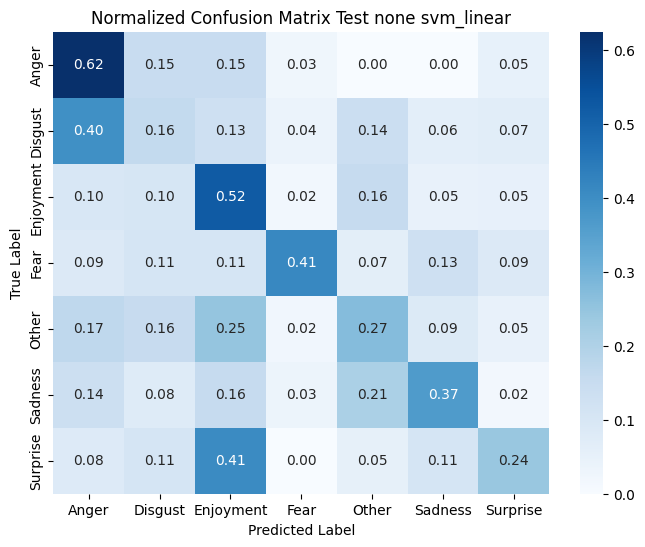

In [178]:
# SVM - linear - None (6:4)
model_64_svm_linear, train_64_svm_linear, valid_64_svm_linear, test_64_svm_linear, pred_64_svm_linear = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_64_svm_linear, y_valid_64_svm_linear, y_test_64_svm_linear = train_64_svm_linear[1], valid_64_svm_linear[1], test_64_svm_linear[1]
y_pred_train_64_svm_linear, y_pred_valid_64_svm_linear, y_pred_test_64_svm_linear = pred_64_svm_linear

pipeline_evaluation(
    y_train_64_svm_linear, y_valid_64_svm_linear, y_test_64_svm_linear,
    y_pred_train_64_svm_linear, y_pred_valid_64_svm_linear, y_pred_test_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 6:4 --- svm_poly --- none ---
Accuracy: 0.12168141592920353
Recall: 0.12168141592920353
Precision: 0.19986284694859613
F1-score: 0.06199481818714117

--- valid --- 6:4 --- svm_poly --- none ---
Accuracy: 0.10226644555002765
Recall: 0.10226644555002765
Precision: 0.13449885109989496
F1-score: 0.031014004159534883

--- test --- 6:4 --- svm_poly --- none ---
Accuracy: 0.059593023255813955
Recall: 0.059593023255813955
Precision: 0.07024559087370096
F1-score: 0.009242874167867378


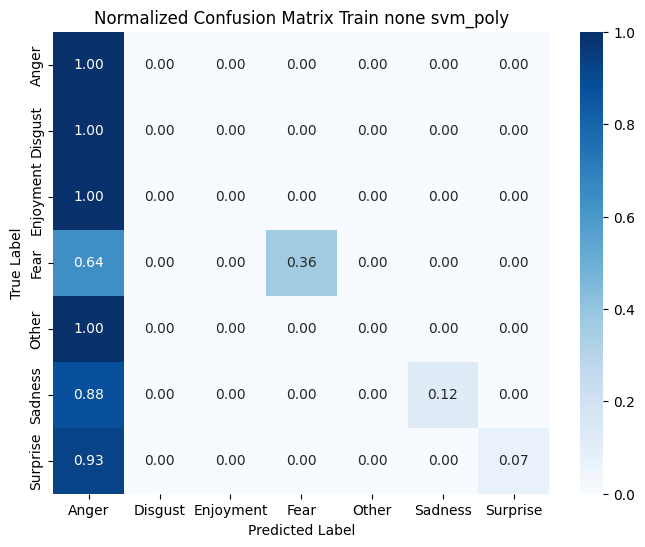

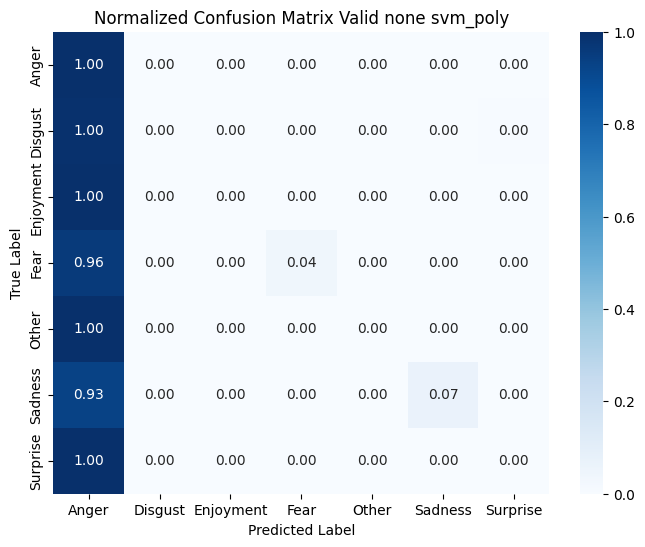

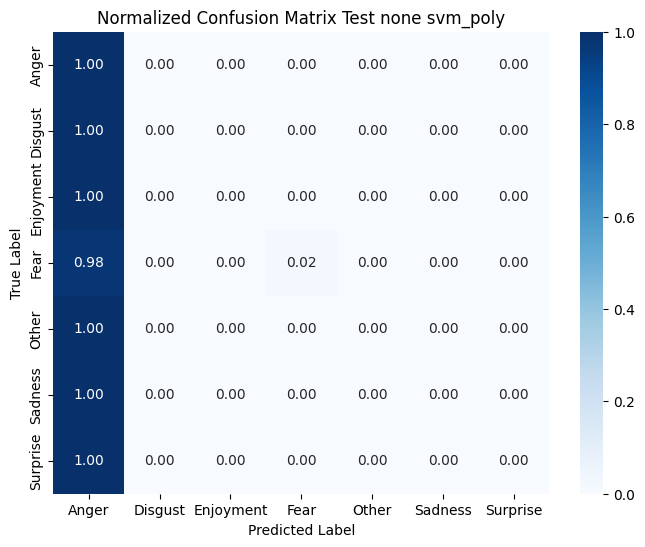

In [179]:
# SVM - poly - None (6:4)
model_64_svm_poly, train_64_svm_poly, valid_64_svm_poly, test_64_svm_poly, pred_64_svm_poly = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly = train_64_svm_poly[1], valid_64_svm_poly[1], test_64_svm_poly[1]
y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly = pred_64_svm_poly

pipeline_evaluation(
    y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly,
    y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

--- train --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.9498525073746312
Recall: 0.9498525073746312
Precision: 0.9528328946763991
F1-score: 0.9499333617117266

--- valid --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.538971807628524
Recall: 0.538971807628524
Precision: 0.549888434617122
F1-score: 0.5321656172771031

--- test --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.35755813953488375
Recall: 0.35755813953488375
Precision: 0.4560020036138573
F1-score: 0.34812441502406827


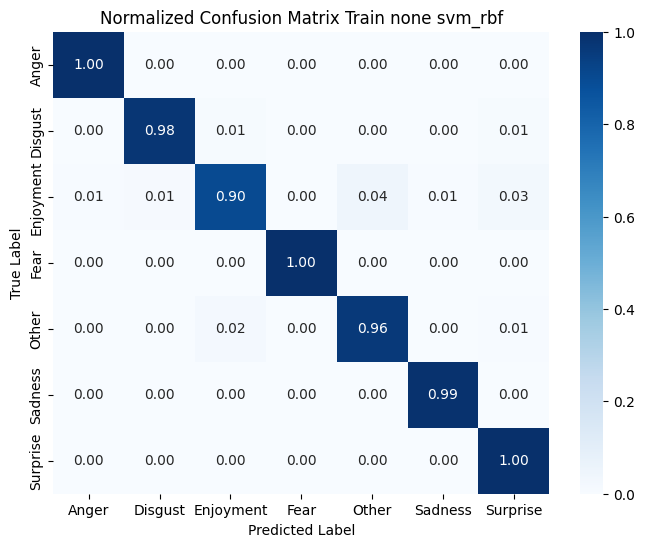

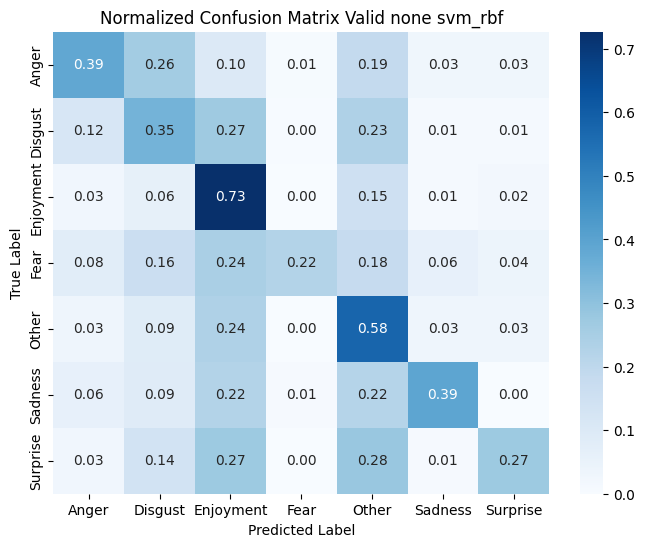

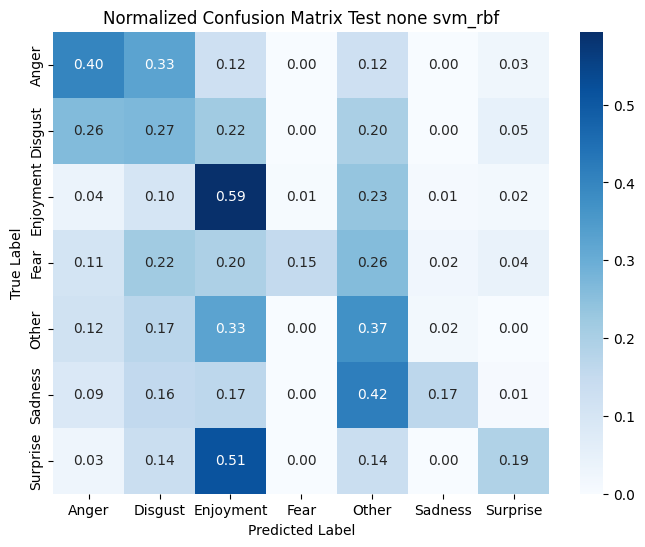

In [180]:
# SVM - rbf - None (6:4)
model_64_svm_rbf, train_64_svm_rbf, valid_64_svm_rbf, test_64_svm_rbf, pred_64_svm_rbf = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_64_svm_rbf, y_valid_64_svm_rbf, y_test_64_svm_rbf = train_64_svm_rbf[1], valid_64_svm_rbf[1], test_64_svm_rbf[1]
y_pred_train_64_svm_rbf, y_pred_valid_64_svm_rbf, y_pred_test_64_svm_rbf = pred_64_svm_rbf

pipeline_evaluation(
    y_train_64_svm_rbf, y_valid_64_svm_rbf, y_test_64_svm_rbf,
    y_pred_train_64_svm_rbf, y_pred_valid_64_svm_rbf, y_pred_test_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.8919616519174042
Recall: 0.8919616519174042
Precision: 0.8957273817908978
F1-score: 0.8920742182206345

--- valid --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.5290215588723052
Recall: 0.5290215588723052
Precision: 0.5297677102354851
F1-score: 0.5279069277884225

--- test --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.3633720930232558
Recall: 0.3633720930232558
Precision: 0.4052660378773049
F1-score: 0.3691653525938955


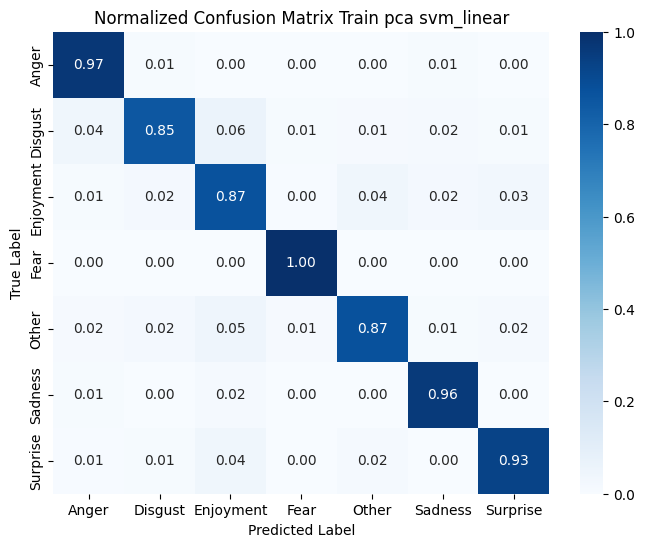

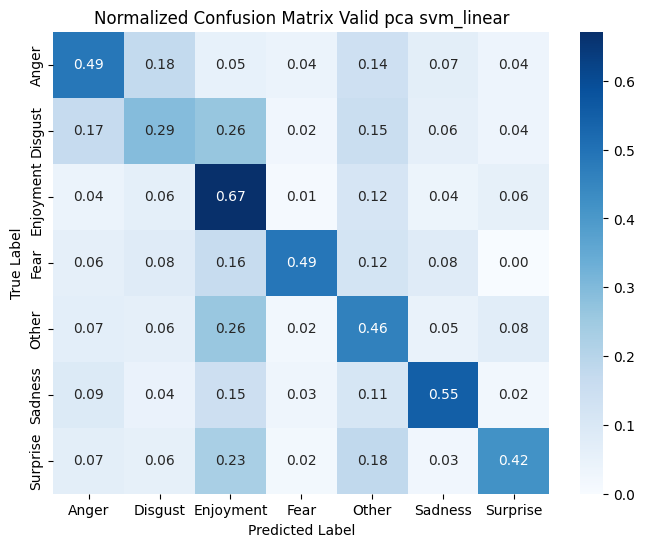

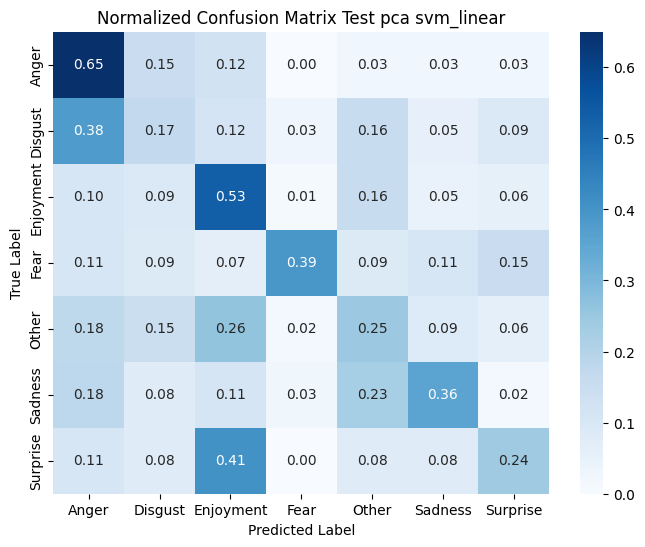

In [181]:
# SVM - linear - PCA (6:4)
model_pca_64_svm_linear, train_pca_64_svm_linear, valid_pca_64_svm_linear, test_pca_64_svm_linear, pred_pca_64_svm_linear = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_64_svm_linear, y_valid_pca_64_svm_linear, y_test_pca_64_svm_linear = train_pca_64_svm_linear[1], valid_pca_64_svm_linear[1], test_pca_64_svm_linear[1]
y_pred_train_pca_64_svm_linear, y_pred_valid_pca_64_svm_linear, y_pred_test_pca_64_svm_linear = pred_pca_64_svm_linear

pipeline_evaluation(
    y_train_pca_64_svm_linear, y_valid_pca_64_svm_linear, y_test_pca_64_svm_linear,
    y_pred_train_pca_64_svm_linear, y_pred_valid_pca_64_svm_linear, y_pred_test_pca_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.13089970501474926
Recall: 0.13089970501474926
Precision: 0.5825762909694938
F1-score: 0.07672183009009347

--- valid --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.10668877833056938
Recall: 0.10668877833056938
Precision: 0.5428403136212404
F1-score: 0.04031550154337196

--- test --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.06395348837209303
Recall: 0.06395348837209303
Precision: 0.3762247182403214
F1-score: 0.01765466468418669


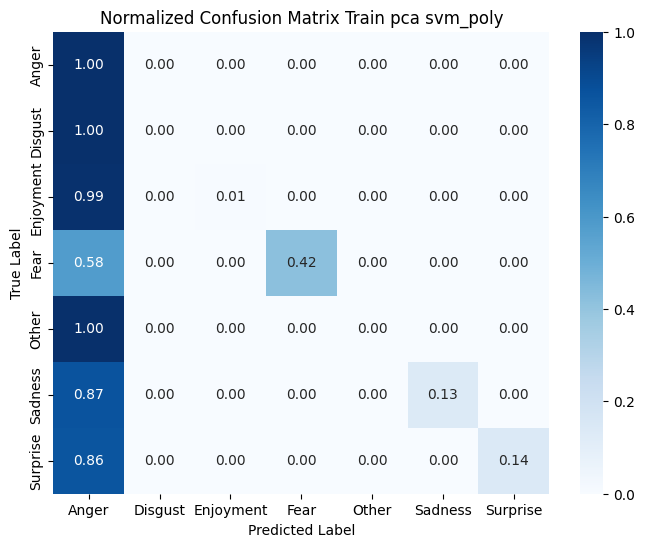

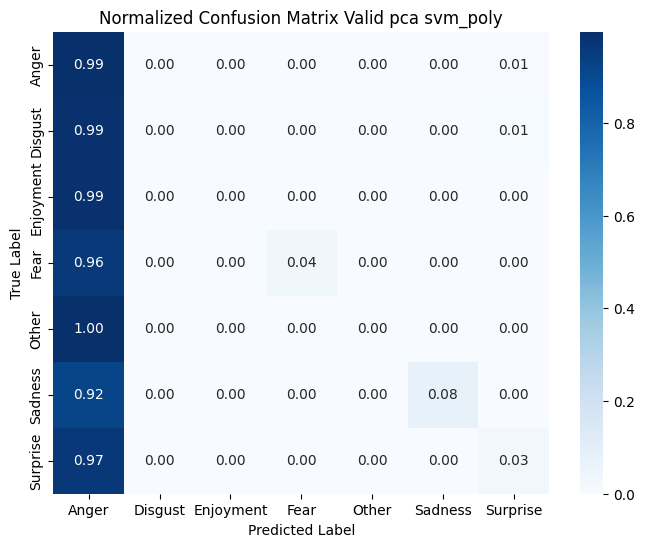

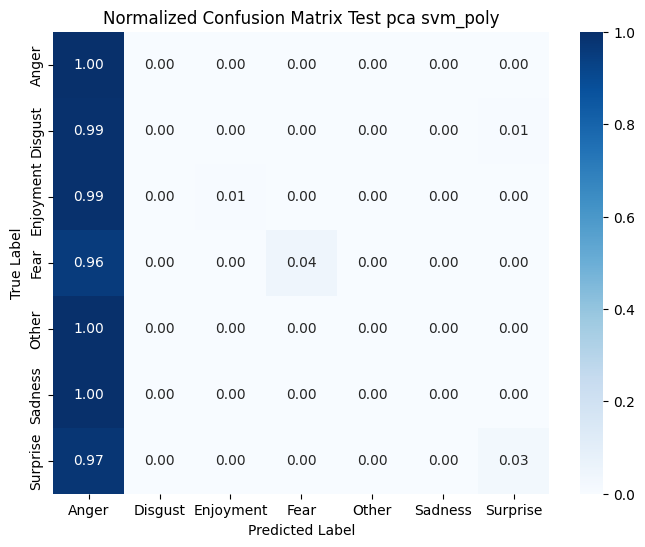

In [182]:
# SVM - poly - PCA (6:4)
model_pca_64_svm_poly, train_pca_64_svm_poly, valid_pca_64_svm_poly, test_pca_64_svm_poly, pred_pca_64_svm_poly = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly = train_pca_64_svm_poly[1], valid_pca_64_svm_poly[1], test_pca_64_svm_poly[1]
y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly = pred_pca_64_svm_poly

pipeline_evaluation(
    y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly,
    y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

--- train --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.9299410029498525
Recall: 0.9299410029498525
Precision: 0.9341066390210224
F1-score: 0.9298413659053805

--- valid --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.5146489773355445
Recall: 0.5146489773355445
Precision: 0.5465385207010358
F1-score: 0.5240185099899082

--- test --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.3488372093023256
Recall: 0.3488372093023256
Precision: 0.43802730474100415
F1-score: 0.35953025324337723


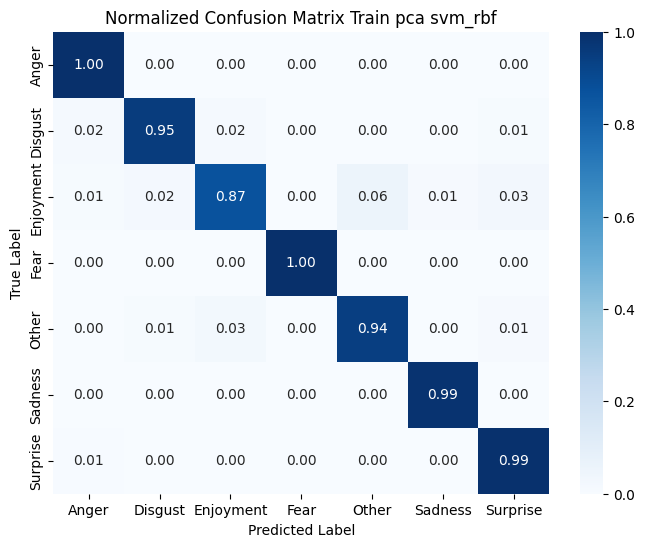

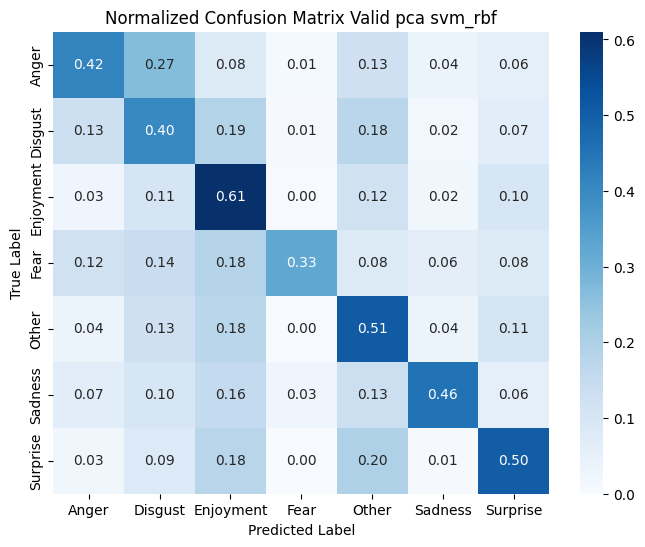

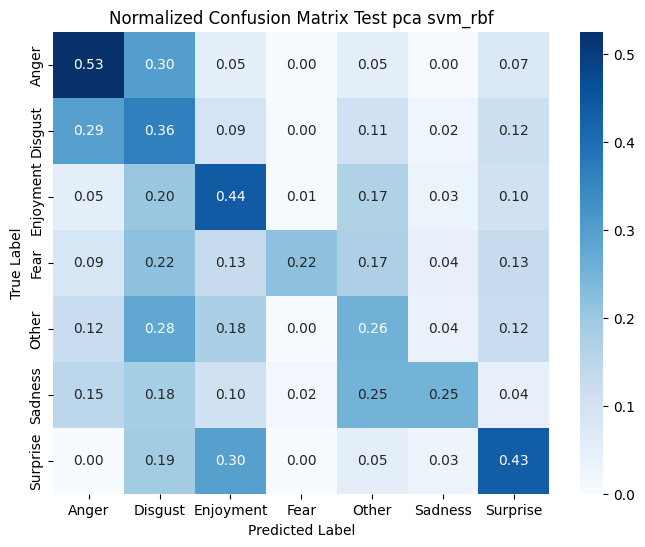

In [183]:
# SVM - rbf - PCA (6:4)
model_pca_64_svm_rbf, train_pca_64_svm_rbf, valid_pca_64_svm_rbf, test_pca_64_svm_rbf, pred_pca_64_svm_rbf = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_64_svm_rbf, y_valid_pca_64_svm_rbf, y_test_pca_64_svm_rbf = train_pca_64_svm_rbf[1], valid_pca_64_svm_rbf[1], test_pca_64_svm_rbf[1]
y_pred_train_pca_64_svm_rbf, y_pred_valid_pca_64_svm_rbf, y_pred_test_pca_64_svm_rbf = pred_pca_64_svm_rbf

pipeline_evaluation(
    y_train_pca_64_svm_rbf, y_valid_pca_64_svm_rbf, y_test_pca_64_svm_rbf,
    y_pred_train_pca_64_svm_rbf, y_pred_valid_pca_64_svm_rbf, y_pred_test_pca_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu LDA

--- train --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.9926253687315634
Recall: 0.9926253687315634
Precision: 0.9931937390175948
F1-score: 0.9927577014811516

--- valid --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.33499170812603646
Recall: 0.33499170812603646
Precision: 0.35871908963296556
F1-score: 0.33969628770903065

--- test --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.2761627906976744
Recall: 0.2761627906976744
Precision: 0.2931330360639108
F1-score: 0.2683664165080996


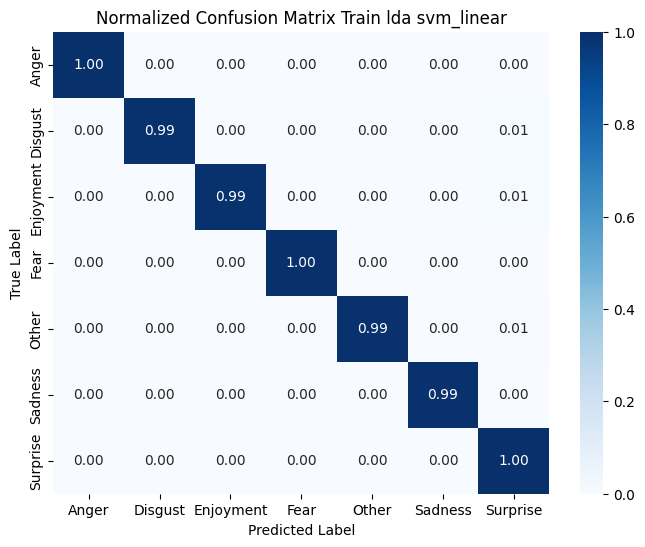

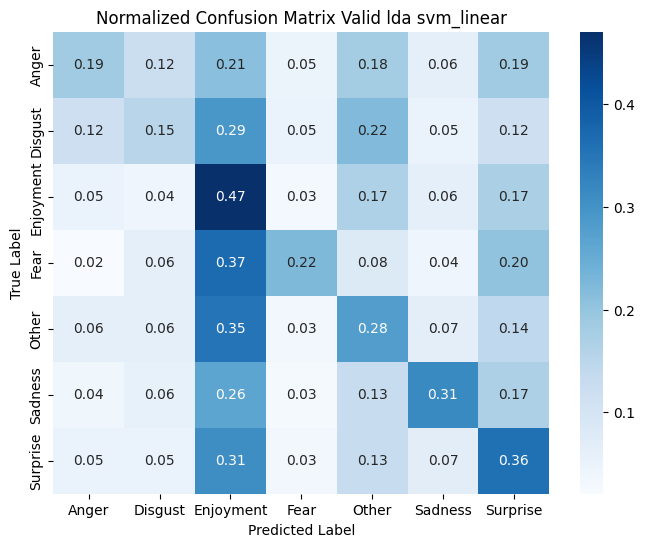

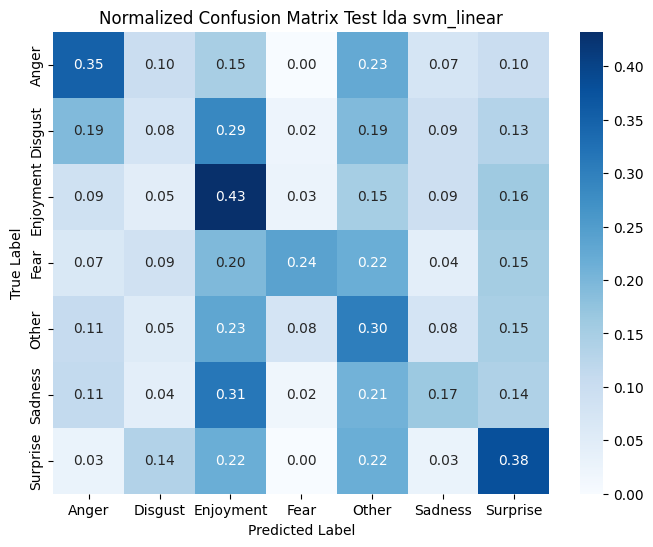

In [184]:
# SVM - linear - LDA (6:4)
model_lda_64_svm_linear, train_lda_64_svm_linear, valid_lda_64_svm_linear, test_lda_64_svm_linear, pred_lda_64_svm_linear = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_64_svm_linear, y_valid_lda_64_svm_linear, y_test_lda_64_svm_linear = train_lda_64_svm_linear[1], valid_lda_64_svm_linear[1], test_lda_64_svm_linear[1]
y_pred_train_lda_64_svm_linear, y_pred_valid_lda_64_svm_linear, y_pred_test_lda_64_svm_linear = pred_lda_64_svm_linear

pipeline_evaluation(
    y_train_lda_64_svm_linear, y_valid_lda_64_svm_linear, y_test_lda_64_svm_linear,
    y_pred_train_lda_64_svm_linear, y_pred_valid_lda_64_svm_linear, y_pred_test_lda_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.9878318584070797
Recall: 0.9878318584070797
Precision: 0.9882016085659805
F1-score: 0.9878137213441404

--- valid --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.28137092316196793
Recall: 0.28137092316196793
Precision: 0.3288674460665211
F1-score: 0.2911075019689436

--- test --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.21075581395348839
Recall: 0.21075581395348839
Precision: 0.23716879286969705
F1-score: 0.20953375755959786


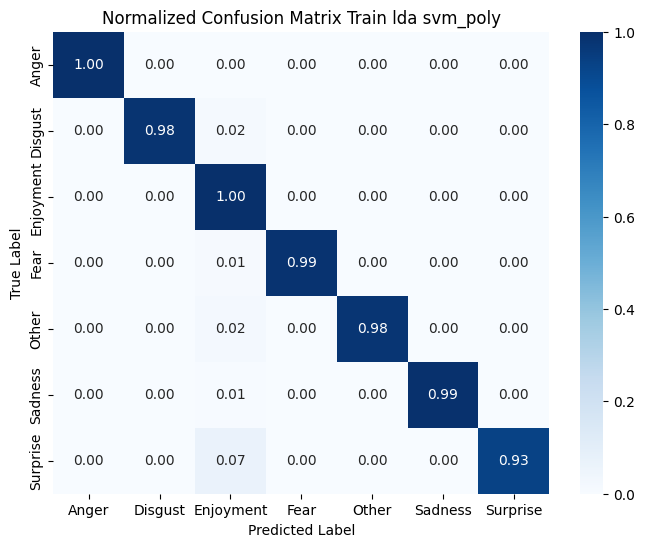

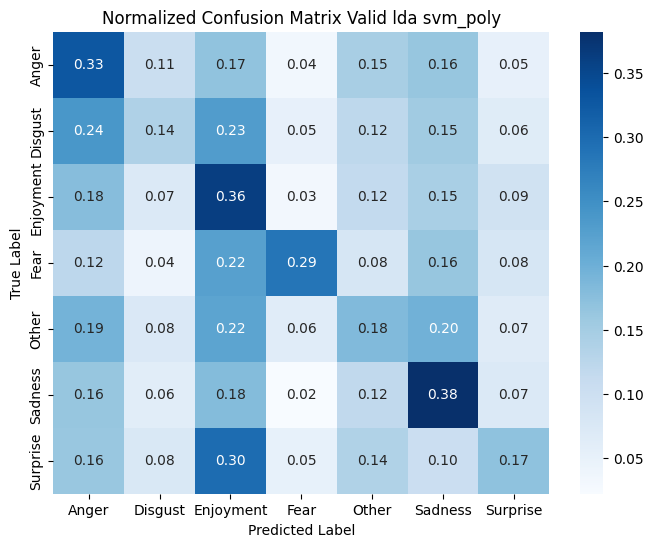

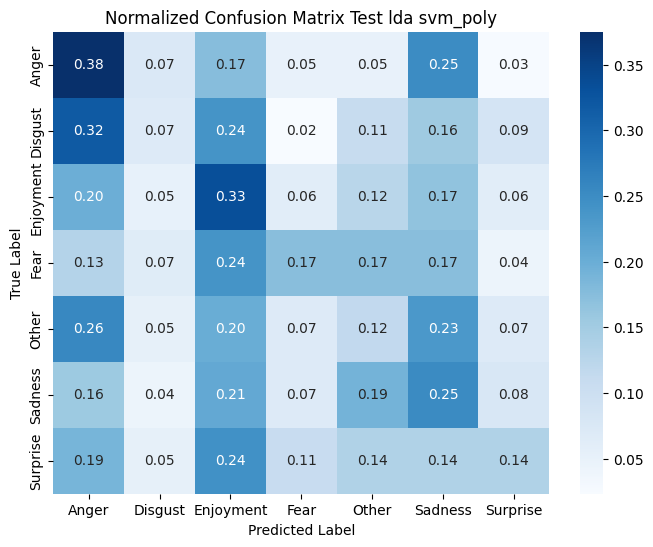

In [185]:
# SVM - poly - LDA (6:4)
model_lda_64_svm_poly, train_lda_64_svm_poly, valid_lda_64_svm_poly, test_lda_64_svm_poly, pred_lda_64_svm_poly = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly = train_lda_64_svm_poly[1], valid_lda_64_svm_poly[1], test_lda_64_svm_poly[1]
y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly = pred_lda_64_svm_poly

pipeline_evaluation(
    y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly,
    y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.9941002949852508
Recall: 0.9941002949852508
Precision: 0.994477847877941
F1-score: 0.9941881261648557

--- valid --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.3902708678828082
Recall: 0.3902708678828082
Precision: 0.2882141644417223
F1-score: 0.22428071760162985

--- test --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.27906976744186046
Recall: 0.27906976744186046
Precision: 0.09573997057658573
F1-score: 0.12424499814377765


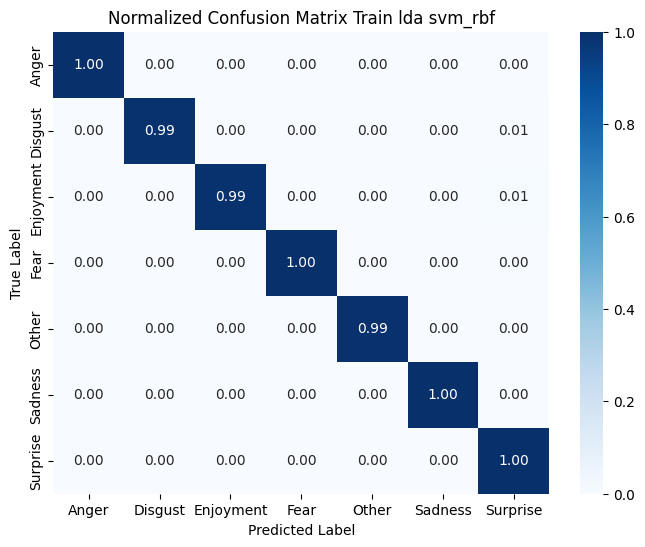

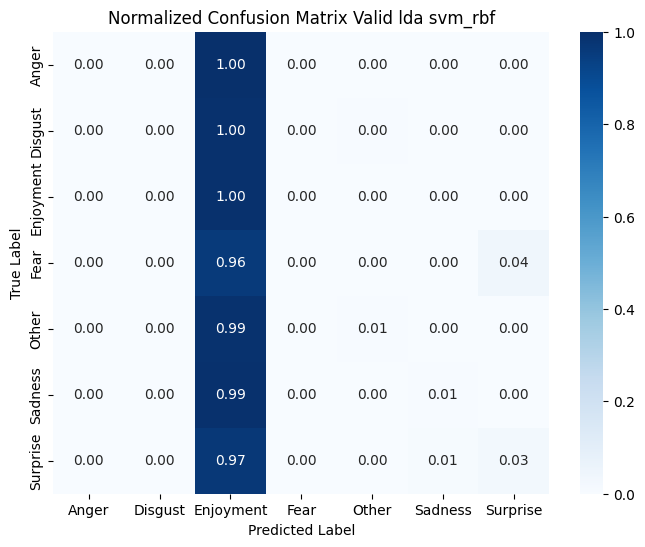

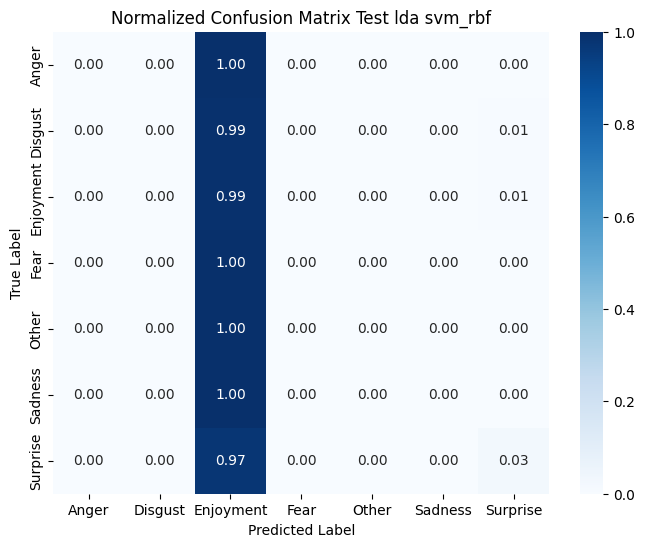

In [186]:
# SVM - rbf - LDA (6:4)
model_lda_64_svm_rbf, train_lda_64_svm_rbf, valid_lda_64_svm_rbf, test_lda_64_svm_rbf, pred_lda_64_svm_rbf = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_64_svm_rbf, y_valid_lda_64_svm_rbf, y_test_lda_64_svm_rbf = train_lda_64_svm_rbf[1], valid_lda_64_svm_rbf[1], test_lda_64_svm_rbf[1]
y_pred_train_lda_64_svm_rbf, y_pred_valid_lda_64_svm_rbf, y_pred_test_lda_64_svm_rbf = pred_lda_64_svm_rbf

pipeline_evaluation(
    y_train_lda_64_svm_rbf, y_valid_lda_64_svm_rbf, y_test_lda_64_svm_rbf,
    y_pred_train_lda_64_svm_rbf, y_pred_valid_lda_64_svm_rbf, y_pred_test_lda_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Xem kết quả dự đoán cho từng nhãn

In [187]:
from sklearn.metrics import classification_report

print(classification_report(y_test_73, y_pred_test_73, digits=4))

              precision    recall  f1-score   support

       Anger     0.1788    0.6750    0.2827        40
     Disgust     0.2308    0.2093    0.2195       129
   Enjoyment     0.6269    0.4375    0.5153       192
        Fear     0.5588    0.4130    0.4750        46
       Other     0.3083    0.2868    0.2972       129
     Sadness     0.5753    0.3652    0.4468       115
    Surprise     0.3051    0.4865    0.3750        37

    accuracy                         0.3692       688
   macro avg     0.3977    0.4105    0.3731       688
weighted avg     0.4364    0.3692    0.3837       688



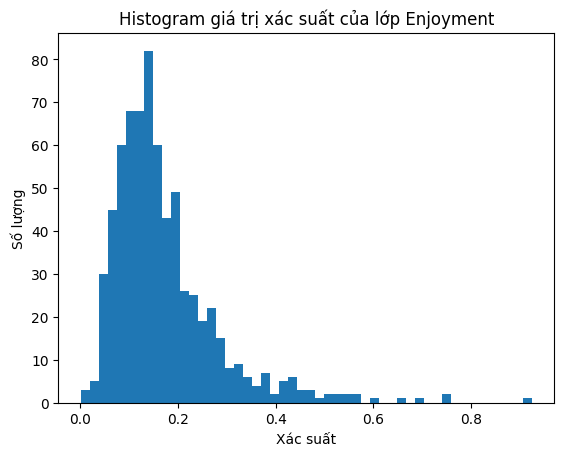

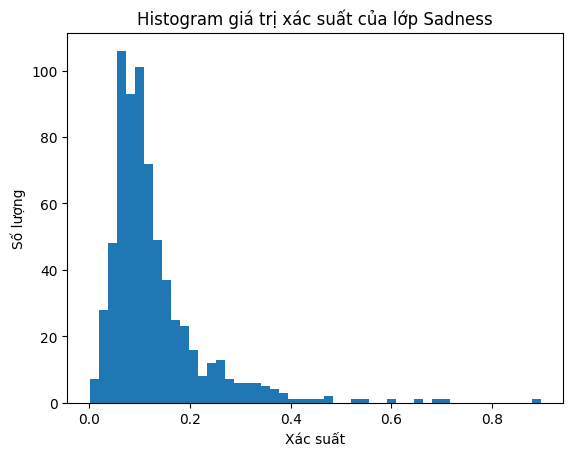

In [188]:
def plot_score_hist(model, X, label_name):
    scores = model.predict_proba(X)       # Trả về giá trị hàm quyết định
    classes = list(model.classes_)       # Các lớp của mô hình 

    # Lấy index của lớp lable_name
    idx = classes.index(label_name)
    
    # Lấy ra cột score của nhãn label_name 
    score = scores[:, idx]  

    plt.figure()
    plt.hist(score, bins=50)
    plt.title(f"Histogram giá trị xác suất của lớp {label_name}")
    plt.xlabel("Xác suất")
    plt.ylabel("Số lượng")
    plt.show()
    
    return score
    
# Chọn 1 mô hình bất kì   
model = model_82         # model logistic regression đã huấn luyện
X_test_processed, y_test = test_82

score_enj = plot_score_hist(model, X_test_processed, "Enjoyment")
score_sad = plot_score_hist(model, X_test_processed, "Sadness")

Nhận xét: 


- Lớp Enjoyment có F1 cao nhất và số lượng nhãn lớn nhất => Ổn định, ít nhiễu hơn và ít giao động khi chia tập DL 

- Dựa vào histogram ta thấy phân bố của lớp Enjoyment khá mượt và trải rộng => có nhiều mức điểm khác nhau cho mô hình ==> phù hợp làm đầu ra hồi quy

- Lớp Sadness cũng là một sự lựa chọn ổn, tuy nhiên phân bố không quá đẹp, không ổn định bằng Enjoyment và F1-Score của 2 lớp này cũng không chênh lệch nhiều

=> Chọn đầu ra hồi quy là giá trị hàm quyết định của lớp Enjoyment

# Chuyển bài toán sang hồi quy


## Các hàm xử lý cho hồi quy

In [189]:
import numpy as np
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.decomposition import PCA


### Hàm lấy softmax probability của lớp Enjoyment


In [190]:
def get_enjoyment_score(model, X_data):

    # Lấy tất cả softmax probabilities cho tất cả các lớp
    probabilities = model.predict_proba(X_data)  # Shape: (n_samples, n_classes)
    
    # Tìm index của lớp Enjoyment
    classes = list(model.classes_)
    idx_enjoyment = classes.index("Enjoyment")
    
    # Lấy cột probability của lớp Enjoyment
    prob_enjoyment = probabilities[:, idx_enjoyment]
    
    return prob_enjoyment


### Hàm đánh giá mô hình hồi quy (MSE, MAE, R2)


In [191]:
def evaluate_regression(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    return {"MSE": mse, "MAE": mae, "R2": r2}


### Hồi quy tuyến tính (L2 regularization)


In [192]:
# alpha: hệ số regularization
def train_ridge(X_train, y_train, alpha=1.0, random_state=11):
    ridge = Ridge(alpha=alpha, random_state=random_state)
    ridge.fit(X_train, y_train)
    return ridge


### KNN


In [193]:
def train_knn_regressor(X_train, y_train, metric='cosine', n_jobs=-1):
    k = int(np.sqrt(len(X_train)))
    knn = KNeighborsRegressor(n_neighbors=k, metric=metric, n_jobs=n_jobs)
    knn.fit(X_train, y_train)
    return knn


### Hàm lựa chọn mô hình hồi quy


Hệ số cho mô hình
- model_type: loại mô hình
- alpha: hệ số regularization 
- metric: metric của KNN (cosine,...)

In [194]:
def use_regression_model(model_type, X_train, y_train, alpha=1.0, metric='cosine'):
    if model_type == "ridge":
        return train_ridge(X_train, y_train, alpha=alpha)
    elif model_type == "knn":
        return train_knn_regressor(X_train, y_train, metric=metric)
    else:
        raise ValueError(f"Unknown model_type: {model_type}. Use 'ridge' or 'knn'")


### Hàm dự đoán hồi quy


In [195]:
def predict_regression(model, X_train, X_valid, X_test):
    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)
    
    return y_pred_train, y_pred_valid, y_pred_test


### Hàm chuẩn bị dữ liệu 

- Input là dữ liệu sau TF-IDF của model lựa chọn (model đã trả về dữ liệu này)
- Lấy softmax probabilities từ model có kết quả phân loại tốt nhất (chọn model_73)
- Áp dụng PCA (1/3, tùy chọn)

In [196]:
def prepare_data_for_regression(classification_model, X_train_valid, X_test, 
                                 y_train_valid, y_test,
                                 train_size=7, valid_size=3,
                                 discriminant="none", n_components_pca=None, random_state=11):

    
    # 1. Lấy giá trị softmax probalilities từ classification_model cho train_valid và test
    z_train_valid = get_enjoyment_score(classification_model, X_train_valid)
    z_test = get_enjoyment_score(classification_model, X_test)
    
    # 2. Chia train_valid
    print(f"Tỉ lệ train - valid {train_size}:{valid_size}")
    X_train_reg, X_valid_reg, z_train_reg, z_valid_reg = train_test_split(
        X_train_valid, z_train_valid,
        test_size=valid_size/(train_size + valid_size),
        random_state=random_state,
        stratify=y_train_valid 
    )
    
    # 3. Giảm chiều (1/3, tùy chọn)
    if discriminant == 'pca':
        if n_components_pca is None:
            n_components_pca = max(1, int(X_train_reg.shape[1] / 3))
        
        print(f'PCA: {X_train_reg.shape[1]} -> {n_components_pca} chiều')
        pca_reducer = PCA(n_components=n_components_pca, random_state=random_state)
        X_train_processed = pca_reducer.fit_transform(X_train_reg)
        X_valid_processed = pca_reducer.transform(X_valid_reg)
        X_test_processed = pca_reducer.transform(X_test)
        
        print(f'PCA explained variance ratio: {pca_reducer.explained_variance_ratio_.sum():.4f}')
        discriminant_model = pca_reducer
    else:
        X_train_processed = X_train_reg
        X_valid_processed = X_valid_reg
        X_test_processed = X_test
        discriminant_model = None
    
    return (X_train_processed, X_valid_processed, X_test_processed,
            z_train_reg, z_valid_reg, z_test,
            discriminant_model)

## Pipeline hồi quy


In [197]:
def pipeline_regression(X_train, X_valid, X_test, z_train, z_valid, z_test,
                        regression_model_type='ridge', alpha=1.0, metric='cosine',
                        random_state=11):

    # Đặt lại tên cho tường minh
    X_reg_train, y_reg_train = X_train, z_train
    X_reg_valid, y_reg_valid = X_valid, z_valid
    X_reg_test, y_reg_test = X_test, z_test

    print(f'Tập hồi quy - Train: {X_reg_train.shape}, Valid: {X_reg_valid.shape}, Test: {X_reg_test.shape}')
    print()

    # Huấn luyện mô hình hồi quy
    regression_model = use_regression_model(regression_model_type, X_reg_train, y_reg_train,
                                            alpha=alpha, metric=metric)

    # Dự đoán
    y_pred_train, y_pred_valid, y_pred_test = predict_regression(
        regression_model, X_reg_train, X_reg_valid, X_reg_test
    )

    # Đánh giá mô hình
    metrics_train = evaluate_regression(y_reg_train, y_pred_train)
    metrics_valid = evaluate_regression(y_reg_valid, y_pred_valid)
    metrics_test = evaluate_regression(y_reg_test, y_pred_test)

    return (regression_model,
            (X_reg_train, X_reg_valid, X_reg_test),
            (y_reg_train, y_reg_valid, y_reg_test),
            (y_pred_train, y_pred_valid, y_pred_test),
            (metrics_train, metrics_valid, metrics_test))


## Hàm đánh giá và hiển thị kết quả


In [198]:
def pipeline_evaluation_regression(metrics_train, metrics_valid, metrics_test,
                                   regression_model_type, discriminant, data_type=""):
    print(f"=== {regression_model_type.upper()} Regression - {discriminant.upper()} {data_type} ===")
    print()
    
    print("--- Train ---")
    print(f"MSE = {metrics_train['MSE']:.6f}")
    print(f"MAE = {metrics_train['MAE']:.6f}")
    print(f"R2  = {metrics_train['R2']:.6f}")
    print()
    
    print("--- Valid ---")
    print(f"MSE = {metrics_valid['MSE']:.6f}")
    print(f"MAE = {metrics_valid['MAE']:.6f}")
    print(f"R2  = {metrics_valid['R2']:.6f}")
    print()
    
    print("--- Test ---")
    print(f"MSE = {metrics_test['MSE']:.6f}")
    print(f"MAE = {metrics_test['MAE']:.6f}")
    print(f"R2  = {metrics_test['R2']:.6f}")
    print()
    print("=" * 80)
    print()


## Tạo bộ dữ liệu hồi quy

In [199]:
import numpy as np

In [200]:
X_train_73_reg = train_73[0]
X_valid_73_reg = valid_73[0]
X_test_reg = test_73[0]
y_train_73_cls = train_73[1]
y_valid_73_cls = valid_73[1]
y_test_cls = test_73[1]

# Gộp train và valid thành train_valid
X_train_valid_reg = np.vstack([X_train_73_reg, X_valid_73_reg])
y_train_valid_reg = np.concatenate([y_train_73_cls, y_valid_73_cls])

print("============== Kích thước ===============")
print(f"train_valid: {X_train_valid_reg.shape}, test: {X_test_reg.shape}")
print(f"labels train_valid: {y_train_valid_reg.shape}, test: {y_test_cls.shape}")

============== Kích thước ===============
train_valid: (4521, 5115), test: (688, 5115)
labels train_valid: (4521,), test: (688,)


## Train:Validation = 8:2

### Hồi quy tuyến tính (Ridge L2)

#### Dữ liệu gốc

In [201]:
X_train_reg_82, X_valid_reg_82, X_test_reg_82, \
z_train_reg_82, z_valid_reg_82, z_test_reg_82, disc_model_reg_82 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=8,
    valid_size=2,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_82_model, X_reg_82, y_reg_82, y_pred_ridge_82, metrics_ridge_82 = pipeline_regression(
    X_train_reg_82, X_valid_reg_82, X_test_reg_82,
    z_train_reg_82, z_valid_reg_82, z_test_reg_82,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_82[0], metrics_ridge_82[1], metrics_ridge_82[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(8:2)"
)

Tỉ lệ train - valid 8:2
Tập hồi quy - Train: (3616, 5115), Valid: (905, 5115), Test: (688, 5115)

=== RIDGE Regression - NONE (8:2) ===

--- Train ---
MSE = 0.000815
MAE = 0.021719
R2  = 0.963052

--- Valid ---
MSE = 0.001671
MAE = 0.031191
R2  = 0.929765

--- Test ---
MSE = 0.000803
MAE = 0.020088
R2  = 0.931986




#### Dữ liệu PCA

In [202]:
X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82, \
z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82, disc_model_reg_pca_82 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=8,
    valid_size=2,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính = 1/3 rồi nên không cần nữa
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_82_model, X_reg_pca_82, y_reg_pca_82, y_pred_ridge_pca_82, metrics_ridge_pca_82 = pipeline_regression(
    X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82,
    z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_82[0], metrics_ridge_pca_82[1], metrics_ridge_pca_82[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(8:2)"
)

Tỉ lệ train - valid 8:2
PCA: 5115 -> 1705 chiều
PCA explained variance ratio: 0.9287
Tập hồi quy - Train: (3616, 1705), Valid: (905, 1705), Test: (688, 1705)

=== RIDGE Regression - PCA (8:2) ===

--- Train ---
MSE = 0.000905
MAE = 0.022963
R2  = 0.958953

--- Valid ---
MSE = 0.001749
MAE = 0.031958
R2  = 0.926485

--- Test ---
MSE = 0.000841
MAE = 0.020715
R2  = 0.928733




### KNN

#### Bộ dữ liệu không giảm chiều 

In [203]:
# KNN / None
knn_82_model, X_reg_82_knn, y_reg_82_knn, y_pred_knn_82, metrics_knn_82 = pipeline_regression(
    X_train_reg_82, X_valid_reg_82, X_test_reg_82,
    z_train_reg_82, z_valid_reg_82, z_test_reg_82,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_82[0], metrics_knn_82[1], metrics_knn_82[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(8:2)"
)

Tập hồi quy - Train: (3616, 5115), Valid: (905, 5115), Test: (688, 5115)

=== KNN Regression - NONE (8:2) ===

--- Train ---
MSE = 0.007908
MAE = 0.071038
R2  = 0.641304

--- Valid ---
MSE = 0.008362
MAE = 0.072229
R2  = 0.648533

--- Test ---
MSE = 0.004988
MAE = 0.056319
R2  = 0.577436




In [204]:
# KNN / PCA
knn_pca_82_model, X_reg_pca_82_knn, y_reg_pca_82_knn, y_pred_knn_pca_82, metrics_knn_pca_82 = pipeline_regression(
    X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82,
    z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_82[0], metrics_knn_pca_82[1], metrics_knn_pca_82[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(8:2)"
)

Tập hồi quy - Train: (3616, 1705), Valid: (905, 1705), Test: (688, 1705)

=== KNN Regression - PCA (8:2) ===

--- Train ---
MSE = 0.007851
MAE = 0.070630
R2  = 0.643874

--- Valid ---
MSE = 0.008265
MAE = 0.071395
R2  = 0.652620

--- Test ---
MSE = 0.004902
MAE = 0.055897
R2  = 0.584717




## Train:Validation = 7:3

### Ridge Regression

#### Bộ dữ liệu không giảm chiều

In [205]:
# Chuẩn bị dữ liệu
X_train_reg_73, X_valid_reg_73, X_test_reg_73, \
z_train_reg_73, z_valid_reg_73, z_test_reg_73, disc_model_reg_73 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=7,
    valid_size=3,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_73_model, X_reg_73, y_reg_73, y_pred_ridge_73, metrics_ridge_73 = pipeline_regression(
    X_train_reg_73, X_valid_reg_73, X_test_reg_73,
    z_train_reg_73, z_valid_reg_73, z_test_reg_73,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_73[0], metrics_ridge_73[1], metrics_ridge_73[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(7:3)"
)

Tỉ lệ train - valid 7:3
Tập hồi quy - Train: (3164, 5115), Valid: (1357, 5115), Test: (688, 5115)

=== RIDGE Regression - NONE (7:3) ===

--- Train ---
MSE = 0.000858
MAE = 0.022437
R2  = 0.961198

--- Valid ---
MSE = 0.001847
MAE = 0.032474
R2  = 0.919879

--- Test ---
MSE = 0.000843
MAE = 0.020847
R2  = 0.928611




### Bộ dữ liệu PCA

In [206]:
# Chuẩn bị dữ liệu 
X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73, \
z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73, disc_model_reg_pca_73 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=7,
    valid_size=3,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính 1/3 rồi nên không cần nữa 
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_73_model, X_reg_pca_73, y_reg_pca_73, y_pred_ridge_pca_73, metrics_ridge_pca_73 = pipeline_regression(
    X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73,
    z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_73[0], metrics_ridge_pca_73[1], metrics_ridge_pca_73[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(7:3)"
)

Tỉ lệ train - valid 7:3
PCA: 5115 -> 1705 chiều
PCA explained variance ratio: 0.9431
Tập hồi quy - Train: (3164, 1705), Valid: (1357, 1705), Test: (688, 1705)

=== RIDGE Regression - PCA (7:3) ===

--- Train ---
MSE = 0.000933
MAE = 0.023438
R2  = 0.957811

--- Valid ---
MSE = 0.001913
MAE = 0.033012
R2  = 0.917018

--- Test ---
MSE = 0.000877
MAE = 0.021289
R2  = 0.925713




### KNN

#### Bộ dữ liệu không giảm chiều

In [207]:
# KNN / None
knn_73_model, X_reg_73_knn, y_reg_73_knn, y_pred_knn_73, metrics_knn_73 = pipeline_regression(
    X_train_reg_73, X_valid_reg_73, X_test_reg_73,
    z_train_reg_73, z_valid_reg_73, z_test_reg_73,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_73[0], metrics_knn_73[1], metrics_knn_73[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(7:3)"
)

Tập hồi quy - Train: (3164, 5115), Valid: (1357, 5115), Test: (688, 5115)

=== KNN Regression - NONE (7:3) ===

--- Train ---
MSE = 0.008098
MAE = 0.072063
R2  = 0.633807

--- Valid ---
MSE = 0.008218
MAE = 0.072050
R2  = 0.643483

--- Test ---
MSE = 0.005034
MAE = 0.056730
R2  = 0.573537




In [208]:
# KNN / PCA
knn_pca_73_model, X_reg_pca_73_knn, y_reg_pca_73_knn, y_pred_knn_pca_73, metrics_knn_pca_73 = pipeline_regression(
    X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73,
    z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_73[0], metrics_knn_pca_73[1], metrics_knn_pca_73[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(7:3)"
)

Tập hồi quy - Train: (3164, 1705), Valid: (1357, 1705), Test: (688, 1705)

=== KNN Regression - PCA (7:3) ===

--- Train ---
MSE = 0.008061
MAE = 0.071604
R2  = 0.635478

--- Valid ---
MSE = 0.008173
MAE = 0.071722
R2  = 0.645455

--- Test ---
MSE = 0.004937
MAE = 0.056128
R2  = 0.581736




## Train:Validation = 6:4

### Ridge Regression

#### Bộ dữ liệu không giảm chiều

In [209]:
# Chuẩn bị dữ liệu
X_train_reg_64, X_valid_reg_64, X_test_reg_64, \
z_train_reg_64, z_valid_reg_64, z_test_reg_64, disc_model_reg_64 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=6,
    valid_size=4,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_64_model, X_reg_64, y_reg_64, y_pred_ridge_64, metrics_ridge_64 = pipeline_regression(
    X_train_reg_64, X_valid_reg_64, X_test_reg_64,
    z_train_reg_64, z_valid_reg_64, z_test_reg_64,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_64[0], metrics_ridge_64[1], metrics_ridge_64[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(6:4)"
)

Tỉ lệ train - valid 6:4
Tập hồi quy - Train: (2712, 5115), Valid: (1809, 5115), Test: (688, 5115)

=== RIDGE Regression - NONE (6:4) ===

--- Train ---
MSE = 0.000932
MAE = 0.023338
R2  = 0.957246

--- Valid ---
MSE = 0.002071
MAE = 0.034799
R2  = 0.911141

--- Test ---
MSE = 0.000910
MAE = 0.021650
R2  = 0.922891




#### Bộ dữ liệu sau khi PCA

In [210]:
# Chuẩn bị dữ liệu 
X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64, \
z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64, disc_model_reg_pca_64 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=6,
    valid_size=4,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính = 1/3 số chiều
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_64_model, X_reg_pca_64, y_reg_pca_64, y_pred_ridge_pca_64, metrics_ridge_pca_64 = pipeline_regression(
    X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64,
    z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_64[0], metrics_ridge_pca_64[1], metrics_ridge_pca_64[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(6:4)"
)

Tỉ lệ train - valid 6:4


PCA: 5115 -> 1705 chiều
PCA explained variance ratio: 0.9598
Tập hồi quy - Train: (2712, 1705), Valid: (1809, 1705), Test: (688, 1705)

=== RIDGE Regression - PCA (6:4) ===

--- Train ---
MSE = 0.000989
MAE = 0.024056
R2  = 0.954629

--- Valid ---
MSE = 0.002120
MAE = 0.035267
R2  = 0.909023

--- Test ---
MSE = 0.000938
MAE = 0.022106
R2  = 0.920524




## KNN

### Bộ dữ liệu không giảm chiều

In [211]:
# KNN / None
knn_64_model, X_reg_64_knn, y_reg_64_knn, y_pred_knn_64, metrics_knn_64 = pipeline_regression(
    X_train_reg_64, X_valid_reg_64, X_test_reg_64,
    z_train_reg_64, z_valid_reg_64, z_test_reg_64,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_64[0], metrics_knn_64[1], metrics_knn_64[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(6:4)"
)

Tập hồi quy - Train: (2712, 5115), Valid: (1809, 5115), Test: (688, 5115)



=== KNN Regression - NONE (6:4) ===

--- Train ---
MSE = 0.008562
MAE = 0.074040
R2  = 0.607082

--- Valid ---
MSE = 0.008882
MAE = 0.074476
R2  = 0.618873

--- Test ---
MSE = 0.005246
MAE = 0.057512
R2  = 0.555519




#### Bộ dữ liệu sau PCA

In [212]:
# KNN / PCA
knn_pca_64_model, X_reg_pca_64_knn, y_reg_pca_64_knn, y_pred_knn_pca_64, metrics_knn_pca_64 = pipeline_regression(
    X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64,
    z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_64[0], metrics_knn_pca_64[1], metrics_knn_pca_64[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(6:4)"
)

Tập hồi quy - Train: (2712, 1705), Valid: (1809, 1705), Test: (688, 1705)



=== KNN Regression - PCA (6:4) ===

--- Train ---
MSE = 0.008509
MAE = 0.073482
R2  = 0.609511

--- Valid ---
MSE = 0.008869
MAE = 0.074117
R2  = 0.619405

--- Test ---
MSE = 0.005149
MAE = 0.056956
R2  = 0.563813




# So sánh và đánh giá kết quả

In [213]:
# Tạo bảng so sánh kết quả
print("=" * 100)
print("BẢNG SO SÁNH KẾT QUẢ HỒI QUY")
print("=" * 100)
print(f"{'Mô hình':<25} {'Tỉ lệ':<10} {'Dữ liệu':<15} {'MSE (Test)':<15} {'MAE (Test)':<15} {'R2 (Test)':<15}")
print("-" * 100)
print(f"{'Ridge Regression':<25} {'8:2':<10} {'Gốc':<15} {metrics_ridge_82[2]['MSE']:<15.6f} {metrics_ridge_82[2]['MAE']:<15.6f} {metrics_ridge_82[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'8:2':<10} {'PCA':<15} {metrics_ridge_pca_82[2]['MSE']:<15.6f} {metrics_ridge_pca_82[2]['MAE']:<15.6f} {metrics_ridge_pca_82[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'7:3':<10} {'Gốc':<15} {metrics_ridge_73[2]['MSE']:<15.6f} {metrics_ridge_73[2]['MAE']:<15.6f} {metrics_ridge_73[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'7:3':<10} {'PCA':<15} {metrics_ridge_pca_73[2]['MSE']:<15.6f} {metrics_ridge_pca_73[2]['MAE']:<15.6f} {metrics_ridge_pca_73[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'6:4':<10} {'Gốc':<15} {metrics_ridge_64[2]['MSE']:<15.6f} {metrics_ridge_64[2]['MAE']:<15.6f} {metrics_ridge_64[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'6:4':<10} {'PCA':<15} {metrics_ridge_pca_64[2]['MSE']:<15.6f} {metrics_ridge_pca_64[2]['MAE']:<15.6f} {metrics_ridge_pca_64[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'8:2':<10} {'Gốc':<15} {metrics_knn_82[2]['MSE']:<15.6f} {metrics_knn_82[2]['MAE']:<15.6f} {metrics_knn_82[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'8:2':<10} {'PCA':<15} {metrics_knn_pca_82[2]['MSE']:<15.6f} {metrics_knn_pca_82[2]['MAE']:<15.6f} {metrics_knn_pca_82[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'7:3':<10} {'Gốc':<15} {metrics_knn_73[2]['MSE']:<15.6f} {metrics_knn_73[2]['MAE']:<15.6f} {metrics_knn_73[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'7:3':<10} {'PCA':<15} {metrics_knn_pca_73[2]['MSE']:<15.6f} {metrics_knn_pca_73[2]['MAE']:<15.6f} {metrics_knn_pca_73[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'6:4':<10} {'Gốc':<15} {metrics_knn_64[2]['MSE']:<15.6f} {metrics_knn_64[2]['MAE']:<15.6f} {metrics_knn_64[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'6:4':<10} {'PCA':<15} {metrics_knn_pca_64[2]['MSE']:<15.6f} {metrics_knn_pca_64[2]['MAE']:<15.6f} {metrics_knn_pca_64[2]['R2']:<15.6f}")
print("=" * 100)


BẢNG SO SÁNH KẾT QUẢ HỒI QUY
Mô hình                   Tỉ lệ      Dữ liệu         MSE (Test)      MAE (Test)      R2 (Test)      
----------------------------------------------------------------------------------------------------
Ridge Regression          8:2        Gốc             0.000803        0.020088        0.931986       
Ridge Regression          8:2        PCA             0.000841        0.020715        0.928733       
Ridge Regression          7:3        Gốc             0.000843        0.020847        0.928611       
Ridge Regression          7:3        PCA             0.000877        0.021289        0.925713       
Ridge Regression          6:4        Gốc             0.000910        0.021650        0.922891       
Ridge Regression          6:4        PCA             0.000938        0.022106        0.920524       
KNN Regressor             8:2        Gốc             0.004988        0.056319        0.577436       
KNN Regressor             8:2        PCA             0.004902 

In [214]:
def plot_regression_correlation(y_true, y_pred, title='Correlation'):
    corr = np.corrcoef(y_true, y_pred)[0, 1]
    plt.figure(figsize=(6, 6))
    plt.scatter(y_true, y_pred, s=10, alpha=0.5)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f"{title} (corr={corr:.4f})")
    plt.grid(True, alpha=0.3)
    plt.show()
    return corr
